In [16]:
import pennylane as qml
from pennylane import numpy as np

from tqdm import tqdm
from IPython.display import clear_output

import torch
from torch.autograd import Variable
from torchvision import datasets, transforms
from functools import reduce
import random
import math
import matplotlib.pyplot as plt
import pickle
import pandas as pd

In [17]:
from pennylane import numpy as np
import matplotlib.pyplot as plt

def generate_points_distribution(data_num=2000, dist_type="circle"):
    if dist_type == 'spiral':
        theta = np.linspace(0, 5*np.pi, data_num)  # 각도 범위를 정의합니다.
        radius = np.linspace(0, 0.3, data_num)  # 반지름 범위를 정의합니다.
        xx = 0.5 + radius * np.cos(theta) + 0.012 * np.random.randn(data_num)  # x 좌표 계산
        yy = 0.5 + radius * np.sin(theta) + 0.012 * np.random.randn(data_num)  # y 좌표 계산
    
    elif dist_type == 'box':
        xx = np.random.uniform(0.3, 0.7, data_num) + 0.012 * np.random.randn(data_num)  # x 좌표 계산
        yy = np.random.uniform(0.3, 0.7, data_num) + 0.012 * np.random.randn(data_num)  # y 좌표 계산

    elif dist_type == 'curve':
        xx = np.linspace(0.15, 0.85, data_num) + 0.02 * np.random.randn(data_num)  # x 좌표 계산
        yy = 3.8 * xx*xx - 3.8 * xx + 1.2 + 0.03 * np.random.randn(data_num)  # y 좌표 계산
    
    elif dist_type == 'circle':
        radius = 0.20
        theta = np.linspace(0, 2 * np.pi, data_num)  # 각도 범위를 정의합니다.
        xx = radius * np.cos(theta) + 0.5 + 0.02 * np.random.randn(data_num)  # x 좌표 계산
        yy = radius * np.sin(theta) + 0.55 + 0.02 * np.random.randn(data_num)  # y 좌표 계산

    elif dist_type == 'lemniscate':
        xx = []
        yy = []
        while len(xx) < data_num:
            x = np.random.uniform(0, 0.5)
            y = np.random.uniform(0, 0.5)
            
            r = (x**2 + y**2)**0.5
            theta = np.arctan2(y, x)
            if r**2 <= 2 * 0.25**2 * np.cos(2 * theta):
                x = x if np.random.uniform(0, 1) < 0.5 else -x
                y = y if np.random.uniform(0, 1) < 0.5 else -y
                xx.append(x+0.5)
                yy.append(y+0.5)

    data = np.column_stack((xx, yy))  # x와 y 좌표를 합쳐서 데이터 생성
    np.random.shuffle(data)
    
    return data

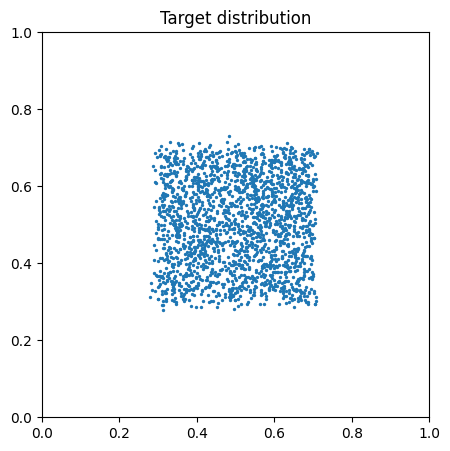

In [18]:
x = generate_points_distribution(2000, 'box')
plt.figure(figsize=(5,5))
plt.scatter(x[:,0], x[:,1], s=2.0)
plt.title('Target distribution')
plt.xlim((0, 1))
plt.ylim((0, 1))
plt.show()

In [19]:
# setting torch device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cpu


In [28]:
noise_qubits = 3
code_qubits = 2
n_qubits = noise_qubits + code_qubits
output_qubits = 2
assert(output_qubits <= noise_qubits) # 출력 큐빗은 noise qubit이하여야 한다.

n_layers = 5
BATCH_SIZE = 16
print("n_qubits = {} n_layers = {}".format(n_qubits, n_layers))

dev = qml.device("default.qubit", wires=n_qubits)
# dev = qml.device("ionq.simulator", wires=2)
# dev = qml.device("ionq.qpu", wires=2)

n_qubits = 5 n_layers = 5


In [29]:
coeff = 0.1

def generator_init(generator_input):
    for i in range(n_qubits):
        qml.RY(generator_input[i]*np.pi/2, wires=i) # TODO: *a 해서 값 범위 맞추기

def generator_layer(params):
    for i in range(n_qubits):
        qml.RX(params[i][0], wires=i)
        qml.RY(params[i][1], wires=i)
        qml.RZ(params[i][2], wires=i)
    
    for i in range(n_qubits):
        qml.CNOT(wires=[i, (i+1)%n_qubits])

@qml.qnode(dev, interface="torch")
def generator_circuit(params, generator_input):
    """
    quantum circuit nodeq1
    generator_input (np.array(큐빗)) : 생성기 입력 seed (noise + code)
    params (torch.Tensor(레이어,큐빗,3)): a parameter
    마지막 측정은 모두 Z로
    """

    generator_init(generator_input)

    for param in params:
        generator_layer(param)

    return [qml.probs(wires=i) for i in range(n_qubits)]

def generator_forward(params, generator_input):
    # 제너레이터 돌리고 결과 return하는 함수
    generator_output = [generator_circuit(params, single_in)[::2] for single_in in generator_input]
    generator_output = torch.stack(generator_output) # (BATCH_SIZE, n_qubits) 차원
    generator_output = 2 * (2 / np.pi * torch.arcsin(torch.sqrt(generator_output))) -0.5 # (BATCH_SIZE, n_qubits) 차원
    # 곱하기 2 해서 범위를 초과하게 만들음

    return generator_output[:, :output_qubits], generator_output[:, -code_qubits:] # noise, code 순서로 반환


def generator_train_step(params, generator_input, use_mine = False, _qmine = False):
    '''
    params (torch.Tensor(레이어,큐빗,3)): a parameter
    generator_input (torch.Tensor(BATCH_SIZE, n_qubits)): 생성기 입력 seed (noise + code). -1~1 사이의 값
    '''
    code_input = generator_input[:, -code_qubits:] # 입력중에서 code만 뽑는다. (BATCH_SIZE, code_qubits)

    generator_output, code_output = generator_forward(params, generator_input) # 출력을 뽑아낸다
    generator_output = generator_output.to(torch.float32) # (BATCH_SIZE, output_qubits)
    
    disc_output = discriminator(generator_output) # 밑에 코드에서 정의됨
    gan_loss = -torch.log(disc_output).mean()
    

    if use_mine:
        pred_xy = mine(code_input, generator_output)
        code_input_shuffle = code_input[torch.randperm(BATCH_SIZE)]
        pred_x_y = mine(code_input_shuffle, generator_output)
        mi = torch.mean(pred_xy) - torch.log(torch.mean(torch.exp(pred_x_y)))
        gan_loss -= coeff * mi

    elif _qmine:
        gan_loss += 0 # TODO: qmine loss 추가하기

    return generator_output, gan_loss# TODO: 이건 분석용으로 넣어놓음.지워야 함.


def prediction(params, image, debug=False):
    prob_0 = 0
    prob_1 = 0
    for i in range(n_layers):
        prob_0 += circuit(params[:i+1], (image, 0))
        prob_1 += circuit(params[:i+1], (image, 1))

    if (debug):
        return (int(prob_0 <= prob_1), prob_0, prob_1)
    return int(prob_0 <= prob_1)

In [30]:
import torch.nn as nn
from torch.nn import functional as F

class LinearDiscriminator(nn.Module):
    def __init__(self, input_dim=output_qubits):
        super().__init__()
        self.hidden_size = 50
        self.layers = nn.Sequential(
            nn.Linear(input_dim, self.hidden_size),
            nn.LeakyReLU(),
            nn.Linear(self.hidden_size, self.hidden_size),
            nn.LeakyReLU(),
            nn.Linear(self.hidden_size, self.hidden_size),
            nn.LeakyReLU(),
            nn.Linear(self.hidden_size, 1),
            nn.Sigmoid())

        self.input_dim = input_dim

    def forward(self, x):
        if(len(x.shape) != 2):
            x = x.view(x.shape[0], -1)

        return self.layers(x)


class LinearMine(nn.Module):
    def __init__(self):
        super(LinearMine, self).__init__()
        H = 50
        self.fc1 = nn.Linear(code_qubits, H)
        self.fc2 = nn.Linear(output_qubits, H)
        self.fc3 = nn.Linear(H, 1)

    def forward(self, x, y):
        h1 = F.relu(self.fc1(x)+self.fc2(y))
        h2 = self.fc3(h1)
        return h2

disc_loss_fn = nn.BCELoss()
def disc_cost_fn(real_input, fake_input, smoothing=False):
    batch_num = real_input.shape[0]

    disc_real = discriminator(real_input)
    disc_fake = discriminator(fake_input)

    real_label = torch.ones((batch_num, 1)).to(device)
    fake_label = torch.zeros((batch_num, 1)).to(device)
    
    if smoothing:
        real_label = real_label - 0.2*torch.rand(real_label.shape).to(device)
    
    loss = 0.5 * (disc_loss_fn(disc_real, real_label) + disc_loss_fn(disc_fake, fake_label))
    
    return loss


In [31]:
generator_params = Variable(torch.tensor(np.random.normal(-np.pi, np.pi, (n_layers, n_qubits, 3))), requires_grad=True)
print("parameter shape: ", generator_params.shape)

discriminator = LinearDiscriminator()
mine = LinearMine()

parameter shape:  torch.Size([5, 5, 3])


In [32]:
G_lr = 1e-3
D_lr = 1e-4
M_lr = 3e-3

use_mine = True # True -> False
use_qmine = False
G_opt = torch.optim.Adam([generator_params], lr=G_lr)
D_opt = torch.optim.Adam(discriminator.parameters(), lr=D_lr)
M_opt = torch.optim.Adam(mine.parameters(), lr=M_lr)

G_scheduler = torch.optim.lr_scheduler.StepLR(G_opt, step_size=30, gamma=0.7)
D_scheduler = torch.optim.lr_scheduler.StepLR(D_opt, step_size=30, gamma=0.85)
M_scheduler = torch.optim.lr_scheduler.StepLR(M_opt, step_size=30, gamma=0.7)

### 하이퍼파라미터 미리 저장

In [33]:
import os
title = f'square4_{use_mine}'
if not os.path.exists(f'result/{title}'):
    os.makedirs(f'result/{title}')
    
with open(f'result/{title}/param.txt', 'w') as f:
    f.write('G_lr = {}\n'.format(G_lr))
    f.write('D_lr = {}\n'.format(D_lr))
    f.write('M_lr = {}\n'.format(M_lr))
    f.write('G_scheduler: step={}, gamma={}\n'.format(G_scheduler.step_size, G_scheduler.gamma))
    f.write('D_scheduler: step={}, gamma={}\n'.format(D_scheduler.step_size, D_scheduler.gamma))
    f.write('M_scheduler: step={}, gamma={}\n'.format(M_scheduler.step_size, M_scheduler.gamma))
    f.write('coeff = {}\n'.format(coeff))
    f.write('use_mine = {}\n'.format(use_mine))
    f.write('use_qmine = {}\n'.format(use_qmine))
    f.write('n_qubits = {}\n'.format(n_qubits))
    f.write('output_qubits = {}\n'.format(output_qubits))
    f.write('code_qubits = {}\n'.format(code_qubits))
    f.write('n_layers = {}\n'.format(n_layers))
    f.write('param shape = {}\n'.format(generator_params.shape))

In [34]:
import warnings

def visualize_output(log_gen_outputs, log_gen_codes, title, rep, recorder):
    warnings.simplefilter("ignore")
    plt.figure(figsize=(10 + 4 * code_qubits, 4))  # 전체 그림의 크기 지정
    plt.subplot(1, 1 + code_qubits, 1)
    plt.title('Epoch {0}'.format(rep))
    plt.scatter(log_gen_outputs[:,0], log_gen_outputs[:,1], s=10,  alpha=0.2)
    plt.xlim((0, 1))
    plt.ylim((0, 1))
    plt.grid()

    for i in range(code_qubits):
        plt.subplot(1, 1 + code_qubits, 2 + i)
        plt.title('Epoch {0} code {1}'.format(rep, i))
        plt.scatter(log_gen_outputs[:,0], log_gen_outputs[:,1], s=10, c=log_gen_codes[:, i], cmap='RdYlBu', alpha=0.2)
        plt.xlim((0, 1))
        plt.ylim((0, 1))
        plt.colorbar()  # 색상 막대 추가
        plt.grid()

    plt.savefig(f'result/{title}/{rep}.png', dpi=100)
    if rep % 5 == 0:
        plt.show()
    plt.clf()
    plt.close()
    
    plt.figure(figsize=(10, 4))
    plt.title('Epoch {0} code-axis corr'.format(rep))
    plt.plot(recorder['d_loss'], label='d_loss', marker='o')
    plt.plot(recorder['g_loss'], label='g_loss', marker='o')
    plt.plot(recorder['mi'], label='mi', marker='o')
    for i in range(code_qubits):
        plt.plot(recorder[f'code{i}-x'], label=f'code{i}-x', marker='o')
        plt.plot(recorder[f'code{i}-y'], label=f'code{i}-y', marker='o')

    plt.xlabel('epoch')
    plt.ylabel('correlation')
    plt.ylim(-1, 1)
    plt.title(f'code - axis corr graph (rep={rep})')
    plt.legend()
    plt.savefig(f'result/{title}/corr_{rep}.png', dpi=100)
    if rep % 5 == 0:
        plt.show()
    plt.clf()
    plt.close()

    plt.figure(figsize=(10, 4))
    plt.title('Epoch {0} KS stastics'.format(rep))
    plt.subplot(1, 2, 1)
    plt.plot(recorder['D_ks'], label='D_ks', marker='o')
    plt.legend()
    plt.subplot(1, 2, 2)
    plt.plot(recorder['p-value'], label='p-value', marker='o')
    plt.yscale("log", base=10)  # 로그 스케일로 설정
    plt.legend()
    plt.savefig(f'result/{title}/ks_{rep}.png', dpi=100)
    if rep % 5 == 0:
        plt.show()
    plt.clf()
    plt.close()
    

  0%|          | 0/31 [00:00<?, ?it/s]

100%|██████████| 31/31 [00:10<00:00,  3.04it/s, G_loss=0.716, D_loss=0.693, MI=-.0015] 


epoch: 1, D_loss: 0.6933057000560146, G_loss: 0.7163240948031026, MI = -0.0014991370900984734
좌표값 평균 =  0.44576743 0.41609752
D_ks = 0.4135241935483871, p-value = 1.0920961743839046e-40


100%|██████████| 31/31 [00:10<00:00,  2.96it/s, G_loss=0.699, D_loss=0.693, MI=0.0018]  


epoch: 2, D_loss: 0.6925938148652354, G_loss: 0.6986417770385742, MI = 0.0018043277725096672
좌표값 평균 =  0.44799954 0.43998185
D_ks = 0.3763870967741936, p-value = 1.005974892593e-33


100%|██████████| 31/31 [00:10<00:00,  3.02it/s, G_loss=0.69, D_loss=0.692, MI=0.00733] 


epoch: 3, D_loss: 0.6921211327275922, G_loss: 0.6902557207692054, MI = 0.00733391075365005
좌표값 평균 =  0.45823732 0.45254812
D_ks = 0.3636935483870968, p-value = 1.6107899631409653e-31


100%|██████████| 31/31 [00:10<00:00,  2.97it/s, G_loss=0.687, D_loss=0.692, MI=0.0227]


epoch: 4, D_loss: 0.6922851589418226, G_loss: 0.6873429552201302, MI = 0.022682251468781504
좌표값 평균 =  0.4802526 0.47644222
D_ks = 0.27819354838709676, p-value = 1.3079850332496418e-18


100%|██████████| 31/31 [00:10<00:00,  3.04it/s, G_loss=0.685, D_loss=0.693, MI=0.0503]


epoch: 5, D_loss: 0.6929333363809893, G_loss: 0.6854883047842211, MI = 0.05034359184003646
좌표값 평균 =  0.50592065 0.49583972
D_ks = 0.1534354838709677, p-value = 5.674205880703075e-06


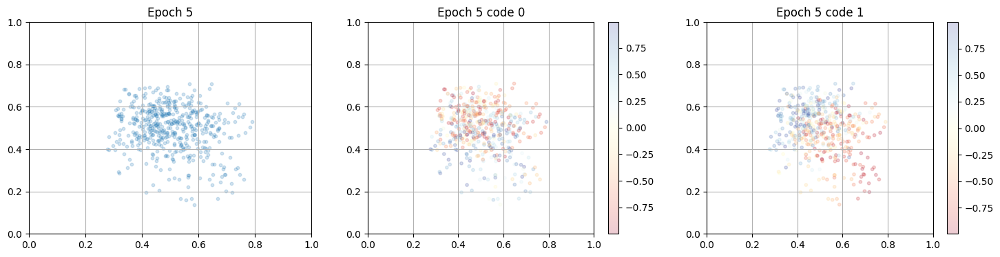

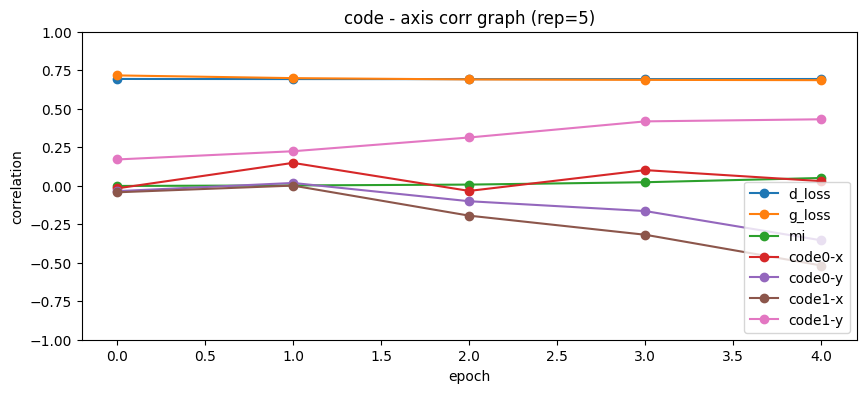

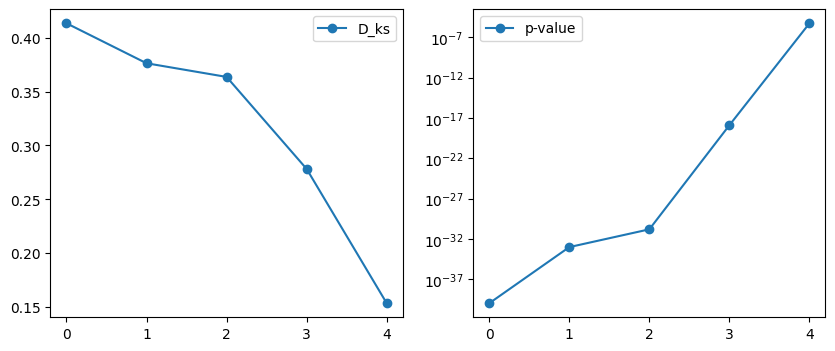

100%|██████████| 31/31 [00:10<00:00,  3.05it/s, G_loss=0.68, D_loss=0.693, MI=0.123]  


epoch: 6, D_loss: 0.6933996908126339, G_loss: 0.6800304420532719, MI = 0.12264381709598726
좌표값 평균 =  0.5122945 0.51658666
D_ks = 0.1454435483870967, p-value = 1.947056835944275e-05


100%|██████████| 31/31 [00:10<00:00,  3.04it/s, G_loss=0.672, D_loss=0.694, MI=0.25] 


epoch: 7, D_loss: 0.6937646289025584, G_loss: 0.6715469821806876, MI = 0.25006448165062933
좌표값 평균 =  0.53067017 0.5244388
D_ks = 0.20691935483870968, p-value = 1.0349613114499316e-10


100%|██████████| 31/31 [00:10<00:00,  3.08it/s, G_loss=0.656, D_loss=0.694, MI=0.397]


epoch: 8, D_loss: 0.6937936967419039, G_loss: 0.6563841296780494, MI = 0.3965228195151975
좌표값 평균 =  0.5426536 0.5318527
D_ks = 0.308241935483871, p-value = 1.6788902072010106e-23


100%|██████████| 31/31 [00:10<00:00,  3.04it/s, G_loss=0.653, D_loss=0.693, MI=0.469]


epoch: 9, D_loss: 0.6932506580506602, G_loss: 0.653434407326483, MI = 0.46876556642593875
좌표값 평균 =  0.53599745 0.52863526
D_ks = 0.29401612903225804, p-value = 1.5902189046609818e-21


100%|██████████| 31/31 [00:10<00:00,  3.03it/s, G_loss=0.637, D_loss=0.693, MI=0.615]


epoch: 10, D_loss: 0.6929810720105325, G_loss: 0.6366858809225021, MI = 0.6146548428843098
좌표값 평균 =  0.51624256 0.5404781
D_ks = 0.29258064516129034, p-value = 1.977453757626725e-21


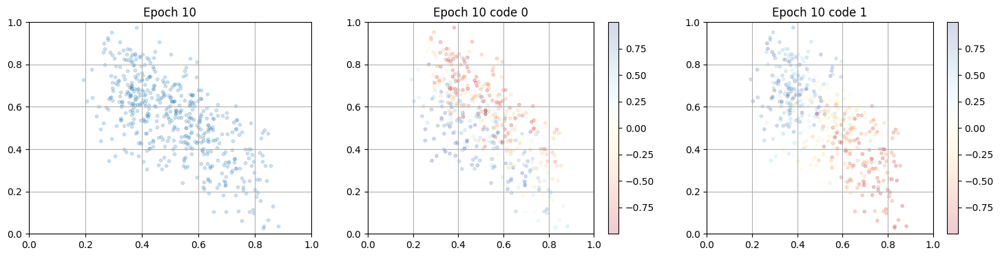

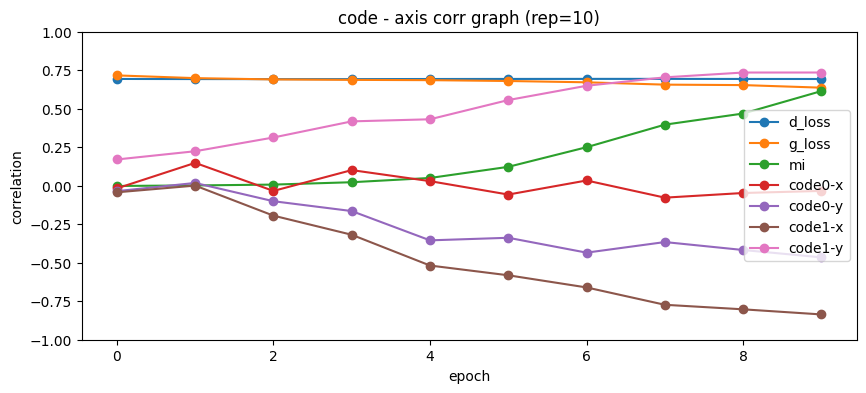

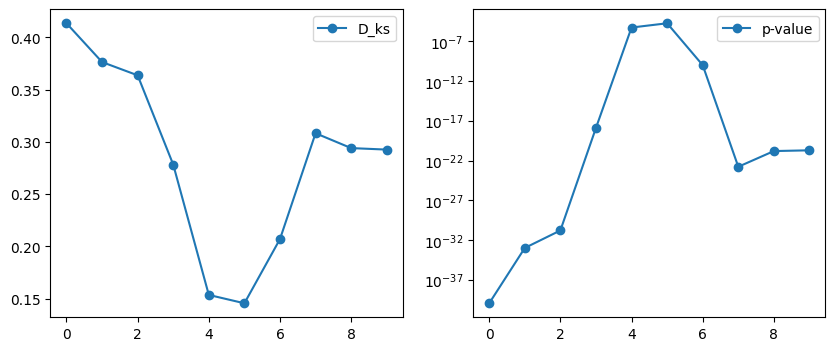

100%|██████████| 31/31 [00:10<00:00,  3.09it/s, G_loss=0.628, D_loss=0.693, MI=0.639]


epoch: 11, D_loss: 0.6926397835054705, G_loss: 0.6283886624920753, MI = 0.6392250868581957
좌표값 평균 =  0.5342499 0.5230477
D_ks = 0.30338709677419357, p-value = 5.015065507825468e-23


100%|██████████| 31/31 [00:10<00:00,  3.04it/s, G_loss=0.627, D_loss=0.692, MI=0.747]


epoch: 12, D_loss: 0.6922027430226726, G_loss: 0.6268381014946969, MI = 0.7469983081663808
좌표값 평균 =  0.5212935 0.5344691
D_ks = 0.337491935483871, p-value = 1.5328185845960479e-28


100%|██████████| 31/31 [00:10<00:00,  3.04it/s, G_loss=0.622, D_loss=0.692, MI=0.799]


epoch: 13, D_loss: 0.69167786259805, G_loss: 0.6219320835605744, MI = 0.7992354160354983
좌표값 평균 =  0.5131474 0.55039227
D_ks = 0.3433306451612903, p-value = 1.7013593692408374e-29


100%|██████████| 31/31 [00:10<00:00,  3.03it/s, G_loss=0.619, D_loss=0.691, MI=0.714]


epoch: 14, D_loss: 0.6910091830838111, G_loss: 0.6187676422057613, MI = 0.7141231308060307
좌표값 평균 =  0.52160245 0.5102361
D_ks = 0.31316935483870967, p-value = 1.2586386713108405e-24


100%|██████████| 31/31 [00:10<00:00,  3.05it/s, G_loss=0.621, D_loss=0.69, MI=0.77]  


epoch: 15, D_loss: 0.6902473722734759, G_loss: 0.6214564308043449, MI = 0.7700468022977153
좌표값 평균 =  0.5197901 0.52035904
D_ks = 0.2854032258064516, p-value = 1.6779913433708612e-20


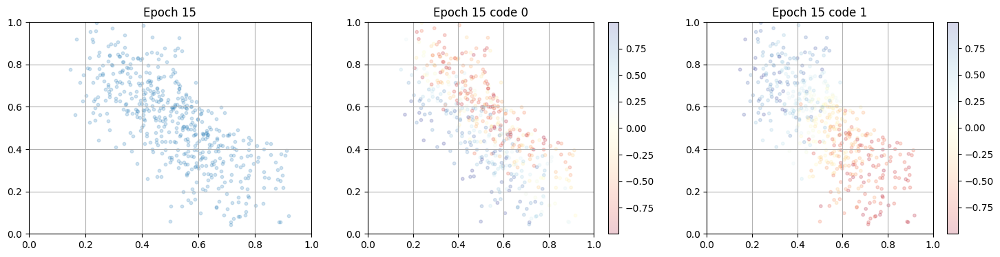

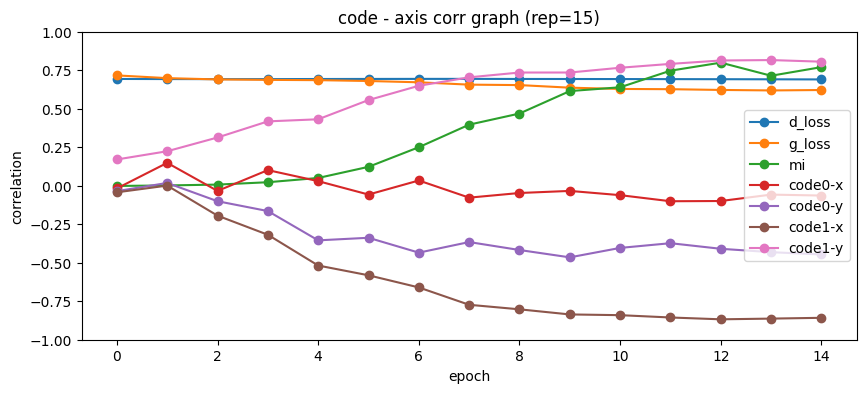

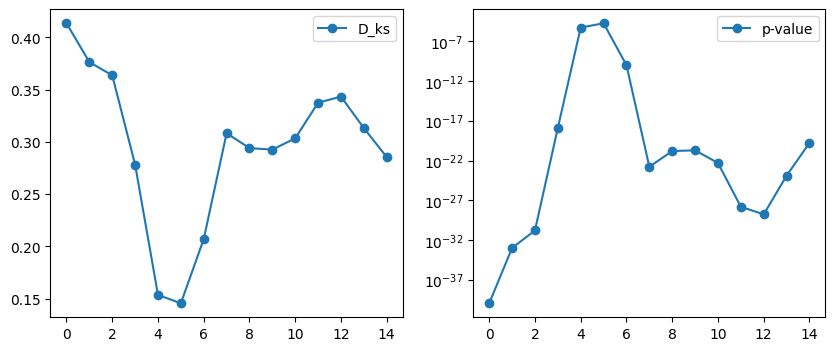

100%|██████████| 31/31 [00:10<00:00,  3.04it/s, G_loss=0.608, D_loss=0.689, MI=0.791]


epoch: 16, D_loss: 0.6893702572391879, G_loss: 0.6082112289244129, MI = 0.7913398319675077
좌표값 평균 =  0.5244214 0.5163242
D_ks = 0.3075322580645161, p-value = 1.3516595560032215e-23


100%|██████████| 31/31 [00:10<00:00,  3.04it/s, G_loss=0.611, D_loss=0.688, MI=0.884]


epoch: 17, D_loss: 0.688072012316796, G_loss: 0.6111570404421899, MI = 0.883987364269072
좌표값 평균 =  0.5116131 0.5252716
D_ks = 0.28944354838709685, p-value = 6.663511048325992e-21


100%|██████████| 31/31 [00:10<00:00,  3.03it/s, G_loss=0.615, D_loss=0.686, MI=1.04]


epoch: 18, D_loss: 0.6861781497155467, G_loss: 0.6146860728340764, MI = 1.0433648055599583
좌표값 평균 =  0.53094316 0.5003184
D_ks = 0.2605725806451613, p-value = 5.045726722739911e-17


100%|██████████| 31/31 [00:10<00:00,  3.03it/s, G_loss=0.597, D_loss=0.685, MI=0.91] 


epoch: 19, D_loss: 0.6850525698354167, G_loss: 0.5972674046793292, MI = 0.9096617621760215
좌표값 평균 =  0.5130455 0.5215506
D_ks = 0.2744274193548387, p-value = 1.039142947986744e-18


100%|██████████| 31/31 [00:10<00:00,  3.02it/s, G_loss=0.62, D_loss=0.681, MI=1.03] 


epoch: 20, D_loss: 0.6811403055344859, G_loss: 0.6202061137845439, MI = 1.0326745365896532
좌표값 평균 =  0.520814 0.50447965
D_ks = 0.2989677419354838, p-value = 4.796598446516749e-22


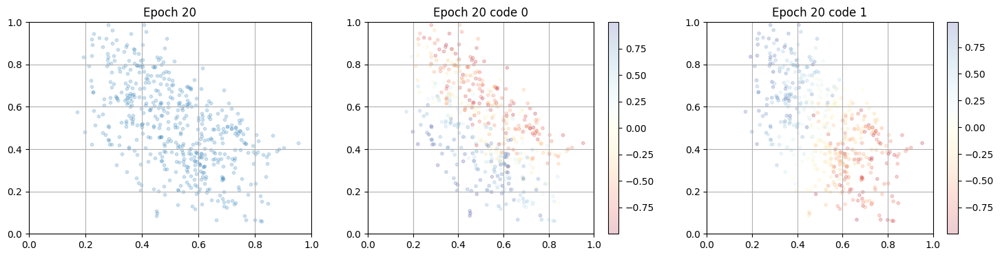

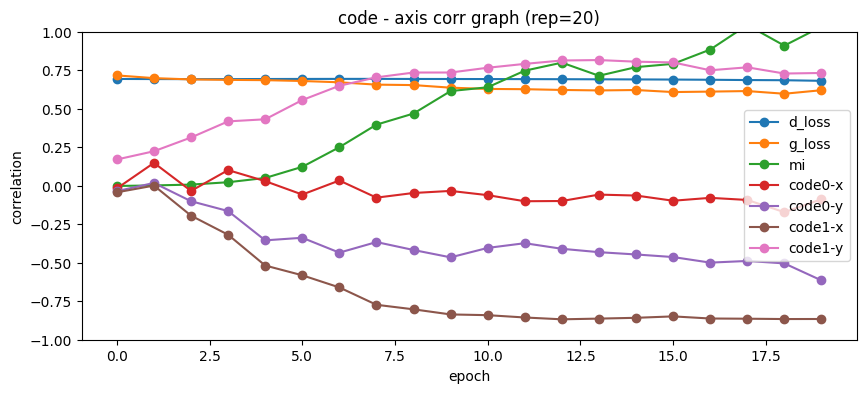

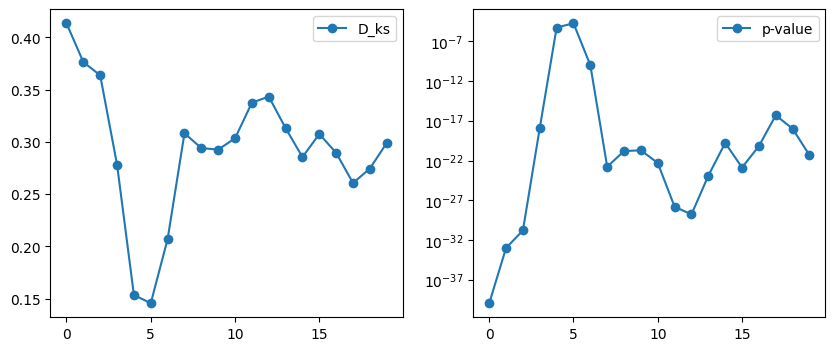

100%|██████████| 31/31 [00:10<00:00,  3.07it/s, G_loss=0.613, D_loss=0.681, MI=0.926]


epoch: 21, D_loss: 0.6807000829327491, G_loss: 0.6130662579690257, MI = 0.9260548257058666
좌표값 평균 =  0.5171384 0.49661142
D_ks = 0.23961290322580642, p-value = 3.144584472431924e-14


100%|██████████| 31/31 [00:10<00:00,  3.08it/s, G_loss=0.603, D_loss=0.676, MI=0.941]


epoch: 22, D_loss: 0.6756223017169584, G_loss: 0.60338324789078, MI = 0.9414757028702767
좌표값 평균 =  0.53431517 0.47737062
D_ks = 0.2776451612903226, p-value = 5.983488466107327e-19


100%|██████████| 31/31 [00:10<00:00,  2.97it/s, G_loss=0.602, D_loss=0.675, MI=0.866]


epoch: 23, D_loss: 0.6753448805501384, G_loss: 0.6023084752021297, MI = 0.8660762838778957
좌표값 평균 =  0.5246757 0.4782465
D_ks = 0.25078225806451615, p-value = 1.8458460486920774e-15


100%|██████████| 31/31 [00:10<00:00,  2.97it/s, G_loss=0.619, D_loss=0.672, MI=1.22] 


epoch: 24, D_loss: 0.6719411861511969, G_loss: 0.6192651525620492, MI = 1.2207819242631235
좌표값 평균 =  0.513136 0.4872784
D_ks = 0.26192741935483876, p-value = 7.364663751028624e-17


100%|██████████| 31/31 [00:10<00:00,  3.03it/s, G_loss=0.605, D_loss=0.671, MI=1.04] 


epoch: 25, D_loss: 0.6712903803394686, G_loss: 0.6050931638286959, MI = 1.040048909764136
좌표값 평균 =  0.5031405 0.4781085
D_ks = 0.25075806451612914, p-value = 2.1851262821255076e-15


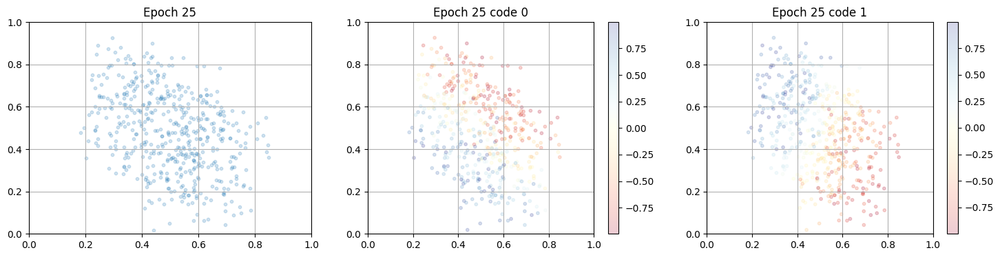

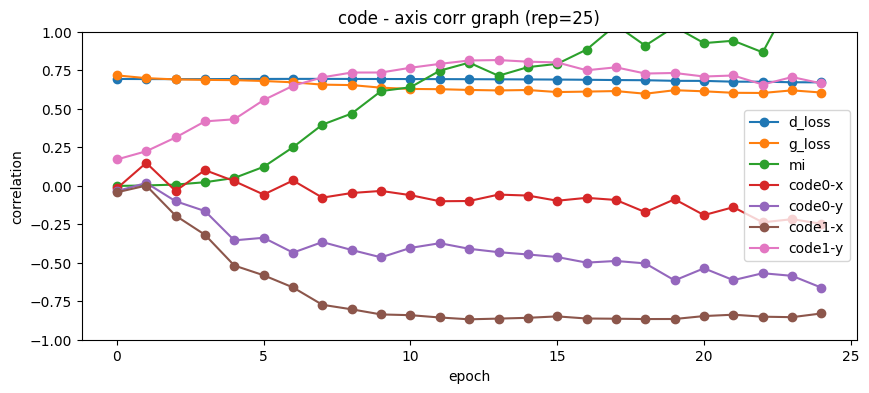

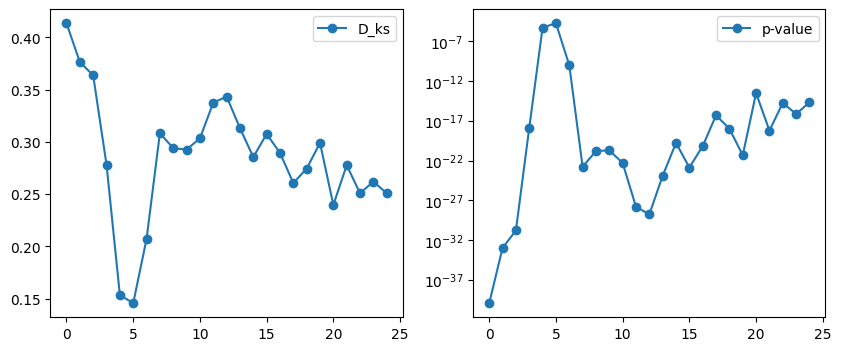

100%|██████████| 31/31 [00:10<00:00,  3.07it/s, G_loss=0.611, D_loss=0.67, MI=1.04]  


epoch: 26, D_loss: 0.6703998638737586, G_loss: 0.6111523758980536, MI = 1.0429979274349828
좌표값 평균 =  0.49525678 0.48097122
D_ks = 0.26791935483870977, p-value = 1.9993628494169554e-17


100%|██████████| 31/31 [00:10<00:00,  3.05it/s, G_loss=0.615, D_loss=0.67, MI=1.01]  


epoch: 27, D_loss: 0.6703237448969195, G_loss: 0.6145927386899148, MI = 1.0113451384728955
좌표값 평균 =  0.4880324 0.48123696
D_ks = 0.2594112903225808, p-value = 2.462729715926455e-16


100%|██████████| 31/31 [00:10<00:00,  3.05it/s, G_loss=0.61, D_loss=0.677, MI=1.02]  


epoch: 28, D_loss: 0.6768364252582673, G_loss: 0.6096951480834715, MI = 1.0195442784217097
좌표값 평균 =  0.5072598 0.46817577
D_ks = 0.20464516129032254, p-value = 2.790405084753787e-10


100%|██████████| 31/31 [00:10<00:00,  2.99it/s, G_loss=0.599, D_loss=0.676, MI=0.972]


epoch: 29, D_loss: 0.6756800913041637, G_loss: 0.5994668872125687, MI = 0.9716310356893847
좌표값 평균 =  0.49770024 0.4848578
D_ks = 0.19388709677419355, p-value = 2.8784200070252293e-09


100%|██████████| 31/31 [00:10<00:00,  3.05it/s, G_loss=0.598, D_loss=0.681, MI=1.09]


epoch: 30, D_loss: 0.6805032587820484, G_loss: 0.5978031081538047, MI = 1.0900744680435426
좌표값 평균 =  0.4949815 0.48117194
D_ks = 0.17686290322580647, p-value = 8.879345977860979e-08


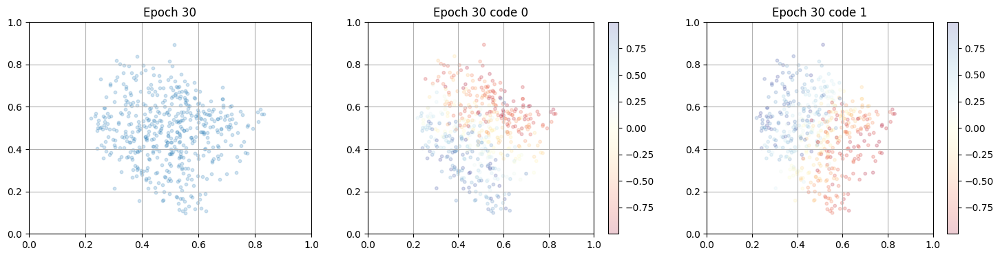

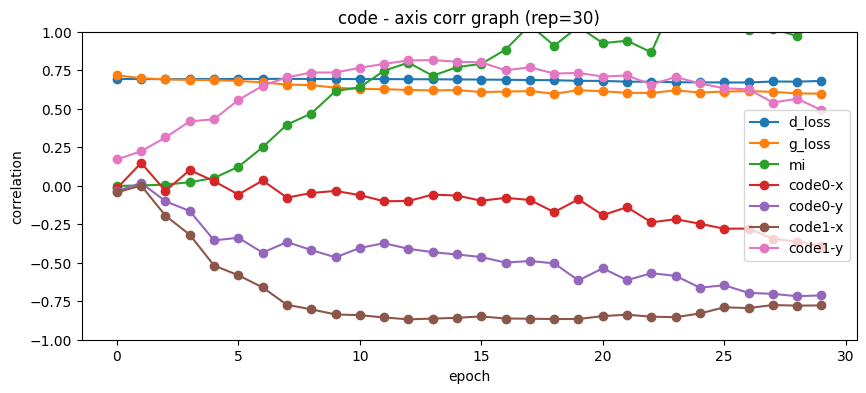

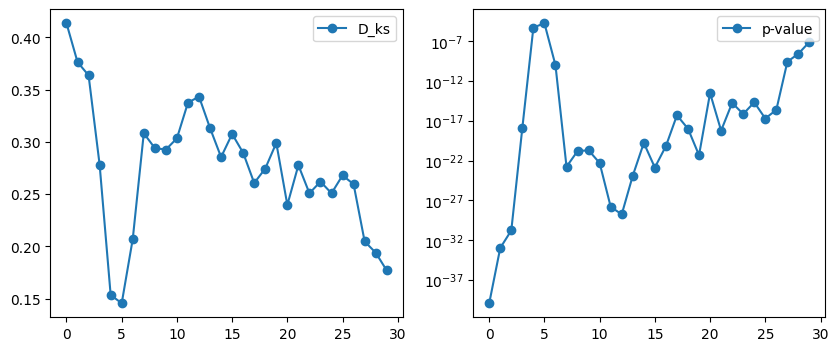

100%|██████████| 31/31 [00:10<00:00,  3.07it/s, G_loss=0.606, D_loss=0.684, MI=1.03]


epoch: 31, D_loss: 0.6837517215359595, G_loss: 0.6056410593371238, MI = 1.0311417570037227
좌표값 평균 =  0.4753851 0.47479522
D_ks = 0.1765887096774194, p-value = 9.457603308918174e-08


100%|██████████| 31/31 [00:10<00:00,  3.07it/s, G_loss=0.594, D_loss=0.686, MI=0.994]


epoch: 32, D_loss: 0.6860900617414906, G_loss: 0.5941620353729494, MI = 0.993913947574554
좌표값 평균 =  0.48769593 0.490306
D_ks = 0.1430564516129033, p-value = 3.1224796179420886e-05


100%|██████████| 31/31 [00:10<00:00,  3.07it/s, G_loss=0.599, D_loss=0.686, MI=1.04] 


epoch: 33, D_loss: 0.686002089131263, G_loss: 0.5989783213984582, MI = 1.0428239611848709
좌표값 평균 =  0.503142 0.49584314
D_ks = 0.14181451612903231, p-value = 3.777234841229642e-05


100%|██████████| 31/31 [00:10<00:00,  3.05it/s, G_loss=0.594, D_loss=0.691, MI=1.03] 


epoch: 34, D_loss: 0.6908392617779393, G_loss: 0.5935981235196514, MI = 1.0252141894832734
좌표값 평균 =  0.49752 0.4969685
D_ks = 0.1106209677419355, p-value = 0.002652647859284397


100%|██████████| 31/31 [00:10<00:00,  3.03it/s, G_loss=0.61, D_loss=0.695, MI=0.892] 


epoch: 35, D_loss: 0.6945609757977147, G_loss: 0.6097638626252452, MI = 0.8923046319715439
좌표값 평균 =  0.5107405 0.49789795
D_ks = 0.11500000000000002, p-value = 0.0015272787504289407


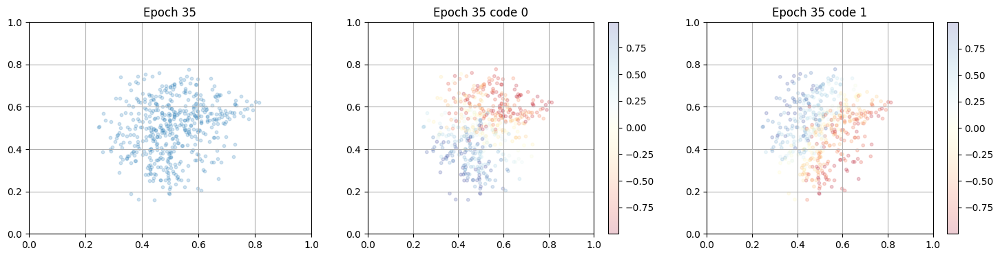

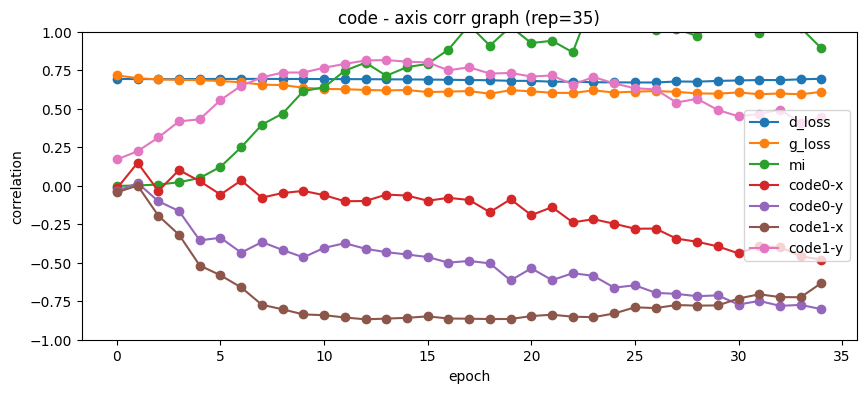

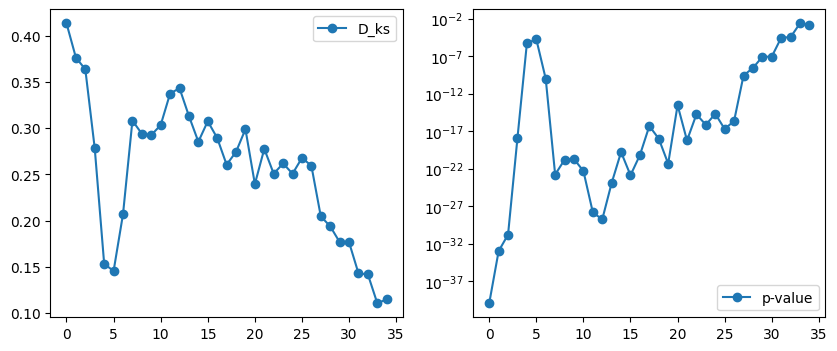

100%|██████████| 31/31 [00:10<00:00,  3.07it/s, G_loss=0.61, D_loss=0.699, MI=0.851] 


epoch: 36, D_loss: 0.6994395275269786, G_loss: 0.6097589577397993, MI = 0.851125120155273
좌표값 평균 =  0.49512413 0.49913
D_ks = 0.14288709677419356, p-value = 3.060408685135523e-05


100%|██████████| 31/31 [00:10<00:00,  3.08it/s, G_loss=0.596, D_loss=0.702, MI=0.922]


epoch: 37, D_loss: 0.7015370707358083, G_loss: 0.5962986580787166, MI = 0.9223556585850254
좌표값 평균 =  0.5080615 0.49699718
D_ks = 0.13340322580645161, p-value = 0.00012909364440005073


100%|██████████| 31/31 [00:10<00:00,  3.06it/s, G_loss=0.588, D_loss=0.7, MI=1]      


epoch: 38, D_loss: 0.6998398054030633, G_loss: 0.5879650039057578, MI = 1.0037404491055397
좌표값 평균 =  0.5059649 0.50289977
D_ks = 0.13288709677419355, p-value = 0.00013652430261846315


100%|██████████| 31/31 [00:10<00:00,  3.05it/s, G_loss=0.597, D_loss=0.701, MI=0.923]


epoch: 39, D_loss: 0.7009416972437212, G_loss: 0.5973118601306793, MI = 0.9232085174129855
좌표값 평균 =  0.49716285 0.50335395
D_ks = 0.14433870967741938, p-value = 2.4492691682516556e-05


100%|██████████| 31/31 [00:10<00:00,  3.00it/s, G_loss=0.6, D_loss=0.695, MI=0.968]  


epoch: 40, D_loss: 0.6948693952252788, G_loss: 0.6001891301524255, MI = 0.968129962682724
좌표값 평균 =  0.5112451 0.512013
D_ks = 0.12754838709677424, p-value = 0.0002988509938336744


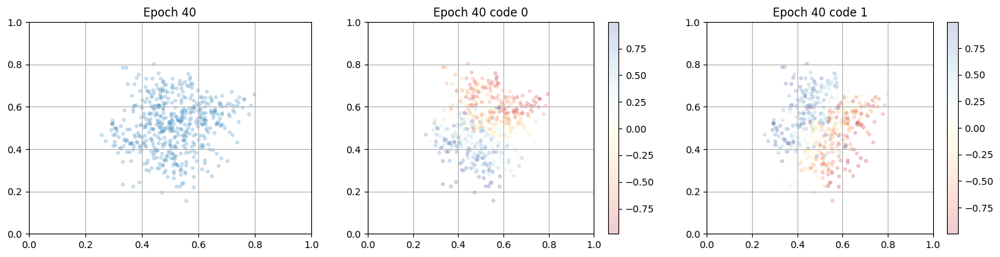

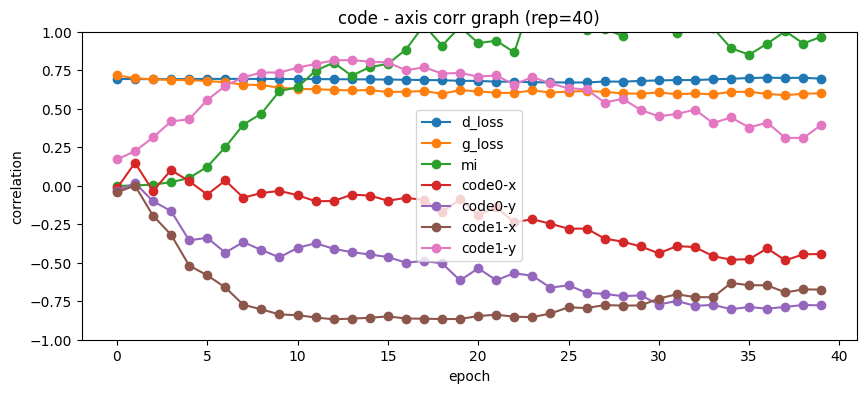

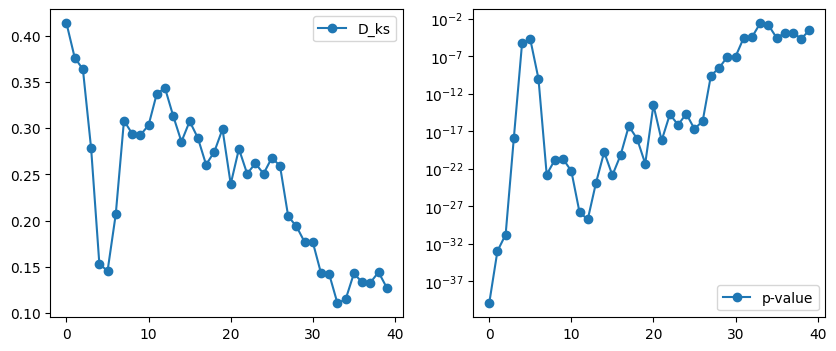

100%|██████████| 31/31 [00:10<00:00,  3.07it/s, G_loss=0.59, D_loss=0.696, MI=0.913] 


epoch: 41, D_loss: 0.6963041386296672, G_loss: 0.590026367095209, MI = 0.9131905869130166
좌표값 평균 =  0.5085311 0.50316346
D_ks = 0.1026774193548387, p-value = 0.006616328507897869


100%|██████████| 31/31 [00:10<00:00,  3.09it/s, G_loss=0.589, D_loss=0.696, MI=0.96] 


epoch: 42, D_loss: 0.6958307335453648, G_loss: 0.5890356071533696, MI = 0.9595808079165797
좌표값 평균 =  0.5143747 0.5102087
D_ks = 0.10598387096774195, p-value = 0.004513262961154341


100%|██████████| 31/31 [00:10<00:00,  3.05it/s, G_loss=0.581, D_loss=0.696, MI=0.864]


epoch: 43, D_loss: 0.6960194283916105, G_loss: 0.5810764095475597, MI = 0.8644982845552506
좌표값 평균 =  0.51239234 0.51286036
D_ks = 0.12496774193548399, p-value = 0.0004164815306380269


100%|██████████| 31/31 [00:10<00:00,  3.07it/s, G_loss=0.595, D_loss=0.696, MI=1.1]  


epoch: 44, D_loss: 0.6963058979280533, G_loss: 0.5948725919569692, MI = 1.1010672435645135
좌표값 평균 =  0.5070208 0.5184394
D_ks = 0.11776612903225797, p-value = 0.001078733730451384


100%|██████████| 31/31 [00:10<00:00,  3.04it/s, G_loss=0.6, D_loss=0.696, MI=1.14]  


epoch: 45, D_loss: 0.6955128869702739, G_loss: 0.6002773113789097, MI = 1.1446268635411416
좌표값 평균 =  0.5142096 0.51585245
D_ks = 0.13938709677419356, p-value = 5.3648154232085984e-05


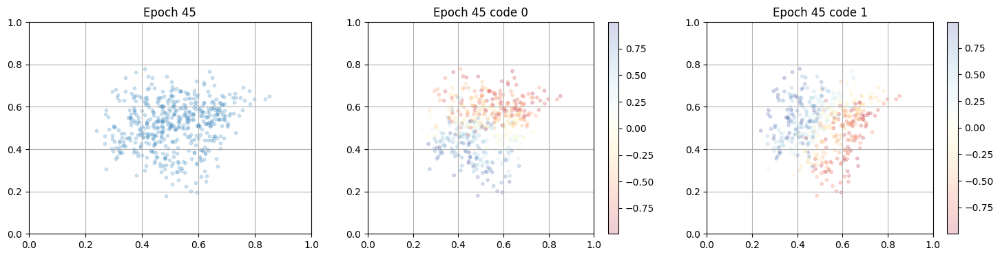

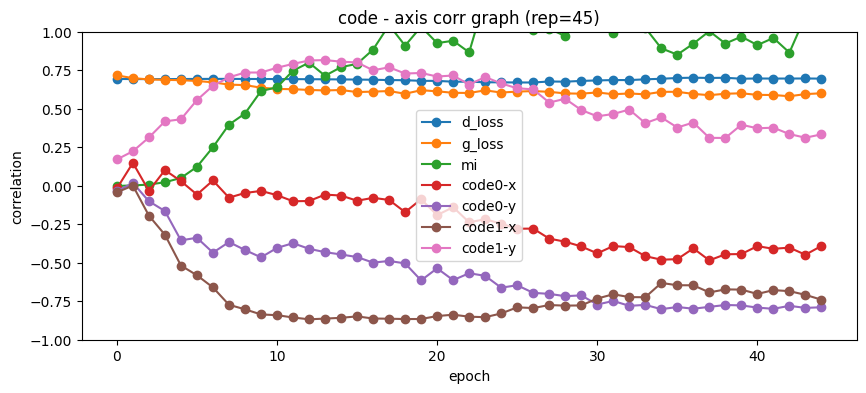

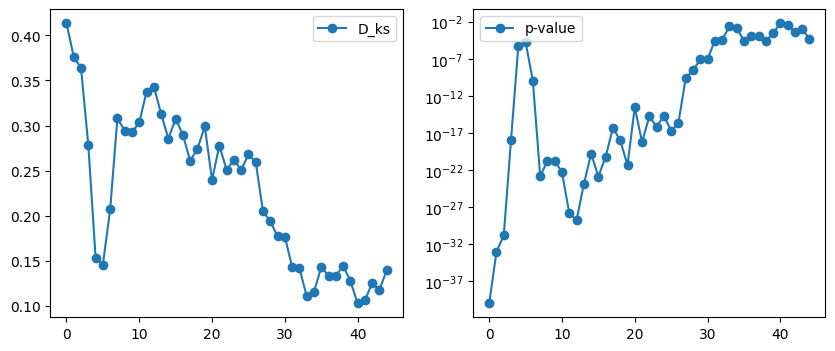

100%|██████████| 31/31 [00:10<00:00,  3.03it/s, G_loss=0.584, D_loss=0.694, MI=1.09] 


epoch: 46, D_loss: 0.6942957582012299, G_loss: 0.5838753350319401, MI = 1.0925041629422096
좌표값 평균 =  0.5126215 0.50776255
D_ks = 0.08200000000000016, p-value = 0.052554499401942595


100%|██████████| 31/31 [00:10<00:00,  3.04it/s, G_loss=0.572, D_loss=0.693, MI=1.1] 


epoch: 47, D_loss: 0.6926549326988959, G_loss: 0.5716352289722811, MI = 1.1006232187632592
좌표값 평균 =  0.518447 0.50718135
D_ks = 0.1152338709677419, p-value = 0.0014959352490037142


100%|██████████| 31/31 [00:10<00:00,  3.06it/s, G_loss=0.597, D_loss=0.692, MI=1.07]


epoch: 48, D_loss: 0.6924938424941032, G_loss: 0.5971328423869225, MI = 1.0696415800240733
좌표값 평균 =  0.51010734 0.5083339
D_ks = 0.10272580645161292, p-value = 0.006597067128729855


100%|██████████| 31/31 [00:10<00:00,  3.03it/s, G_loss=0.579, D_loss=0.693, MI=1.05] 


epoch: 49, D_loss: 0.6930795331155101, G_loss: 0.5788572555588137, MI = 1.0544944915079302
좌표값 평균 =  0.5173987 0.5065981
D_ks = 0.11699999999999999, p-value = 0.0012058768444311201


100%|██████████| 31/31 [00:10<00:00,  3.05it/s, G_loss=0.583, D_loss=0.691, MI=1.07]


epoch: 50, D_loss: 0.6905395292466686, G_loss: 0.5832114738802756, MI = 1.0739883722797516
좌표값 평균 =  0.5189431 0.50506395
D_ks = 0.11930645161290324, p-value = 0.000897022501403594


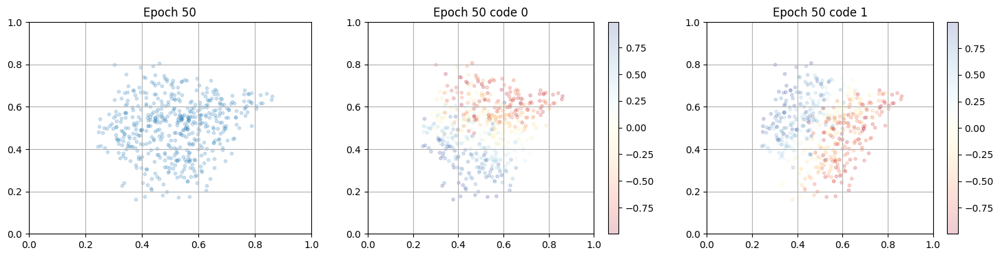

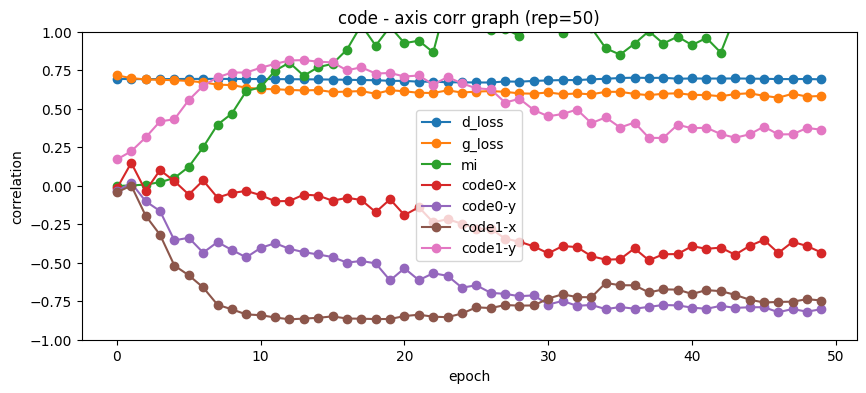

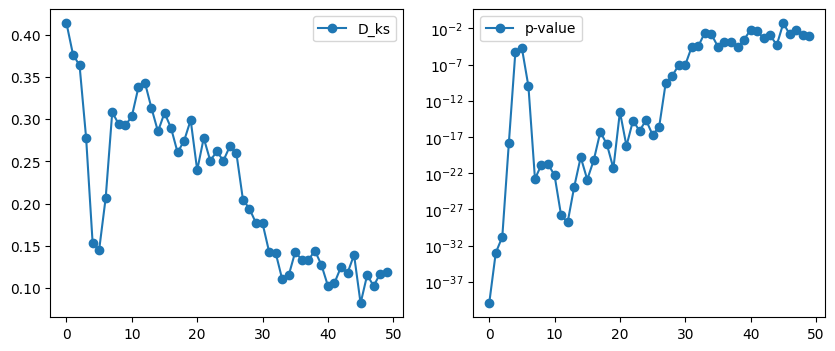

100%|██████████| 31/31 [00:10<00:00,  3.03it/s, G_loss=0.587, D_loss=0.693, MI=1.09]


epoch: 51, D_loss: 0.6926397662008962, G_loss: 0.5870232418660195, MI = 1.088577544977588
좌표값 평균 =  0.5200713 0.5109881
D_ks = 0.1158306451612903, p-value = 0.0014068146598930976


100%|██████████| 31/31 [00:10<00:00,  3.05it/s, G_loss=0.594, D_loss=0.692, MI=1.21]


epoch: 52, D_loss: 0.6917023947162013, G_loss: 0.5938809744773372, MI = 1.209394891415873
좌표값 평균 =  0.51191735 0.50464904
D_ks = 0.10270161290322583, p-value = 0.006624016269554309


100%|██████████| 31/31 [00:10<00:00,  3.06it/s, G_loss=0.566, D_loss=0.69, MI=1.33] 


epoch: 53, D_loss: 0.6902506716789738, G_loss: 0.5660122498389213, MI = 1.332866793678653
좌표값 평균 =  0.51326436 0.5103201
D_ks = 0.11659677419354839, p-value = 0.0012758258443925504


100%|██████████| 31/31 [00:10<00:00,  3.08it/s, G_loss=0.592, D_loss=0.691, MI=1.09] 


epoch: 54, D_loss: 0.6914082957852271, G_loss: 0.5918778411803707, MI = 1.0937524202369875
좌표값 평균 =  0.5056847 0.5077585
D_ks = 0.10211290322580646, p-value = 0.007055475687911025


100%|██████████| 31/31 [00:10<00:00,  3.04it/s, G_loss=0.577, D_loss=0.691, MI=1.13]


epoch: 55, D_loss: 0.6908474256915431, G_loss: 0.5774077926912615, MI = 1.131803318377464
좌표값 평균 =  0.50133324 0.5083196
D_ks = 0.10554032258064519, p-value = 0.004796260942390675


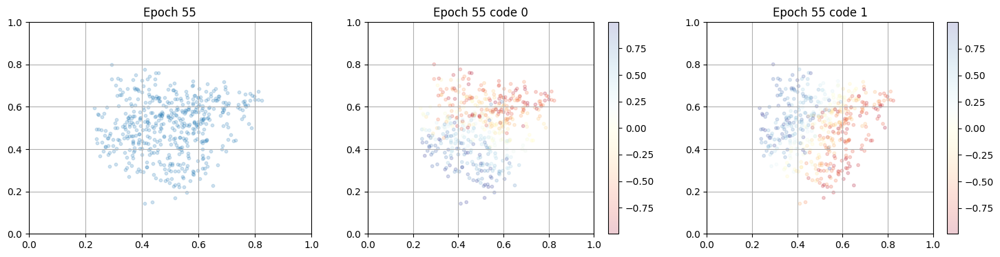

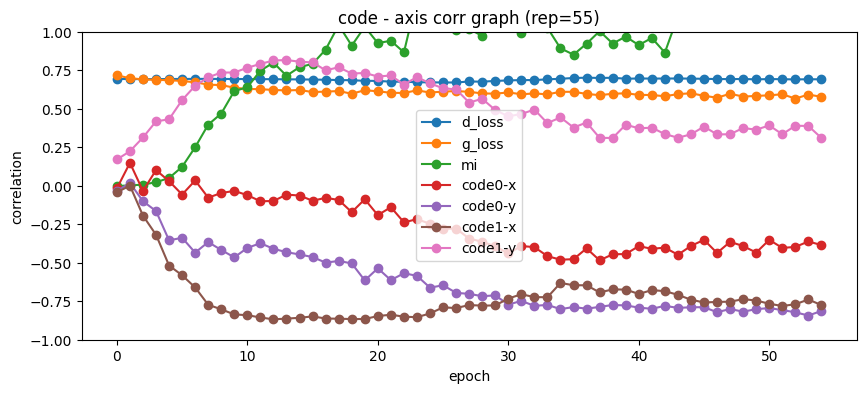

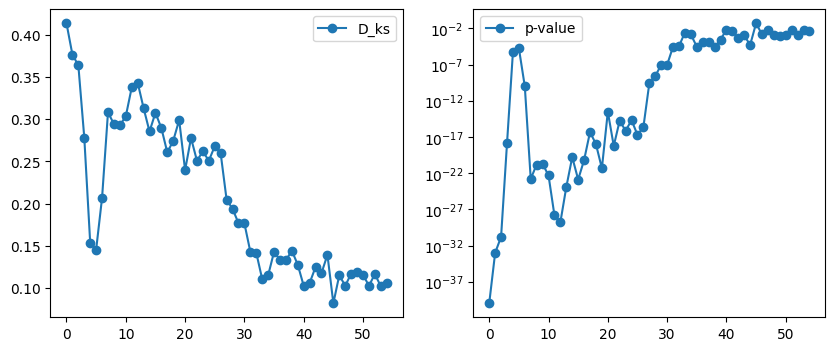

100%|██████████| 31/31 [00:10<00:00,  3.09it/s, G_loss=0.579, D_loss=0.691, MI=1.09]


epoch: 56, D_loss: 0.6905644478336457, G_loss: 0.5787580013275146, MI = 1.0922825048046727
좌표값 평균 =  0.49218386 0.511583
D_ks = 0.1328870967741937, p-value = 0.00014038854023688176


100%|██████████| 31/31 [00:10<00:00,  3.07it/s, G_loss=0.589, D_loss=0.69, MI=1.35] 


epoch: 57, D_loss: 0.6899313907469472, G_loss: 0.5892414892873457, MI = 1.3466033800955741
좌표값 평균 =  0.50553805 0.51627594
D_ks = 0.11050806451612907, p-value = 0.0026904758703603627


100%|██████████| 31/31 [00:10<00:00,  3.03it/s, G_loss=0.595, D_loss=0.692, MI=1.23]


epoch: 58, D_loss: 0.6921814064825734, G_loss: 0.594916433095932, MI = 1.2307947898103344
좌표값 평균 =  0.49762756 0.5208553
D_ks = 0.1209032258064516, p-value = 0.0007310373292778538


100%|██████████| 31/31 [00:10<00:00,  2.97it/s, G_loss=0.569, D_loss=0.691, MI=1.44]


epoch: 59, D_loss: 0.6911676506842336, G_loss: 0.5694662322921138, MI = 1.4368212021166278
좌표값 평균 =  0.50667274 0.49889606
D_ks = 0.09140322580645163, p-value = 0.02168383922073545


100%|██████████| 31/31 [00:10<00:00,  2.95it/s, G_loss=0.569, D_loss=0.693, MI=1.33]


epoch: 60, D_loss: 0.6926943371372838, G_loss: 0.5688133720428713, MI = 1.329427279772297
좌표값 평균 =  0.5061471 0.4979734
D_ks = 0.11751612903225804, p-value = 0.001130178606438339


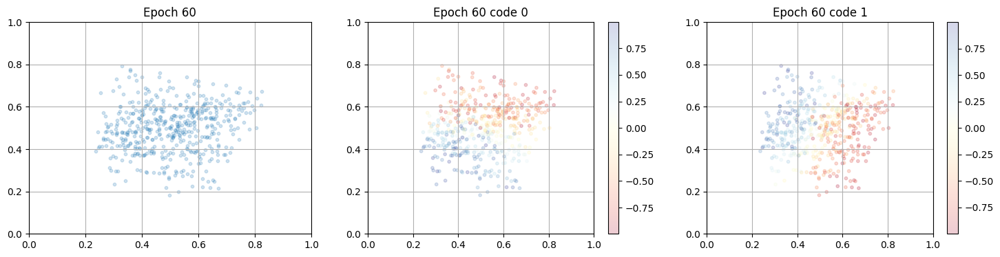

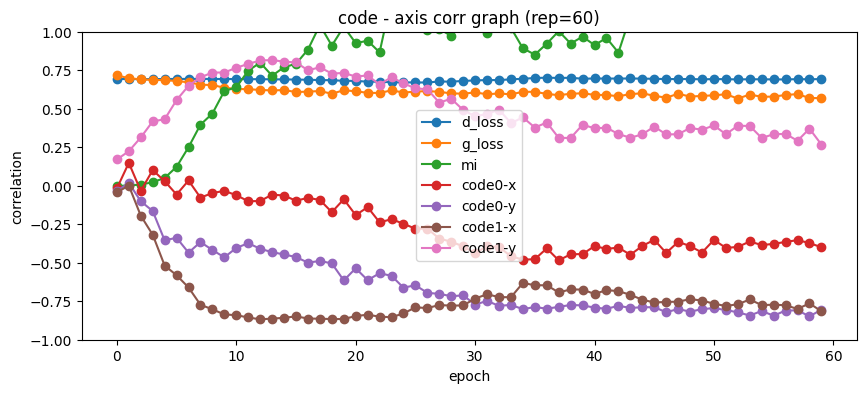

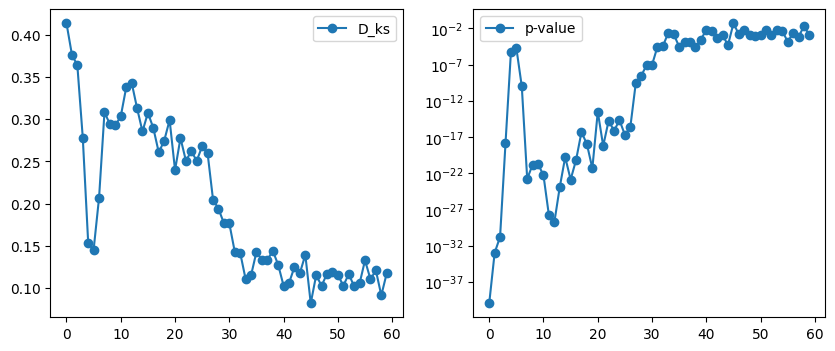

100%|██████████| 31/31 [00:10<00:00,  3.00it/s, G_loss=0.569, D_loss=0.69, MI=1.37] 


epoch: 61, D_loss: 0.6903177711271471, G_loss: 0.5693394657104246, MI = 1.3721219945338465
좌표값 평균 =  0.5020845 0.49892962
D_ks = 0.08961290322580648, p-value = 0.02597828343202242


100%|██████████| 31/31 [00:10<00:00,  3.05it/s, G_loss=0.58, D_loss=0.691, MI=1.23] 


epoch: 62, D_loss: 0.6906604439981522, G_loss: 0.57950769028356, MI = 1.2289278411096143
좌표값 평균 =  0.5033871 0.5038217
D_ks = 0.10337903225806455, p-value = 0.006138168207365008


100%|██████████| 31/31 [00:10<00:00,  3.02it/s, G_loss=0.572, D_loss=0.69, MI=1.4]  


epoch: 63, D_loss: 0.690300416561865, G_loss: 0.5719556827698985, MI = 1.3967669615822453
좌표값 평균 =  0.4932729 0.49916694
D_ks = 0.10513709677419358, p-value = 0.005029727418472699


100%|██████████| 31/31 [00:10<00:00,  3.04it/s, G_loss=0.541, D_loss=0.69, MI=1.33] 


epoch: 64, D_loss: 0.6903218819249061, G_loss: 0.5414490718995372, MI = 1.3341373070593803
좌표값 평균 =  0.50067645 0.48864394
D_ks = 0.11956451612903238, p-value = 0.0008670437344372461


100%|██████████| 31/31 [00:10<00:00,  3.03it/s, G_loss=0.565, D_loss=0.691, MI=1.26] 


epoch: 65, D_loss: 0.6912563520093118, G_loss: 0.5654792564530526, MI = 1.2600803384857793
좌표값 평균 =  0.49617922 0.49341872
D_ks = 0.1089435483870968, p-value = 0.003251361767257883


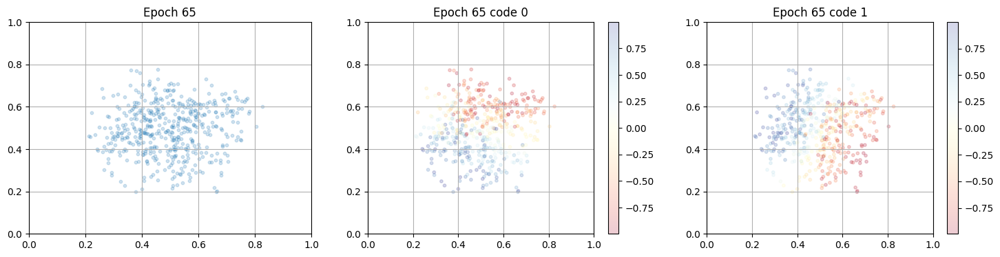

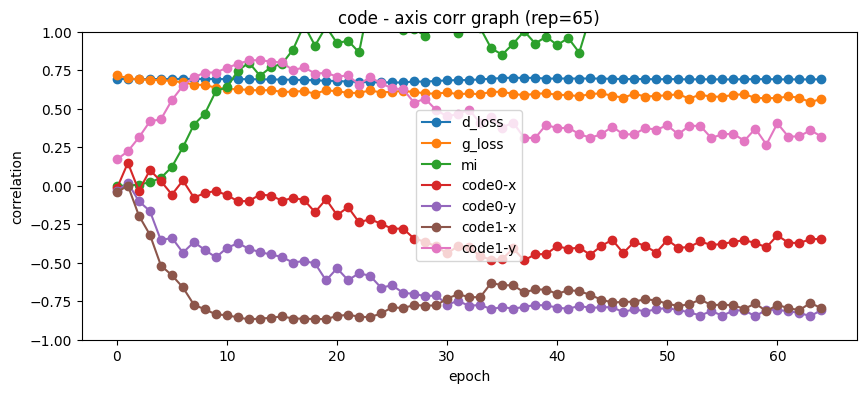

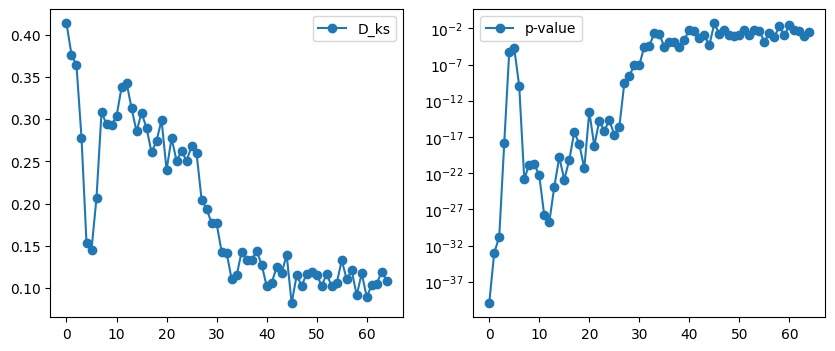

100%|██████████| 31/31 [00:10<00:00,  3.03it/s, G_loss=0.565, D_loss=0.689, MI=1.27]


epoch: 66, D_loss: 0.6892826749432471, G_loss: 0.5654317794307586, MI = 1.2674542694322524
좌표값 평균 =  0.49178004 0.49670854
D_ks = 0.11375000000000005, p-value = 0.00182037950921075


100%|██████████| 31/31 [00:10<00:00,  3.05it/s, G_loss=0.564, D_loss=0.69, MI=1.33] 


epoch: 67, D_loss: 0.6900735074473966, G_loss: 0.5638381204297466, MI = 1.328017244896581
좌표값 평균 =  0.507866 0.49137458
D_ks = 0.12164516129032257, p-value = 0.0006627218414863665


100%|██████████| 31/31 [00:10<00:00,  3.03it/s, G_loss=0.566, D_loss=0.692, MI=1.49]


epoch: 68, D_loss: 0.6915319523503703, G_loss: 0.5660121431273799, MI = 1.485171660300224
좌표값 평균 =  0.51067144 0.49631205
D_ks = 0.12075806451612917, p-value = 0.0007229267824033442


100%|██████████| 31/31 [00:10<00:00,  3.06it/s, G_loss=0.562, D_loss=0.69, MI=1.23] 


epoch: 69, D_loss: 0.6903896004922928, G_loss: 0.5621964066259323, MI = 1.2269624659130651
좌표값 평균 =  0.5021779 0.49610254
D_ks = 0.1047016129032258, p-value = 0.005291780219307452


100%|██████████| 31/31 [00:10<00:00,  3.09it/s, G_loss=0.56, D_loss=0.69, MI=1.44]  


epoch: 70, D_loss: 0.6901387610743123, G_loss: 0.5602684040223399, MI = 1.4411221627266175
좌표값 평균 =  0.49607018 0.49280608
D_ks = 0.10743548387096774, p-value = 0.0038459610569345206


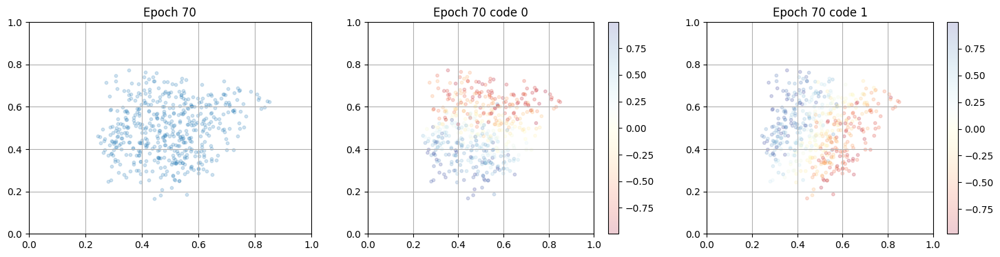

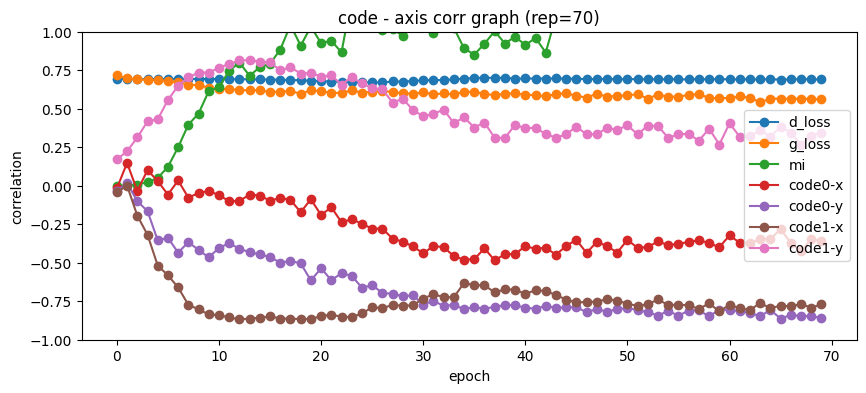

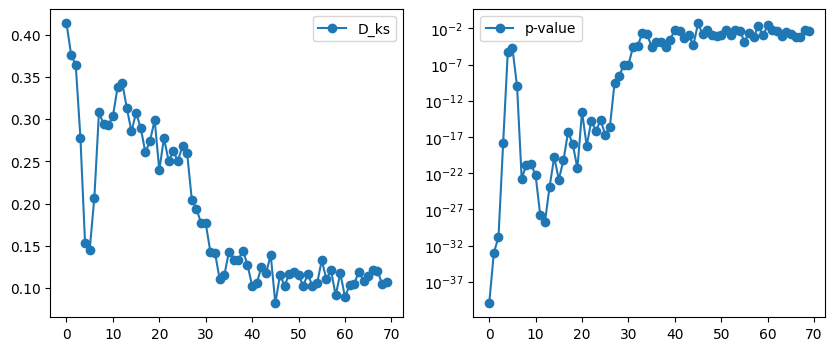

100%|██████████| 31/31 [00:10<00:00,  3.09it/s, G_loss=0.568, D_loss=0.688, MI=1.43]


epoch: 71, D_loss: 0.687599487843052, G_loss: 0.5681445242897156, MI = 1.4258457494358863
좌표값 평균 =  0.51192594 0.49410135
D_ks = 0.13012903225806458, p-value = 0.0002046338119367886


100%|██████████| 31/31 [00:10<00:00,  3.06it/s, G_loss=0.574, D_loss=0.691, MI=1.27]


epoch: 72, D_loss: 0.6908859668239471, G_loss: 0.5737626860218663, MI = 1.2706498321025603
좌표값 평균 =  0.51244396 0.50316
D_ks = 0.11214516129032259, p-value = 0.002164402882854022


100%|██████████| 31/31 [00:10<00:00,  3.06it/s, G_loss=0.577, D_loss=0.689, MI=1.5] 


epoch: 73, D_loss: 0.6891695972411863, G_loss: 0.5766801036173298, MI = 1.5017166637605237
좌표값 평균 =  0.5095999 0.5043568
D_ks = 0.09091935483870967, p-value = 0.022841835642102924


100%|██████████| 31/31 [00:10<00:00,  3.03it/s, G_loss=0.55, D_loss=0.692, MI=1.33] 


epoch: 74, D_loss: 0.6919878740464488, G_loss: 0.5498271978670551, MI = 1.3335560867863316
좌표값 평균 =  0.5018722 0.5040153
D_ks = 0.10869354838709683, p-value = 0.003297481614117531


100%|██████████| 31/31 [00:10<00:00,  3.05it/s, G_loss=0.546, D_loss=0.69, MI=1.58] 


epoch: 75, D_loss: 0.6896412718680597, G_loss: 0.5461965145603302, MI = 1.5768666824986857
좌표값 평균 =  0.49813408 0.49885017
D_ks = 0.08627419354838708, p-value = 0.035577457826805346


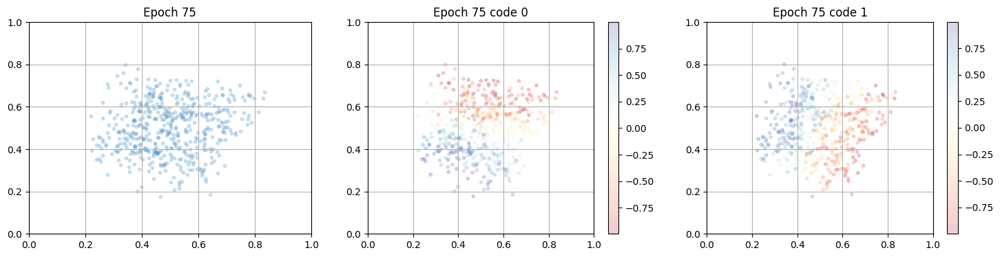

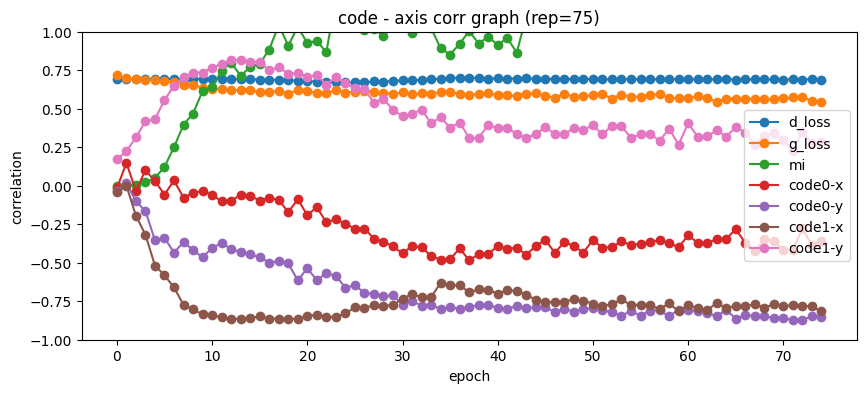

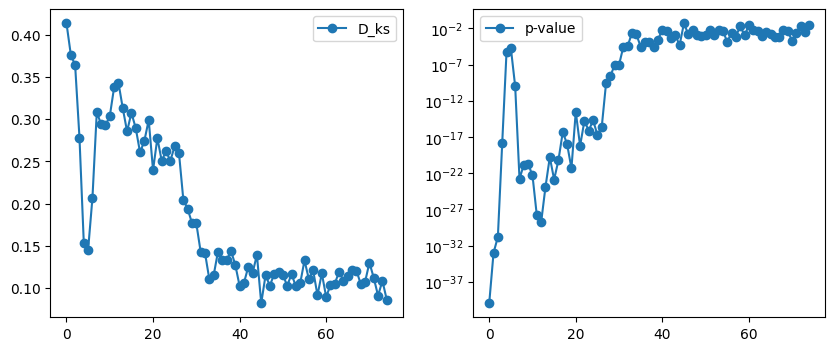

100%|██████████| 31/31 [00:10<00:00,  3.05it/s, G_loss=0.556, D_loss=0.687, MI=1.41]


epoch: 76, D_loss: 0.6873380714847196, G_loss: 0.5556306396761248, MI = 1.4082291587706535
좌표값 평균 =  0.50817376 0.50219357
D_ks = 0.12417741935483873, p-value = 0.00046733422226951884


100%|██████████| 31/31 [00:10<00:00,  3.08it/s, G_loss=0.546, D_loss=0.688, MI=1.17]


epoch: 77, D_loss: 0.6882006083765337, G_loss: 0.546245148105006, MI = 1.1742160041486063
좌표값 평균 =  0.5043342 0.5024601
D_ks = 0.1074435483870968, p-value = 0.0038696501333341108


100%|██████████| 31/31 [00:10<00:00,  3.06it/s, G_loss=0.555, D_loss=0.689, MI=1.33]


epoch: 78, D_loss: 0.6889563625858676, G_loss: 0.5554649387636492, MI = 1.3279464139092354
좌표값 평균 =  0.5130005 0.5004661
D_ks = 0.11419354838709675, p-value = 0.0016872931349662238


100%|██████████| 31/31 [00:10<00:00,  3.05it/s, G_loss=0.548, D_loss=0.691, MI=1.41]


epoch: 79, D_loss: 0.6914444700364144, G_loss: 0.5480565255688082, MI = 1.4079401108526415
좌표값 평균 =  0.49961284 0.4949184
D_ks = 0.10090322580645161, p-value = 0.007977073140872207


100%|██████████| 31/31 [00:10<00:00,  3.05it/s, G_loss=0.555, D_loss=0.689, MI=1.46] 


epoch: 80, D_loss: 0.6888476840911373, G_loss: 0.5551907747022568, MI = 1.456372889780229
좌표값 평균 =  0.50565994 0.49834067
D_ks = 0.10462903225806458, p-value = 0.005265137094313105


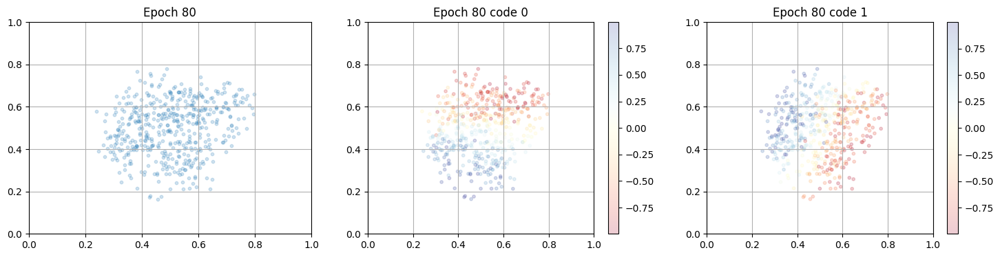

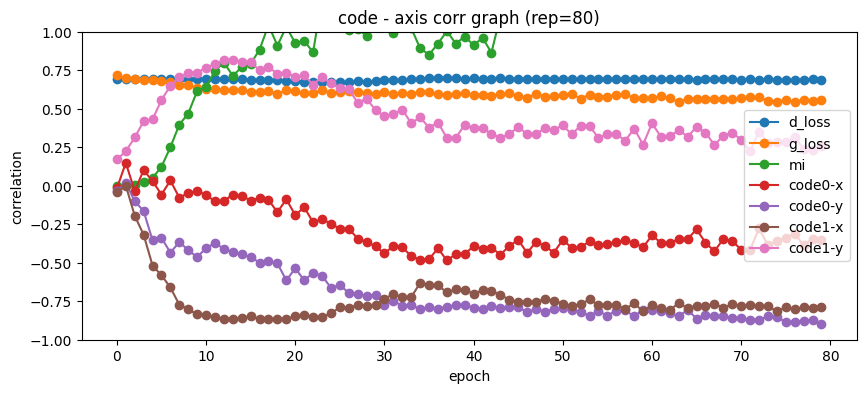

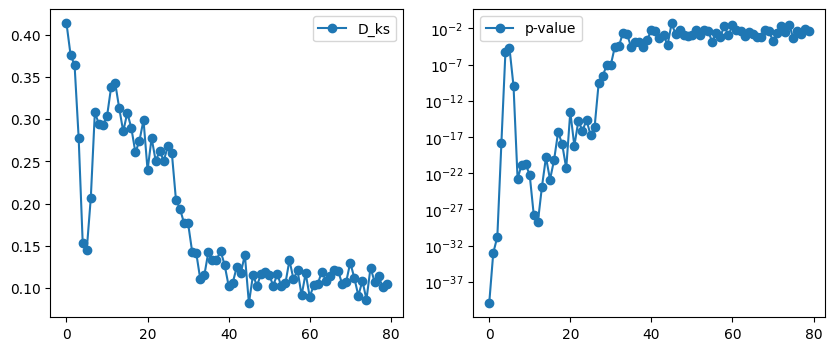

100%|██████████| 31/31 [00:10<00:00,  3.04it/s, G_loss=0.567, D_loss=0.691, MI=1.43]


epoch: 81, D_loss: 0.6906731532466027, G_loss: 0.5665898630695958, MI = 1.4260686429277543
좌표값 평균 =  0.49729487 0.50584066
D_ks = 0.08795161290322581, p-value = 0.03035177198633342


100%|██████████| 31/31 [00:10<00:00,  2.93it/s, G_loss=0.568, D_loss=0.691, MI=1.48]


epoch: 82, D_loss: 0.6912900824700633, G_loss: 0.5678213171420559, MI = 1.4846267113762517
좌표값 평균 =  0.5034514 0.50936896
D_ks = 0.11112096774193544, p-value = 0.0024516550445140557


100%|██████████| 31/31 [00:10<00:00,  3.02it/s, G_loss=0.576, D_loss=0.691, MI=1.24]


epoch: 83, D_loss: 0.6908369775741331, G_loss: 0.5757085757870828, MI = 1.2447187352565028
좌표값 평균 =  0.50657713 0.50020474
D_ks = 0.10164516129032256, p-value = 0.0073954851358868055


100%|██████████| 31/31 [00:10<00:00,  3.00it/s, G_loss=0.551, D_loss=0.689, MI=1.29]


epoch: 84, D_loss: 0.6891417984039553, G_loss: 0.5514416531209023, MI = 1.2946622554332978
좌표값 평균 =  0.50379443 0.50722885
D_ks = 0.0815403225806452, p-value = 0.05453314353940805


100%|██████████| 31/31 [00:10<00:00,  2.99it/s, G_loss=0.557, D_loss=0.69, MI=1.23] 


epoch: 85, D_loss: 0.6900665817722198, G_loss: 0.5567401157271478, MI = 1.2265679961250675
좌표값 평균 =  0.49457395 0.5064388
D_ks = 0.09835483870967743, p-value = 0.010610383868522266


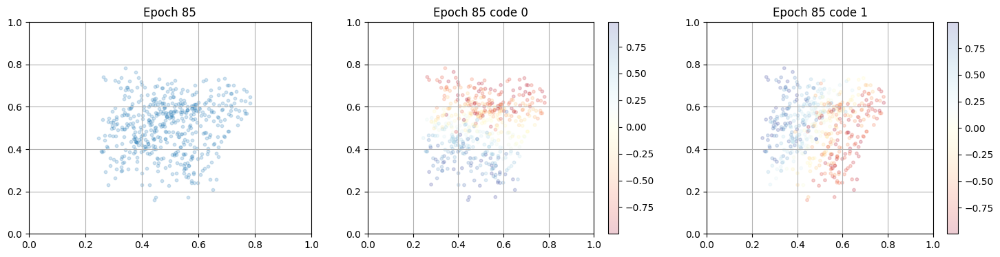

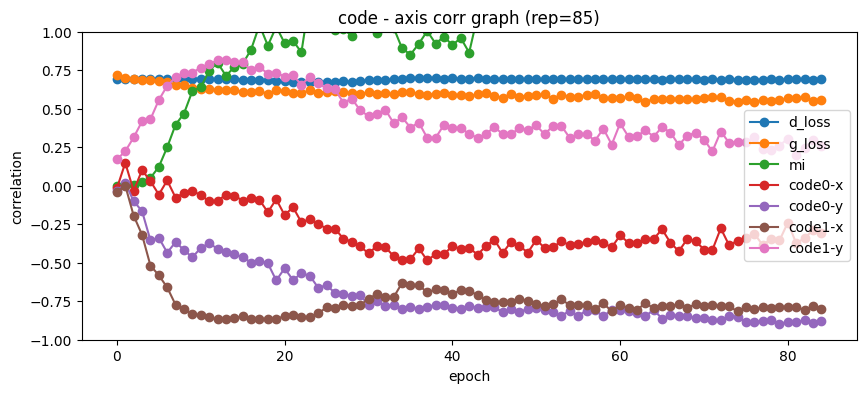

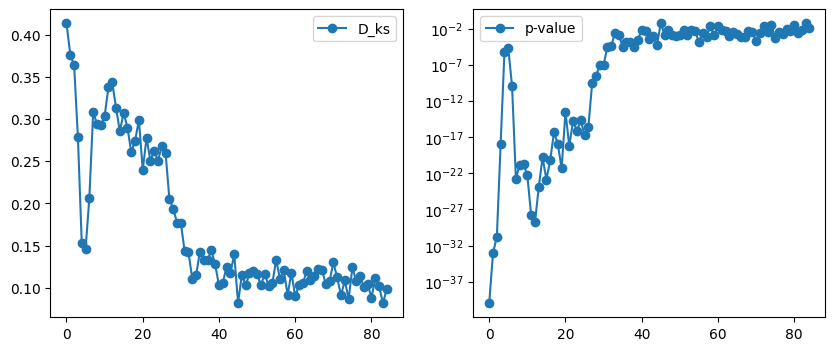

100%|██████████| 31/31 [00:10<00:00,  3.03it/s, G_loss=0.556, D_loss=0.692, MI=1.39]


epoch: 86, D_loss: 0.6916798641604762, G_loss: 0.5555825742983049, MI = 1.3888630655504042
좌표값 평균 =  0.49376574 0.5064802
D_ks = 0.10669354838709677, p-value = 0.00416287198712748


100%|██████████| 31/31 [00:10<00:00,  3.04it/s, G_loss=0.547, D_loss=0.692, MI=1.29]


epoch: 87, D_loss: 0.6919074577669944, G_loss: 0.5469546952555256, MI = 1.2888805077921959
좌표값 평균 =  0.50042415 0.50960386
D_ks = 0.11760483870967742, p-value = 0.0010907954184516616


100%|██████████| 31/31 [00:10<00:00,  3.05it/s, G_loss=0.568, D_loss=0.69, MI=1.44] 


epoch: 88, D_loss: 0.6903480233684662, G_loss: 0.5684736890177573, MI = 1.4425863565937165
좌표값 평균 =  0.4988453 0.49446476
D_ks = 0.10813709677419353, p-value = 0.0034578162039388266


100%|██████████| 31/31 [00:10<00:00,  3.05it/s, G_loss=0.581, D_loss=0.69, MI=1.41] 


epoch: 89, D_loss: 0.6902034263457021, G_loss: 0.5814560469119779, MI = 1.4065001991487318
좌표값 평균 =  0.50192803 0.50109667
D_ks = 0.09933064516129031, p-value = 0.00934624493595172


100%|██████████| 31/31 [00:10<00:00,  3.07it/s, G_loss=0.57, D_loss=0.692, MI=1.31] 


epoch: 90, D_loss: 0.6917773888957116, G_loss: 0.5700056168340868, MI = 1.3086153701428445
좌표값 평균 =  0.50631434 0.5095216
D_ks = 0.1026048387096774, p-value = 0.006484384769643223


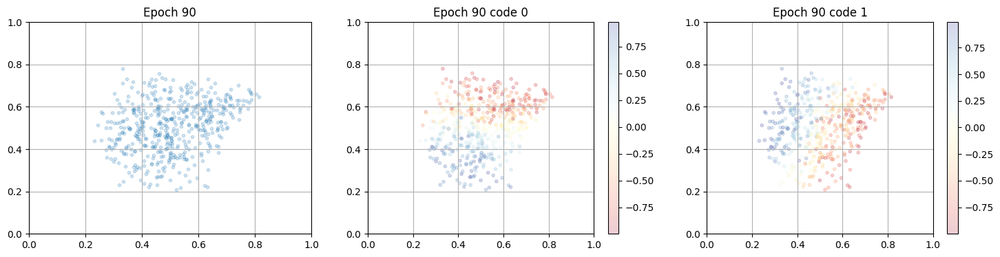

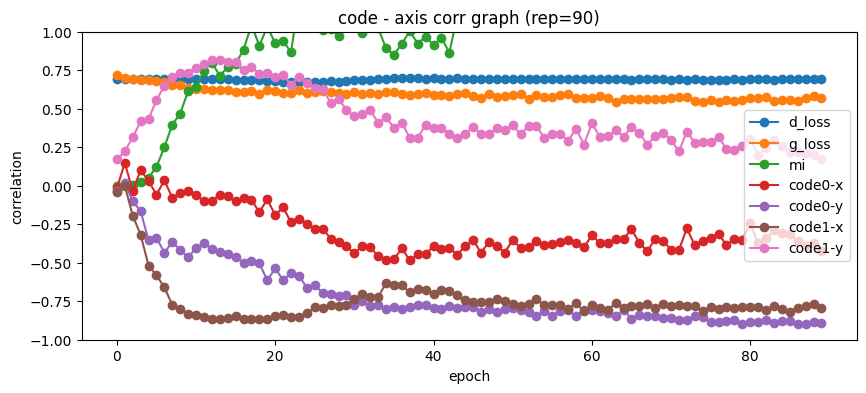

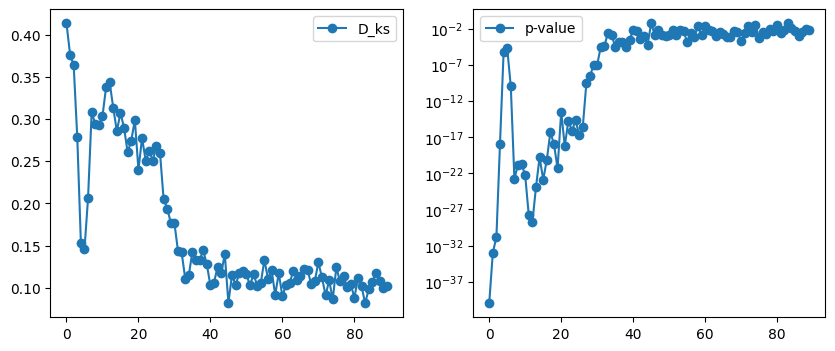

100%|██████████| 31/31 [00:10<00:00,  3.01it/s, G_loss=0.539, D_loss=0.692, MI=1.29]


epoch: 91, D_loss: 0.6917815458390021, G_loss: 0.5390414134148629, MI = 1.2850873850045665
좌표값 평균 =  0.50238866 0.5036178
D_ks = 0.09535483870967744, p-value = 0.014512163842389646


100%|██████████| 31/31 [00:10<00:00,  2.97it/s, G_loss=0.555, D_loss=0.692, MI=1.4] 


epoch: 92, D_loss: 0.6923280512132952, G_loss: 0.5550659596920013, MI = 1.40020772141795
좌표값 평균 =  0.50132626 0.5080384
D_ks = 0.10751612903225807, p-value = 0.0037154180550502684


100%|██████████| 31/31 [00:10<00:00,  3.02it/s, G_loss=0.558, D_loss=0.69, MI=1.36] 


epoch: 93, D_loss: 0.6904863676717204, G_loss: 0.5584889890686158, MI = 1.3600135647481488
좌표값 평균 =  0.5030416 0.49725568
D_ks = 0.09010483870967742, p-value = 0.02449033221560521


100%|██████████| 31/31 [00:10<00:00,  2.99it/s, G_loss=0.548, D_loss=0.69, MI=1.53] 


epoch: 94, D_loss: 0.6899515409623423, G_loss: 0.548264729399835, MI = 1.528300924647239
좌표값 평균 =  0.48915592 0.49881464
D_ks = 0.11250000000000002, p-value = 0.0020962866096416962


100%|██████████| 31/31 [00:10<00:00,  3.00it/s, G_loss=0.558, D_loss=0.69, MI=1.48] 


epoch: 95, D_loss: 0.6896165628587047, G_loss: 0.558017066409511, MI = 1.4753873848146009
좌표값 평균 =  0.49992436 0.501003
D_ks = 0.09670161290322579, p-value = 0.01262908656125211


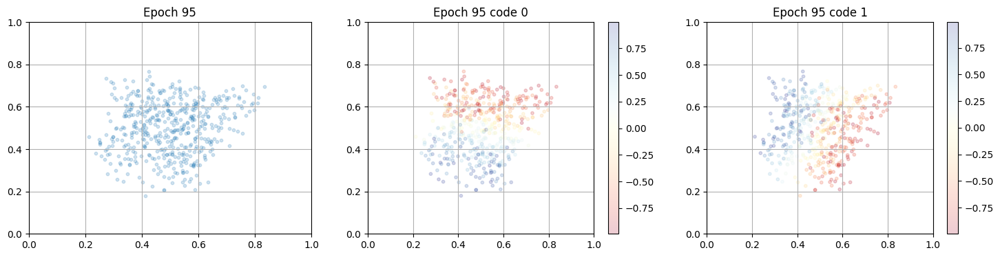

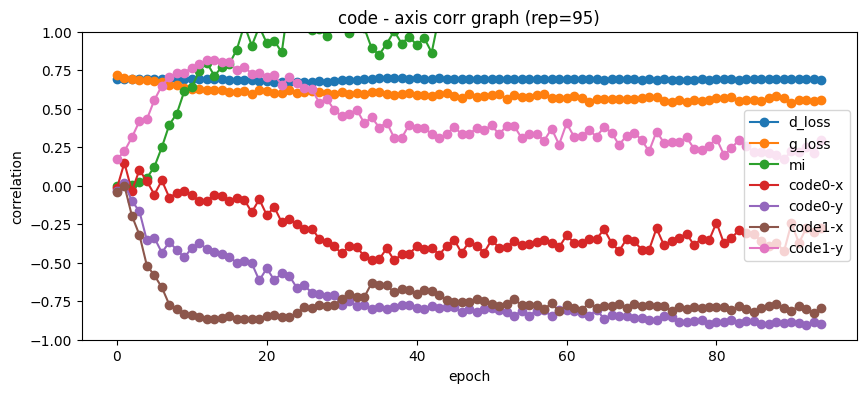

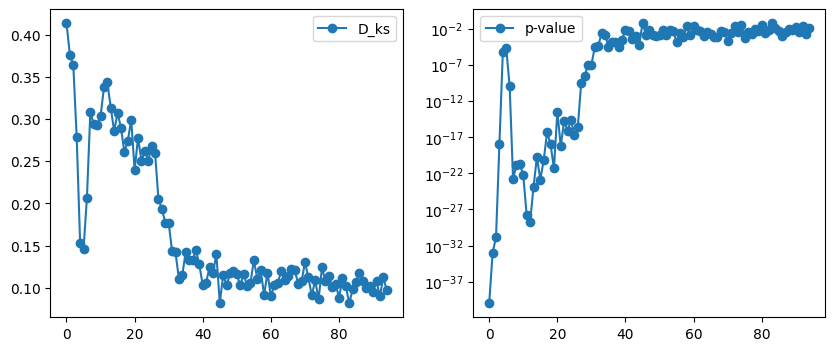

100%|██████████| 31/31 [00:10<00:00,  2.95it/s, G_loss=0.565, D_loss=0.689, MI=1.39]


epoch: 96, D_loss: 0.6893775424649639, G_loss: 0.5653856656243724, MI = 1.3868783260545423
좌표값 평균 =  0.499466 0.50076514
D_ks = 0.09087903225806454, p-value = 0.022627952923099225


100%|██████████| 31/31 [00:10<00:00,  2.98it/s, G_loss=0.564, D_loss=0.692, MI=1.36]


epoch: 97, D_loss: 0.692116537401753, G_loss: 0.5641705422632156, MI = 1.3639684002245627
좌표값 평균 =  0.5021397 0.49443534
D_ks = 0.10597580645161295, p-value = 0.004568597496617347


100%|██████████| 31/31 [00:10<00:00,  3.01it/s, G_loss=0.563, D_loss=0.687, MI=1.49]


epoch: 98, D_loss: 0.6872870787497489, G_loss: 0.5626519928055425, MI = 1.4892040558399693
좌표값 평균 =  0.48456615 0.5003992
D_ks = 0.11389516129032265, p-value = 0.00174692718565191


100%|██████████| 31/31 [00:10<00:00,  3.06it/s, G_loss=0.546, D_loss=0.691, MI=1.48]


epoch: 99, D_loss: 0.690856643261448, G_loss: 0.546415239572525, MI = 1.4790506545574433
좌표값 평균 =  0.49606463 0.50557244
D_ks = 0.1145483870967742, p-value = 0.0015961420668224235


100%|██████████| 31/31 [00:10<00:00,  2.99it/s, G_loss=0.545, D_loss=0.688, MI=1.51]


epoch: 100, D_loss: 0.6877963792893195, G_loss: 0.5454190825262377, MI = 1.5125694851721487
좌표값 평균 =  0.49728903 0.4986491
D_ks = 0.10716935483870967, p-value = 0.003924321179810081


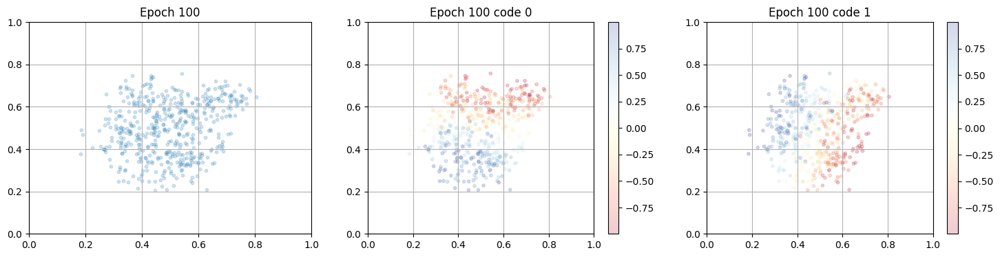

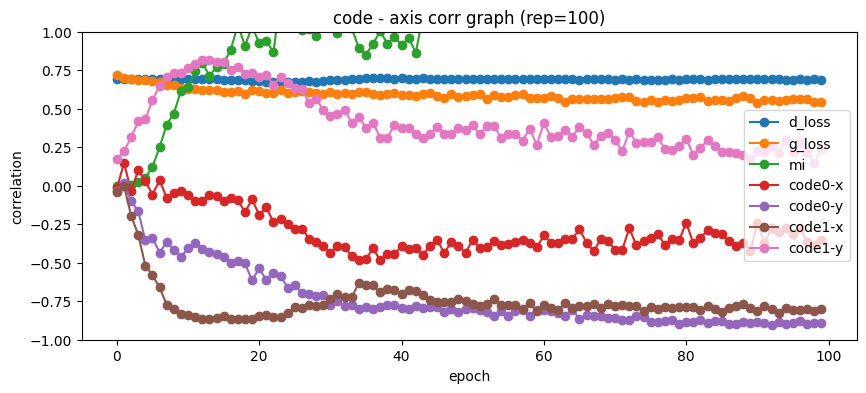

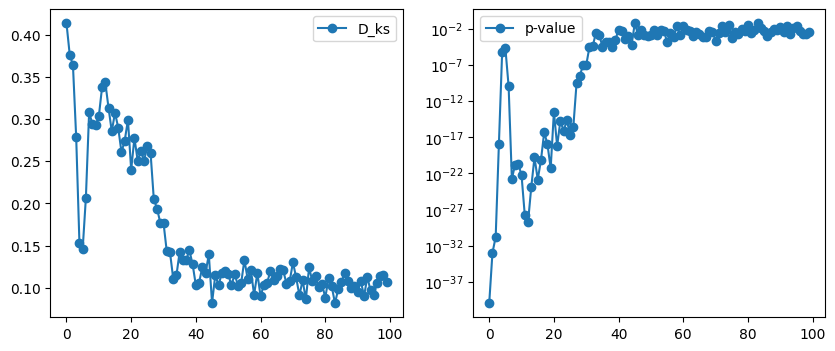

100%|██████████| 31/31 [00:10<00:00,  2.99it/s, G_loss=0.56, D_loss=0.69, MI=1.52]  


epoch: 101, D_loss: 0.690334310454707, G_loss: 0.5603464140046027, MI = 1.521835147373138
좌표값 평균 =  0.48871693 0.494855
D_ks = 0.13181451612903228, p-value = 0.00016241993297560835


100%|██████████| 31/31 [00:10<00:00,  2.96it/s, G_loss=0.555, D_loss=0.689, MI=1.32]


epoch: 102, D_loss: 0.6890124217156441, G_loss: 0.5550687995649153, MI = 1.315145028214301
좌표값 평균 =  0.5032619 0.50800097
D_ks = 0.09608064516129032, p-value = 0.013299803233333048


100%|██████████| 31/31 [00:10<00:00,  2.96it/s, G_loss=0.542, D_loss=0.69, MI=1.42] 


epoch: 103, D_loss: 0.6896279877231967, G_loss: 0.5421713686758473, MI = 1.4249342131999232
좌표값 평균 =  0.5077667 0.5057895
D_ks = 0.08487903225806451, p-value = 0.040317663526178535


100%|██████████| 31/31 [00:10<00:00,  2.97it/s, G_loss=0.536, D_loss=0.69, MI=1.36] 


epoch: 104, D_loss: 0.6899022613802264, G_loss: 0.5361804010406617, MI = 1.3640826652126927
좌표값 평균 =  0.51915276 0.5011656
D_ks = 0.1047822580645161, p-value = 0.005128014424064992


100%|██████████| 31/31 [00:10<00:00,  2.98it/s, G_loss=0.565, D_loss=0.688, MI=1.38]


epoch: 105, D_loss: 0.6879075381063646, G_loss: 0.5654541513612193, MI = 1.376699177488204
좌표값 평균 =  0.504316 0.49546763
D_ks = 0.11618548387096786, p-value = 0.0013261993527962693


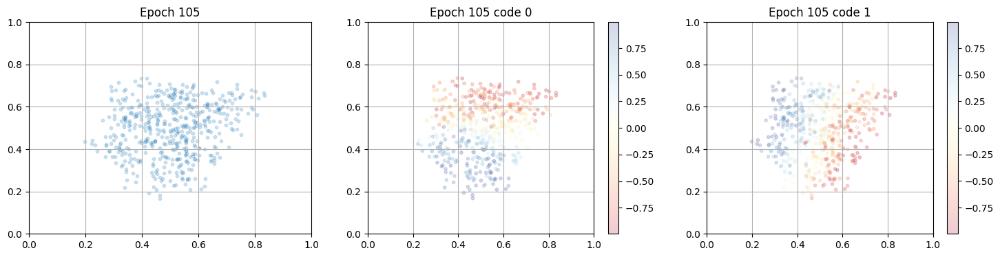

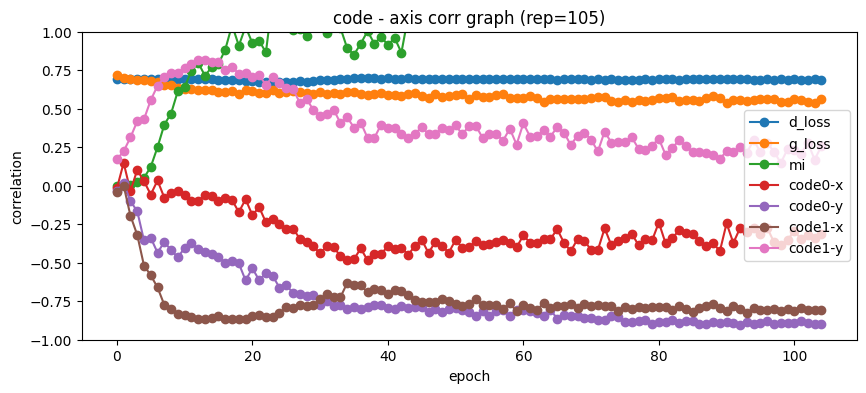

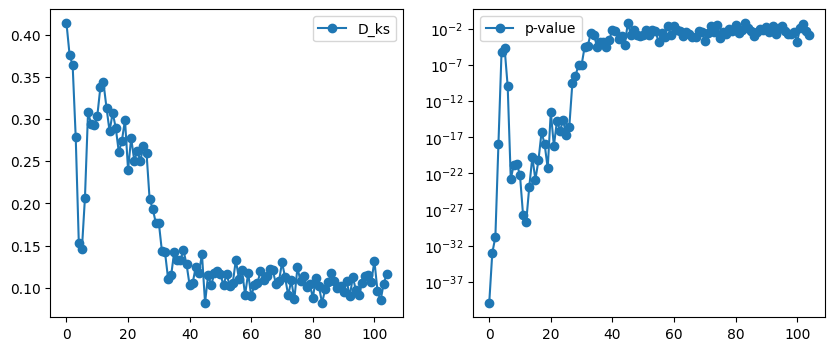

100%|██████████| 31/31 [00:10<00:00,  2.98it/s, G_loss=0.552, D_loss=0.691, MI=1.35]


epoch: 106, D_loss: 0.6908170273227077, G_loss: 0.551500323318666, MI = 1.3456297545663771
좌표값 평균 =  0.5029696 0.50383884
D_ks = 0.088, p-value = 0.029904999633490456


100%|██████████| 31/31 [00:10<00:00,  2.96it/s, G_loss=0.557, D_loss=0.69, MI=1.32] 


epoch: 107, D_loss: 0.6900329685980274, G_loss: 0.5568739108500942, MI = 1.3219819722637054
좌표값 평균 =  0.5075755 0.50047034
D_ks = 0.1052096774193549, p-value = 0.004883058702900598


100%|██████████| 31/31 [00:10<00:00,  2.99it/s, G_loss=0.572, D_loss=0.69, MI=1.58] 


epoch: 108, D_loss: 0.6896571805400233, G_loss: 0.5722814471490921, MI = 1.5820623886200689
좌표값 평균 =  0.515163 0.50000834
D_ks = 0.11024193548387096, p-value = 0.002738126907321699


100%|██████████| 31/31 [00:10<00:00,  2.98it/s, G_loss=0.572, D_loss=0.691, MI=1.43]


epoch: 109, D_loss: 0.6911079614393173, G_loss: 0.571860199013064, MI = 1.4288817144209338
좌표값 평균 =  0.5185134 0.50187314
D_ks = 0.10913709677419356, p-value = 0.0030772765649964614


100%|██████████| 31/31 [00:10<00:00,  3.01it/s, G_loss=0.556, D_loss=0.689, MI=1.39]


epoch: 110, D_loss: 0.6893969370472816, G_loss: 0.555557971039126, MI = 1.3935144759954945
좌표값 평균 =  0.5002186 0.50651324
D_ks = 0.09025806451612903, p-value = 0.024030918914789794


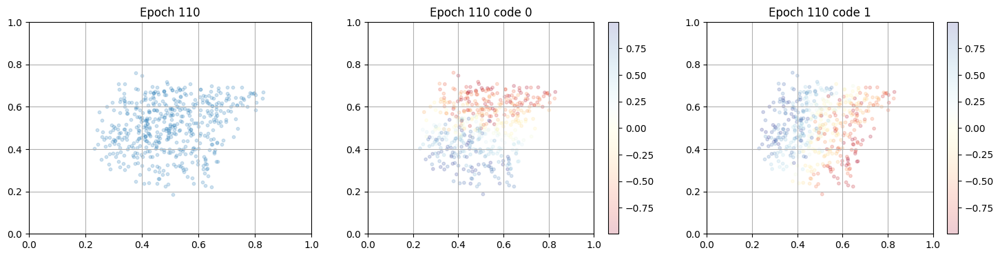

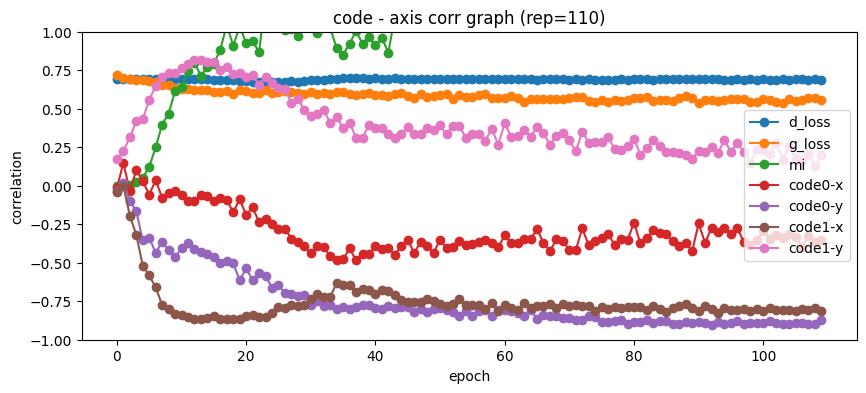

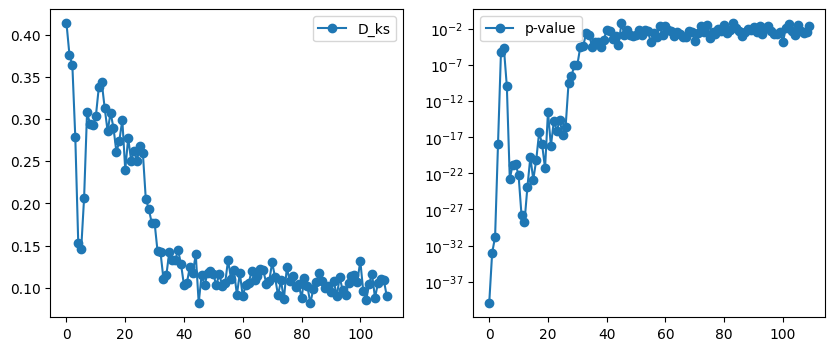

100%|██████████| 31/31 [00:10<00:00,  3.04it/s, G_loss=0.553, D_loss=0.69, MI=1.36] 


epoch: 111, D_loss: 0.689994590897714, G_loss: 0.5533516656967902, MI = 1.3560899092305092
좌표값 평균 =  0.5013111 0.49522984
D_ks = 0.09738709677419355, p-value = 0.011712478783083126


100%|██████████| 31/31 [00:10<00:00,  3.05it/s, G_loss=0.549, D_loss=0.689, MI=1.55]


epoch: 112, D_loss: 0.6893040037924244, G_loss: 0.5492635109732228, MI = 1.5514078890123675
좌표값 평균 =  0.5056043 0.50234836
D_ks = 0.0896774193548387, p-value = 0.025370820068886173


100%|██████████| 31/31 [00:10<00:00,  3.04it/s, G_loss=0.546, D_loss=0.689, MI=1.49]


epoch: 113, D_loss: 0.6892991046751699, G_loss: 0.546303411645274, MI = 1.492507932647582
좌표값 평균 =  0.5031962 0.5123187
D_ks = 0.09584677419354842, p-value = 0.013763017693382047


100%|██████████| 31/31 [00:10<00:00,  3.03it/s, G_loss=0.537, D_loss=0.69, MI=1.56] 


epoch: 114, D_loss: 0.6895675159269764, G_loss: 0.5365170894130584, MI = 1.5603114539577114
좌표값 평균 =  0.5101235 0.49564883
D_ks = 0.0923225806451613, p-value = 0.019481713409897256


100%|██████████| 31/31 [00:10<00:00,  3.03it/s, G_loss=0.547, D_loss=0.689, MI=1.55]


epoch: 115, D_loss: 0.6893587573882072, G_loss: 0.5474999893096185, MI = 1.5497492820985856
좌표값 평균 =  0.50616246 0.5019348
D_ks = 0.08903225806451616, p-value = 0.02691493846053531


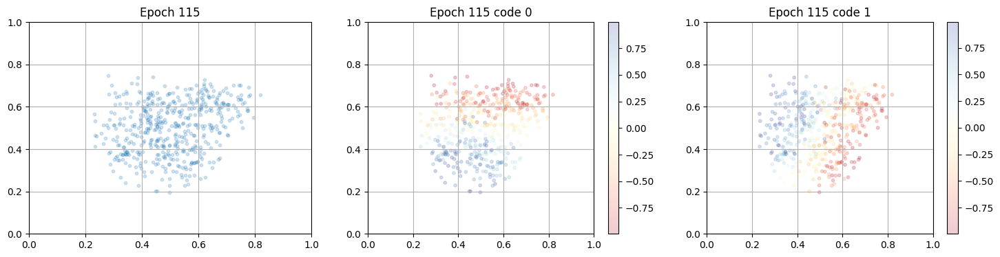

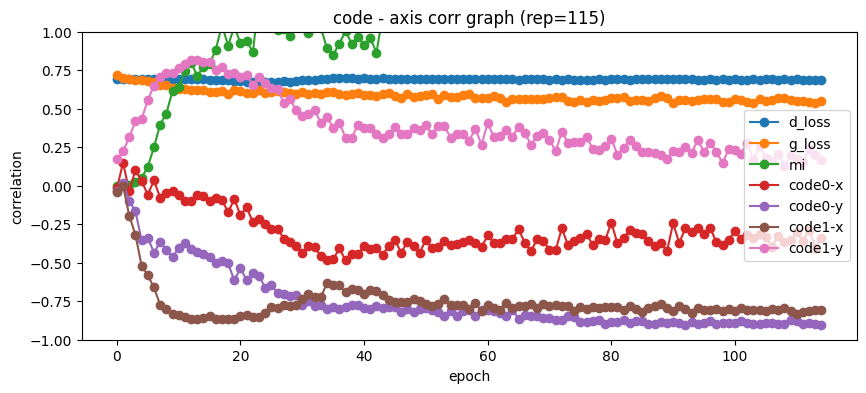

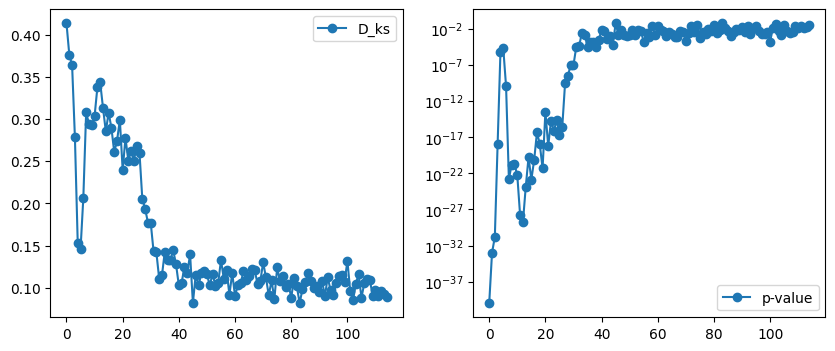

100%|██████████| 31/31 [00:10<00:00,  3.02it/s, G_loss=0.544, D_loss=0.689, MI=1.45]


epoch: 116, D_loss: 0.6889805063124625, G_loss: 0.5441407657438709, MI = 1.4483473320161142
좌표값 평균 =  0.5100174 0.5037045
D_ks = 0.09650806451612906, p-value = 0.012726902017492978


100%|██████████| 31/31 [00:10<00:00,  2.99it/s, G_loss=0.552, D_loss=0.69, MI=1.8]  


epoch: 117, D_loss: 0.6900473929220631, G_loss: 0.5520248115062714, MI = 1.8016745563476317
좌표값 평균 =  0.50453585 0.5043607
D_ks = 0.09069354838709678, p-value = 0.022993883972034505


100%|██████████| 31/31 [00:10<00:00,  3.02it/s, G_loss=0.565, D_loss=0.689, MI=1.75]


epoch: 118, D_loss: 0.6887982468451223, G_loss: 0.5646775412944055, MI = 1.750476997706198
좌표값 평균 =  0.519418 0.5022388
D_ks = 0.10269354838709677, p-value = 0.006570338012737781


100%|██████████| 31/31 [00:10<00:00,  3.09it/s, G_loss=0.555, D_loss=0.691, MI=1.5] 


epoch: 119, D_loss: 0.6912090066940554, G_loss: 0.5552167344477869, MI = 1.498751581195862
좌표값 평균 =  0.5025972 0.5088187
D_ks = 0.09016129032258062, p-value = 0.024258686876506168


100%|██████████| 31/31 [00:10<00:00,  3.07it/s, G_loss=0.55, D_loss=0.692, MI=1.31] 


epoch: 120, D_loss: 0.6916637939791526, G_loss: 0.5497248788033763, MI = 1.310852014249371
좌표값 평균 =  0.5055831 0.50218356
D_ks = 0.08614516129032257, p-value = 0.035738861608922944


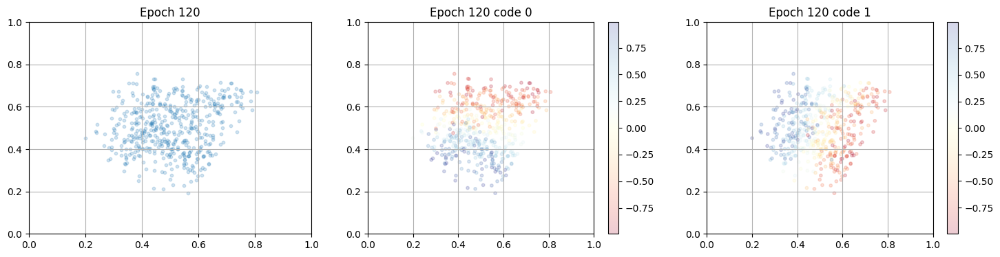

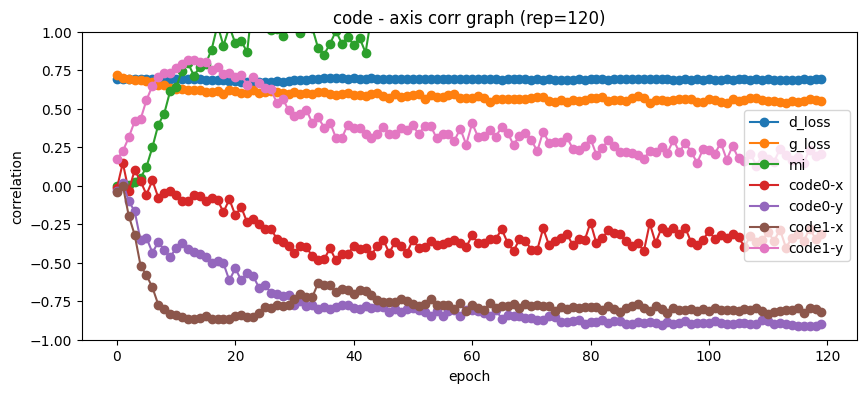

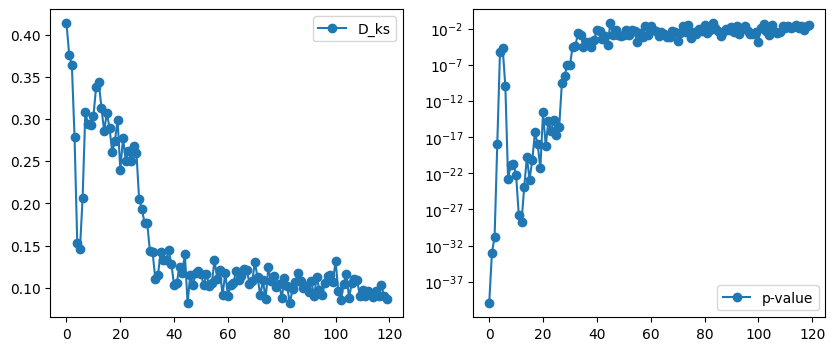

100%|██████████| 31/31 [00:10<00:00,  3.08it/s, G_loss=0.555, D_loss=0.689, MI=1.57]


epoch: 121, D_loss: 0.689464888265056, G_loss: 0.5545092148165549, MI = 1.5708226523091715
좌표값 평균 =  0.50069165 0.5097854
D_ks = 0.10592741935483874, p-value = 0.004544905670422734


100%|██████████| 31/31 [00:10<00:00,  3.03it/s, G_loss=0.555, D_loss=0.691, MI=1.35]


epoch: 122, D_loss: 0.6908937308096117, G_loss: 0.5547464441868567, MI = 1.351049252094761
좌표값 평균 =  0.51493204 0.5122217
D_ks = 0.1032096774193548, p-value = 0.006082645124816492


100%|██████████| 31/31 [00:10<00:00,  3.03it/s, G_loss=0.539, D_loss=0.69, MI=1.75] 


epoch: 123, D_loss: 0.690070959829515, G_loss: 0.5392411024339737, MI = 1.7539352168959956
좌표값 평균 =  0.5033821 0.50280994
D_ks = 0.0882983870967742, p-value = 0.029124869100768037


100%|██████████| 31/31 [00:10<00:00,  3.05it/s, G_loss=0.543, D_loss=0.69, MI=1.47] 


epoch: 124, D_loss: 0.6896209947524532, G_loss: 0.5430678206105386, MI = 1.4670244734133444
좌표값 평균 =  0.51661086 0.5081947
D_ks = 0.09691935483870973, p-value = 0.012236292981619535


100%|██████████| 31/31 [00:10<00:00,  3.05it/s, G_loss=0.562, D_loss=0.692, MI=1.41]


epoch: 125, D_loss: 0.6920823377947654, G_loss: 0.5623689140042951, MI = 1.4085751521971919
좌표값 평균 =  0.5076434 0.5082173
D_ks = 0.08402419354838711, p-value = 0.043385569396705494


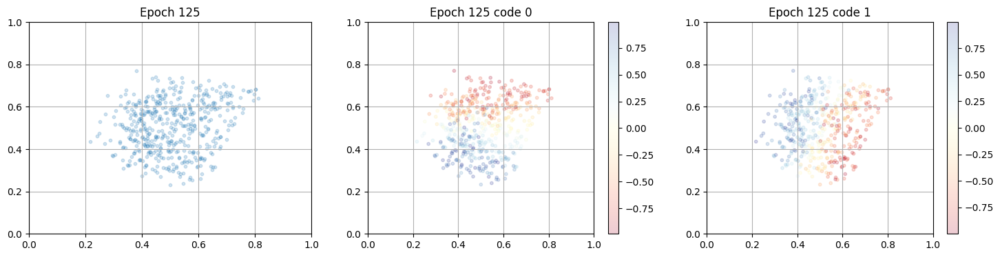

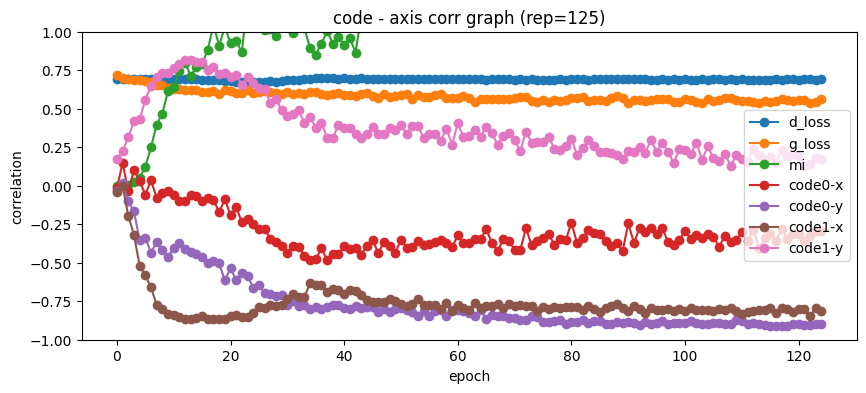

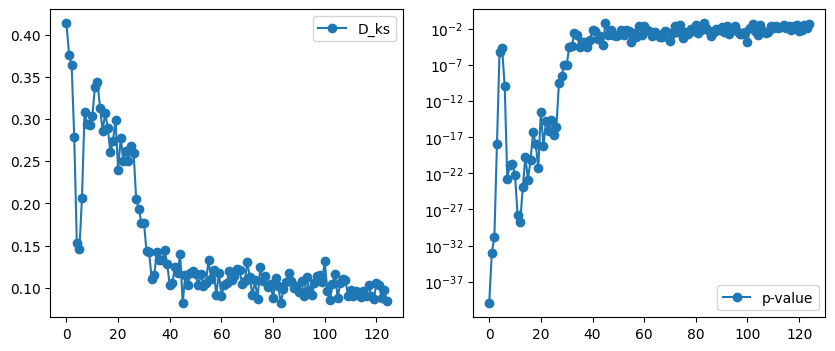

100%|██████████| 31/31 [00:10<00:00,  3.08it/s, G_loss=0.549, D_loss=0.691, MI=1.51]


epoch: 126, D_loss: 0.6905986897407039, G_loss: 0.5488137602806091, MI = 1.5082425994257773
좌표값 평균 =  0.5050285 0.51049465
D_ks = 0.09770161290322579, p-value = 0.011233455604770863


100%|██████████| 31/31 [00:10<00:00,  3.08it/s, G_loss=0.536, D_loss=0.691, MI=1.54]


epoch: 127, D_loss: 0.6912949335190558, G_loss: 0.5364817967337947, MI = 1.5432103824230932
좌표값 평균 =  0.51513404 0.51741934
D_ks = 0.11899193548387096, p-value = 0.0009258629035409584


100%|██████████| 31/31 [00:10<00:00,  3.02it/s, G_loss=0.537, D_loss=0.69, MI=1.45] 


epoch: 128, D_loss: 0.6899494471088532, G_loss: 0.5368538748833441, MI = 1.4455461425165976
좌표값 평균 =  0.5113403 0.5089278
D_ks = 0.08808064516129033, p-value = 0.029956470545633433


100%|██████████| 31/31 [00:10<00:00,  3.05it/s, G_loss=0.545, D_loss=0.688, MI=1.48]


epoch: 129, D_loss: 0.687866953111464, G_loss: 0.5447348413928863, MI = 1.4758201943289848
좌표값 평균 =  0.51275575 0.51422924
D_ks = 0.10253225806451613, p-value = 0.006740107444079747


100%|██████████| 31/31 [00:10<00:00,  3.07it/s, G_loss=0.562, D_loss=0.689, MI=1.32] 


epoch: 130, D_loss: 0.688880112863356, G_loss: 0.5616770271332033, MI = 1.321834179662889
좌표값 평균 =  0.49620548 0.49844995
D_ks = 0.09756451612903227, p-value = 0.011586572379023009


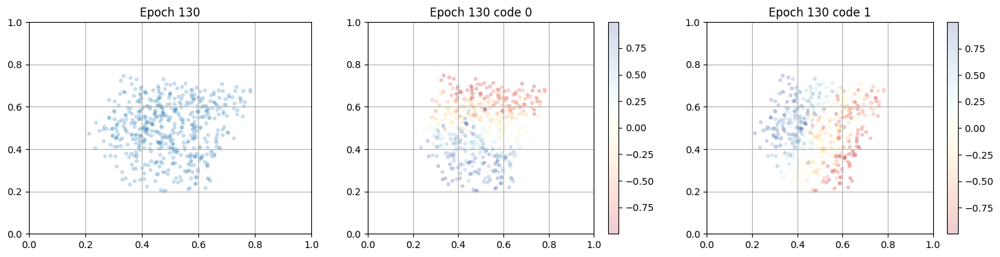

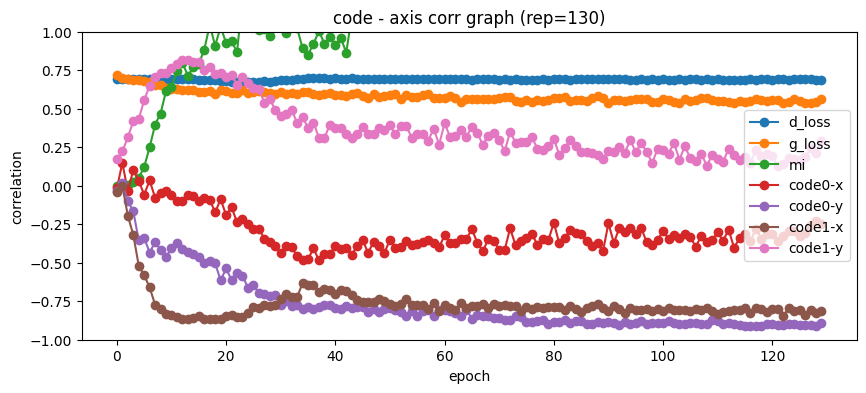

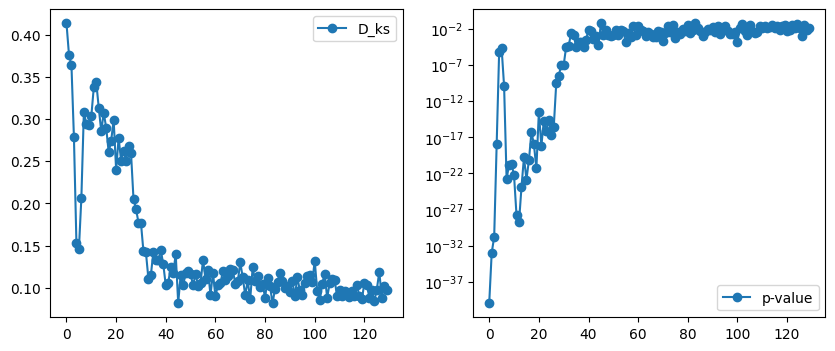

100%|██████████| 31/31 [00:10<00:00,  3.09it/s, G_loss=0.53, D_loss=0.691, MI=1.67] 


epoch: 131, D_loss: 0.6910242246043298, G_loss: 0.5298115697599226, MI = 1.6655875146389008
좌표값 평균 =  0.5056693 0.5005512
D_ks = 0.07448387096774198, p-value = 0.09895104099871649


100%|██████████| 31/31 [00:10<00:00,  3.05it/s, G_loss=0.551, D_loss=0.692, MI=1.31]


epoch: 132, D_loss: 0.6915843313740145, G_loss: 0.5505102401779544, MI = 1.3116647389627272
좌표값 평균 =  0.51053673 0.50919956
D_ks = 0.1040161290322581, p-value = 0.005647035972279411


100%|██████████| 31/31 [00:10<00:00,  3.04it/s, G_loss=0.527, D_loss=0.689, MI=1.63]


epoch: 133, D_loss: 0.6894150722411371, G_loss: 0.527431369789185, MI = 1.6339184084246237
좌표값 평균 =  0.51074463 0.5114443
D_ks = 0.09607258064516133, p-value = 0.01346509928239512


100%|██████████| 31/31 [00:10<00:00,  3.01it/s, G_loss=0.56, D_loss=0.691, MI=1.38] 


epoch: 134, D_loss: 0.6905383679174608, G_loss: 0.559975802898407, MI = 1.3831888533407641
좌표값 평균 =  0.5119827 0.51159644
D_ks = 0.08207258064516129, p-value = 0.052319470684065214


100%|██████████| 31/31 [00:10<00:00,  3.07it/s, G_loss=0.55, D_loss=0.692, MI=1.23] 


epoch: 135, D_loss: 0.6915393760127406, G_loss: 0.5504513555957425, MI = 1.2348516174862463
좌표값 평균 =  0.5055306 0.5082645
D_ks = 0.06238709677419366, p-value = 0.2427656357560526


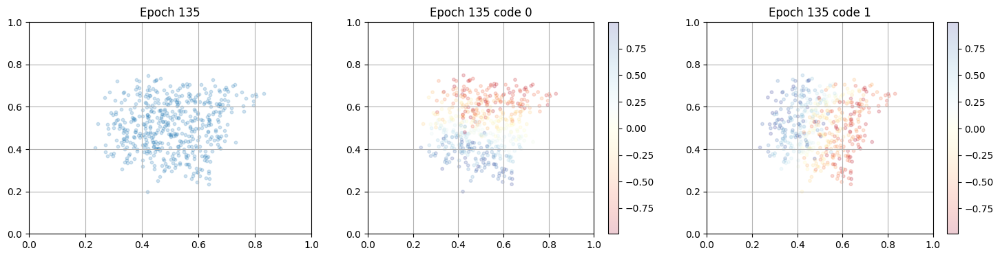

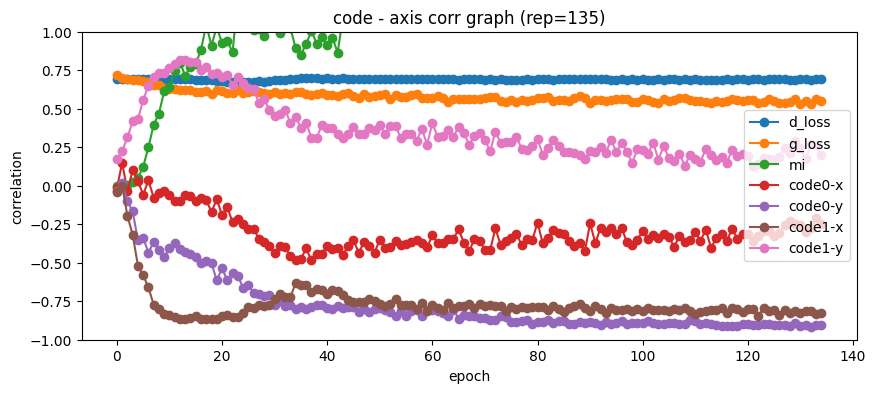

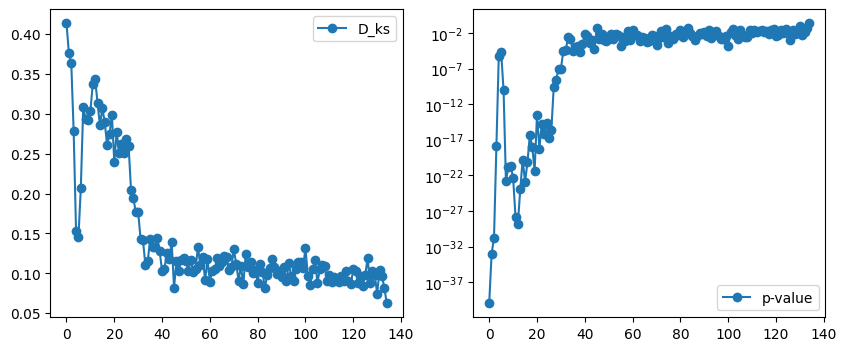

100%|██████████| 31/31 [00:09<00:00,  3.11it/s, G_loss=0.575, D_loss=0.688, MI=1.31]


epoch: 136, D_loss: 0.688082916121329, G_loss: 0.5753405084533076, MI = 1.3120935602534203
좌표값 평균 =  0.50310093 0.5176118
D_ks = 0.0956774193548387, p-value = 0.013961940216661202


100%|██████████| 31/31 [00:10<00:00,  3.04it/s, G_loss=0.545, D_loss=0.688, MI=1.46]


epoch: 137, D_loss: 0.6877325138738078, G_loss: 0.5449822035527998, MI = 1.4569359950480922
좌표값 평균 =  0.50154305 0.50906765
D_ks = 0.08524193548387096, p-value = 0.03928177549240063


100%|██████████| 31/31 [00:10<00:00,  3.04it/s, G_loss=0.542, D_loss=0.69, MI=1.44] 


epoch: 138, D_loss: 0.6897494850620147, G_loss: 0.5419127383539754, MI = 1.43606674286627
좌표값 평균 =  0.5040192 0.5042954
D_ks = 0.07883064516129029, p-value = 0.06934975062682612


100%|██████████| 31/31 [00:10<00:00,  3.04it/s, G_loss=0.538, D_loss=0.688, MI=1.5] 


epoch: 139, D_loss: 0.6878674799396146, G_loss: 0.538253080460333, MI = 1.5025087234473997
좌표값 평균 =  0.5149477 0.5201194
D_ks = 0.10817741935483874, p-value = 0.003523638412075939


100%|██████████| 31/31 [00:10<00:00,  3.07it/s, G_loss=0.547, D_loss=0.691, MI=1.42]


epoch: 140, D_loss: 0.6906425260728405, G_loss: 0.5471380256837414, MI = 1.4229819293945067
좌표값 평균 =  0.49537233 0.50335723
D_ks = 0.09066129032258066, p-value = 0.023327987813351228


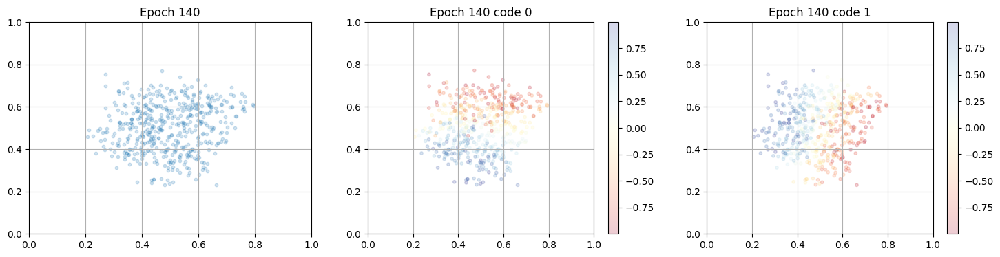

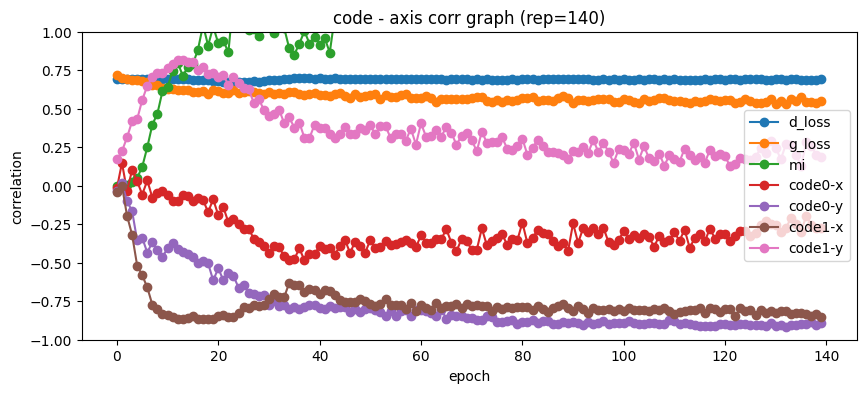

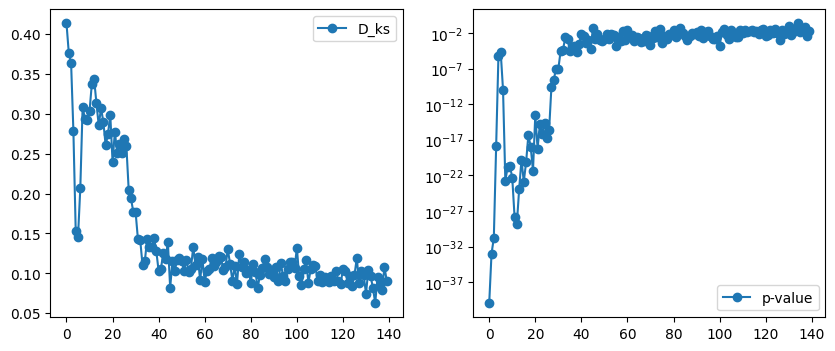

100%|██████████| 31/31 [00:10<00:00,  3.04it/s, G_loss=0.541, D_loss=0.691, MI=1.4] 


epoch: 141, D_loss: 0.6909998905274176, G_loss: 0.5408863108004293, MI = 1.4003307615076341
좌표값 평균 =  0.49540278 0.51088905
D_ks = 0.08137096774193547, p-value = 0.05558637260344631


100%|██████████| 31/31 [00:10<00:00,  3.03it/s, G_loss=0.569, D_loss=0.691, MI=1.44]


epoch: 142, D_loss: 0.6910869806043564, G_loss: 0.5685209439646813, MI = 1.4431141864868902
좌표값 평균 =  0.50907093 0.5033342
D_ks = 0.07986290322580647, p-value = 0.06290012268597336


100%|██████████| 31/31 [00:10<00:00,  2.94it/s, G_loss=0.543, D_loss=0.693, MI=1.66]


epoch: 143, D_loss: 0.692631596519101, G_loss: 0.5425109084575407, MI = 1.662305841522832
좌표값 평균 =  0.50550807 0.5042749
D_ks = 0.09191129032258064, p-value = 0.0206452731520829


100%|██████████| 31/31 [00:10<00:00,  2.96it/s, G_loss=0.544, D_loss=0.69, MI=1.46] 


epoch: 144, D_loss: 0.689752459526062, G_loss: 0.543983789220933, MI = 1.4559927198194689
좌표값 평균 =  0.5047024 0.52184564
D_ks = 0.09425806451612906, p-value = 0.01618091869592538


100%|██████████| 31/31 [00:10<00:00,  2.97it/s, G_loss=0.561, D_loss=0.691, MI=1.6] 


epoch: 145, D_loss: 0.6908433283528974, G_loss: 0.5613689730244298, MI = 1.5971905319921431
좌표값 평균 =  0.5055801 0.51181173
D_ks = 0.08328225806451611, p-value = 0.04678313559664643


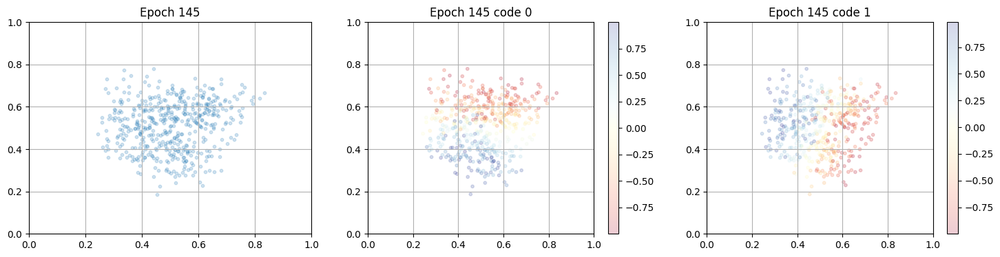

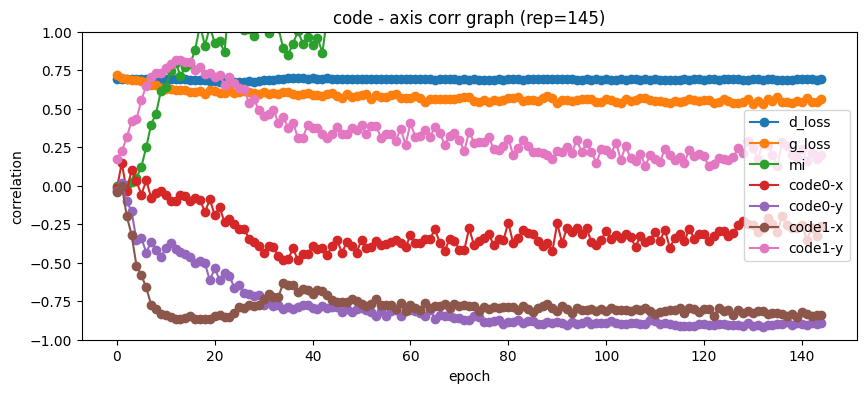

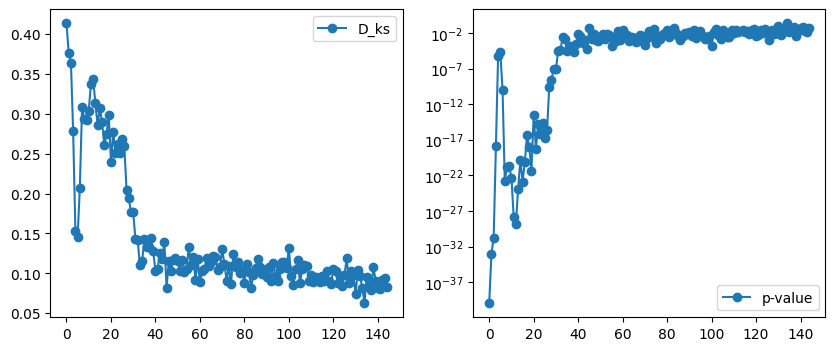

100%|██████████| 31/31 [00:10<00:00,  3.00it/s, G_loss=0.541, D_loss=0.689, MI=1.76]


epoch: 146, D_loss: 0.6891540404288999, G_loss: 0.5414866055211713, MI = 1.760760364993926
좌표값 평균 =  0.50547326 0.5076163
D_ks = 0.06944354838709679, p-value = 0.14689391386074954


100%|██████████| 31/31 [00:10<00:00,  3.00it/s, G_loss=0.536, D_loss=0.692, MI=1.28] 


epoch: 147, D_loss: 0.6918468840660588, G_loss: 0.5360813842665765, MI = 1.2845283814014927
좌표값 평균 =  0.49023998 0.5001517
D_ks = 0.11202419354838714, p-value = 0.0022324093523612785


100%|██████████| 31/31 [00:10<00:00,  3.01it/s, G_loss=0.542, D_loss=0.693, MI=1.42]


epoch: 148, D_loss: 0.6932192002573321, G_loss: 0.5420257977900966, MI = 1.4159111245985954
좌표값 평균 =  0.5018082 0.496532
D_ks = 0.09179032258064515, p-value = 0.02093704852458434


100%|██████████| 31/31 [00:10<00:00,  2.98it/s, G_loss=0.545, D_loss=0.688, MI=1.36]


epoch: 149, D_loss: 0.6880681630103819, G_loss: 0.5445285727900844, MI = 1.3609381967013883
좌표값 평균 =  0.49611422 0.5074853
D_ks = 0.09162903225806451, p-value = 0.021155419498396166


100%|██████████| 31/31 [00:10<00:00,  2.95it/s, G_loss=0.557, D_loss=0.69, MI=1.48] 


epoch: 150, D_loss: 0.6901084953738797, G_loss: 0.5566736257845356, MI = 1.4792433727172114
좌표값 평균 =  0.50544465 0.511564
D_ks = 0.09058870967741933, p-value = 0.023514745282140547


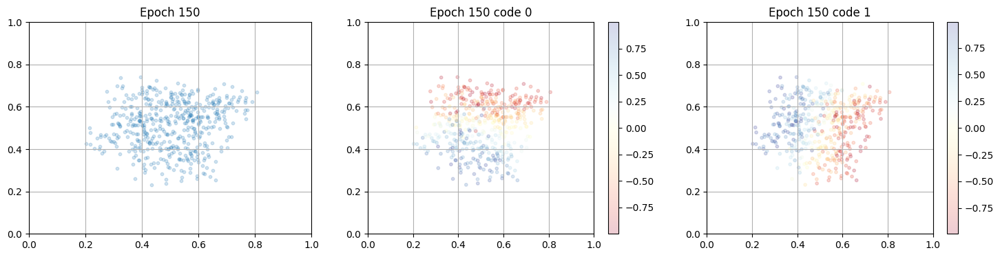

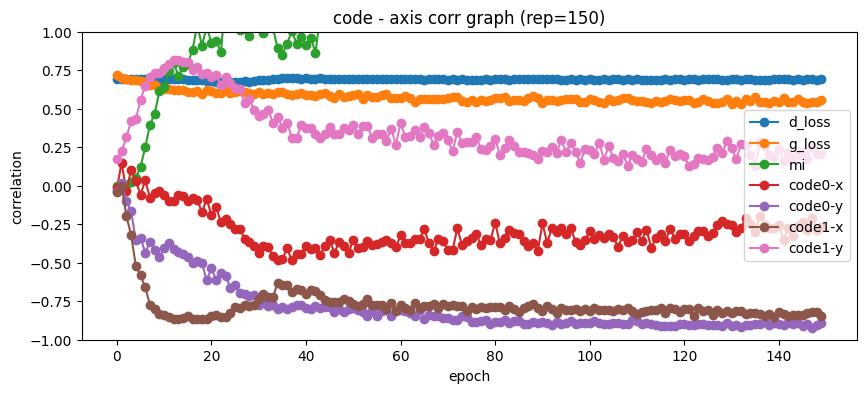

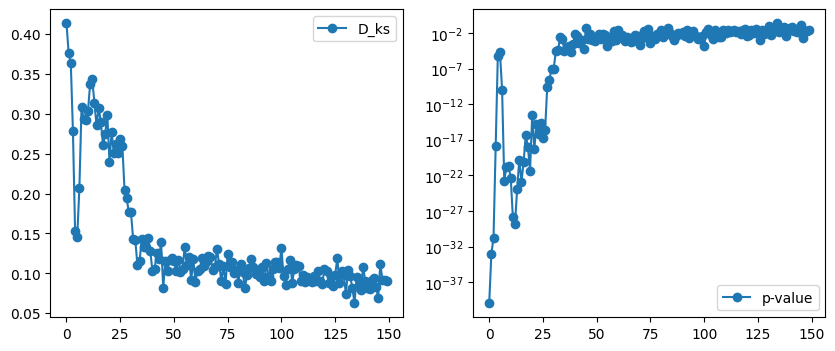

100%|██████████| 31/31 [00:10<00:00,  3.01it/s, G_loss=0.537, D_loss=0.691, MI=1.45]


epoch: 151, D_loss: 0.6911705924618629, G_loss: 0.5365018825377187, MI = 1.4519072069275765
좌표값 평균 =  0.5047549 0.4998347
D_ks = 0.08316129032258061, p-value = 0.04705485615872179


100%|██████████| 31/31 [00:10<00:00,  2.98it/s, G_loss=0.556, D_loss=0.688, MI=1.44]


epoch: 152, D_loss: 0.6877801995123586, G_loss: 0.5557636945478378, MI = 1.4393322717758916
좌표값 평균 =  0.5105384 0.49384072
D_ks = 0.10486290322580641, p-value = 0.005164805626395063


100%|██████████| 31/31 [00:10<00:00,  3.00it/s, G_loss=0.539, D_loss=0.689, MI=1.54]


epoch: 153, D_loss: 0.6891840273334134, G_loss: 0.5388670131083457, MI = 1.5410432411778359
좌표값 평균 =  0.50840026 0.50837266
D_ks = 0.0934193548387097, p-value = 0.017411889438529955


100%|██████████| 31/31 [00:10<00:00,  2.99it/s, G_loss=0.545, D_loss=0.689, MI=1.49]


epoch: 154, D_loss: 0.6890000143358784, G_loss: 0.5451053207920443, MI = 1.4927232246245108
좌표값 평균 =  0.5164822 0.51237965
D_ks = 0.08204032258064514, p-value = 0.05241815960783642


100%|██████████| 31/31 [00:10<00:00,  2.96it/s, G_loss=0.529, D_loss=0.689, MI=1.48]


epoch: 155, D_loss: 0.6891857674044948, G_loss: 0.5292108308884406, MI = 1.4778040685961324
좌표값 평균 =  0.49787903 0.50375766
D_ks = 0.08139516129032257, p-value = 0.055164644065945206


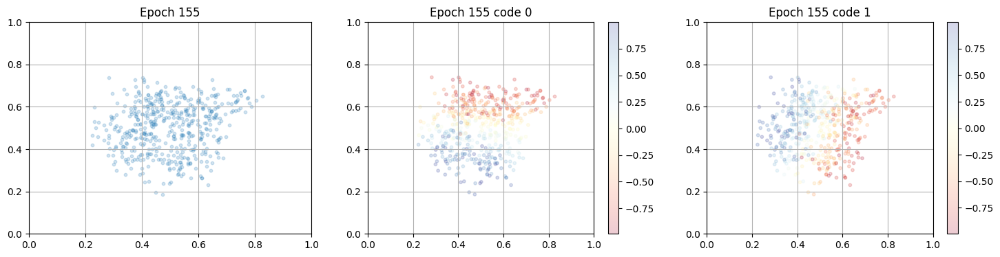

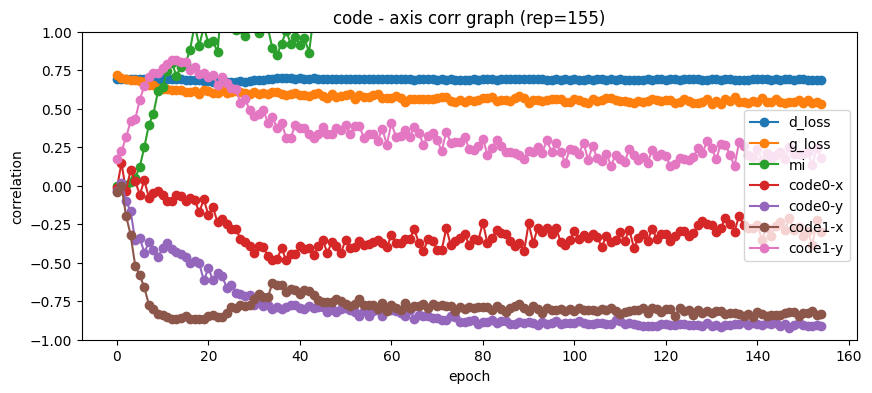

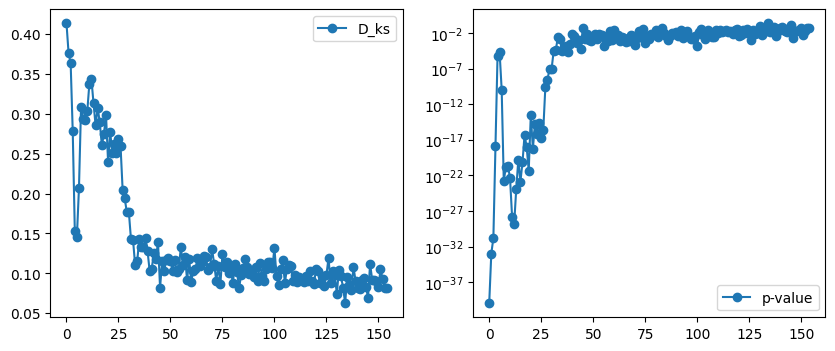

100%|██████████| 31/31 [00:10<00:00,  3.00it/s, G_loss=0.545, D_loss=0.691, MI=1.49]


epoch: 156, D_loss: 0.6908056985947394, G_loss: 0.5452362520079459, MI = 1.4879669297126032
좌표값 평균 =  0.5081925 0.4980133
D_ks = 0.08565322580645163, p-value = 0.037492813504800715


100%|██████████| 31/31 [00:10<00:00,  2.98it/s, G_loss=0.548, D_loss=0.69, MI=1.43] 


epoch: 157, D_loss: 0.6901166708238663, G_loss: 0.5483916786409193, MI = 1.4258661933483616
좌표값 평균 =  0.5009561 0.51119065
D_ks = 0.08991935483870978, p-value = 0.02513513452855034


100%|██████████| 31/31 [00:10<00:00,  3.00it/s, G_loss=0.555, D_loss=0.69, MI=1.57] 


epoch: 158, D_loss: 0.6900453221413397, G_loss: 0.5545961289636551, MI = 1.565055743340523
좌표값 평균 =  0.50167996 0.50627154
D_ks = 0.0820806451612903, p-value = 0.05225717560949279


100%|██████████| 31/31 [00:10<00:00,  3.00it/s, G_loss=0.524, D_loss=0.691, MI=1.61]


epoch: 159, D_loss: 0.6910684127961436, G_loss: 0.5236383628460669, MI = 1.605477096572999
좌표값 평균 =  0.5054238 0.5085796
D_ks = 0.07148387096774195, p-value = 0.12596254776953938


100%|██████████| 31/31 [00:10<00:00,  2.97it/s, G_loss=0.541, D_loss=0.691, MI=1.6] 


epoch: 160, D_loss: 0.691005197263533, G_loss: 0.5409366969139345, MI = 1.6014481802140512
좌표값 평균 =  0.5023271 0.49684727
D_ks = 0.09254032258064518, p-value = 0.019199643727759192


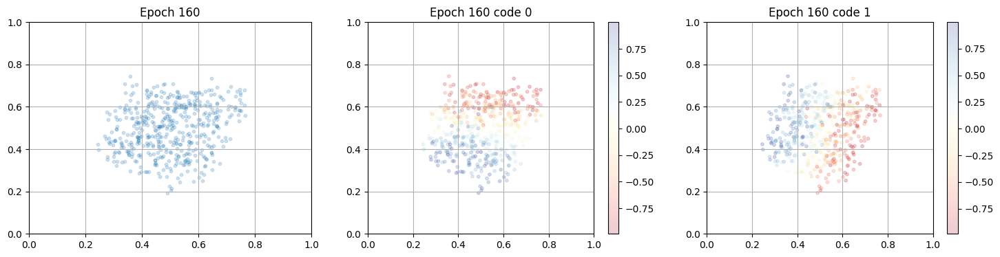

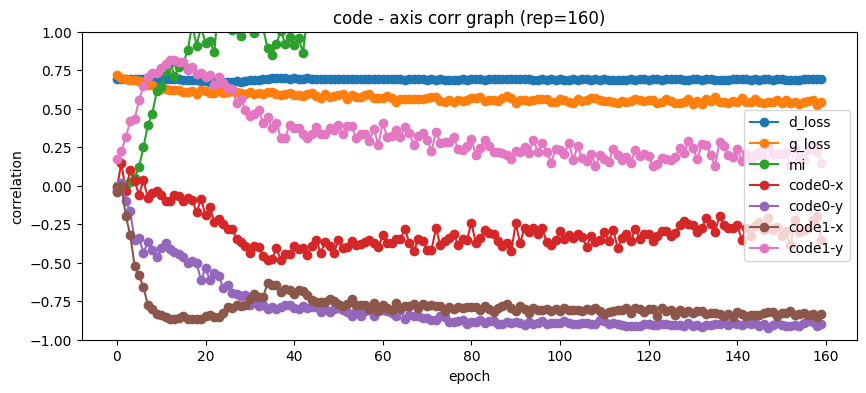

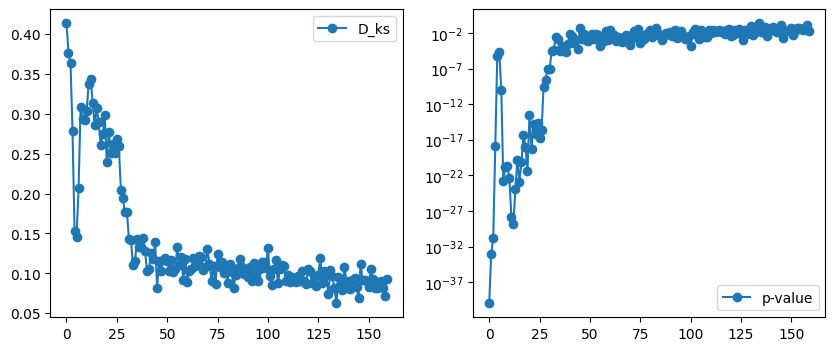

100%|██████████| 31/31 [00:10<00:00,  2.98it/s, G_loss=0.542, D_loss=0.691, MI=1.5] 


epoch: 161, D_loss: 0.6909619704369576, G_loss: 0.5420362574438895, MI = 1.5008505938514587
좌표값 평균 =  0.50686854 0.5068811
D_ks = 0.08036290322580641, p-value = 0.06045886978369145


100%|██████████| 31/31 [00:10<00:00,  2.99it/s, G_loss=0.549, D_loss=0.689, MI=1.46]


epoch: 162, D_loss: 0.6887885658971725, G_loss: 0.5486888318292557, MI = 1.4608777992187008
좌표값 평균 =  0.5123888 0.5121427
D_ks = 0.07769354838709672, p-value = 0.07614103975224248


100%|██████████| 31/31 [00:10<00:00,  2.99it/s, G_loss=0.517, D_loss=0.694, MI=1.65]


epoch: 163, D_loss: 0.6937669804019313, G_loss: 0.5167527208405156, MI = 1.6477498863973925
좌표값 평균 =  0.508559 0.5017224
D_ks = 0.08171774193548384, p-value = 0.05382424685194718


100%|██████████| 31/31 [00:10<00:00,  2.99it/s, G_loss=0.556, D_loss=0.69, MI=1.57] 


epoch: 164, D_loss: 0.6904457480676712, G_loss: 0.5562051765380367, MI = 1.5736799913067971
좌표값 평균 =  0.5065827 0.5025356
D_ks = 0.08383064516129032, p-value = 0.04437118247820228


100%|██████████| 31/31 [00:10<00:00,  2.99it/s, G_loss=0.561, D_loss=0.69, MI=1.53] 


epoch: 165, D_loss: 0.6899706509805494, G_loss: 0.561114247768156, MI = 1.5308766749597364
좌표값 평균 =  0.51166505 0.5018882
D_ks = 0.07942741935483871, p-value = 0.0655745556102832


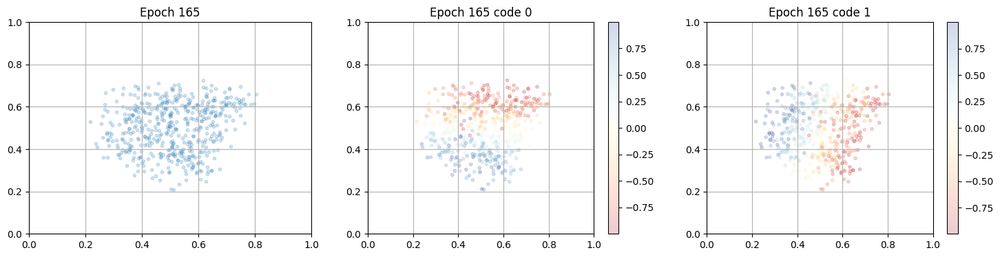

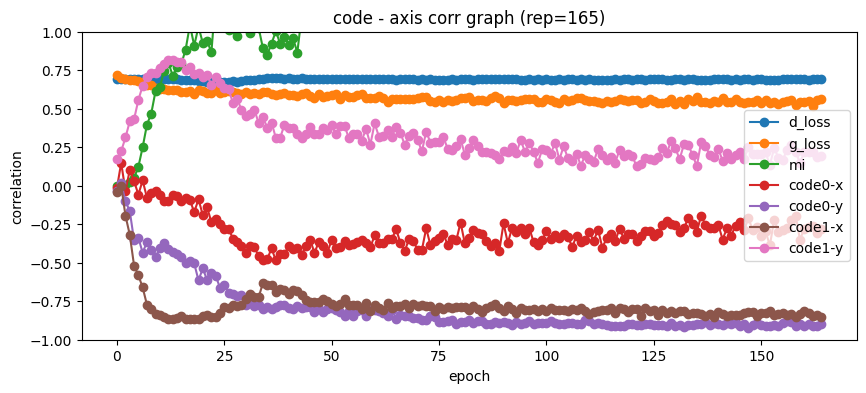

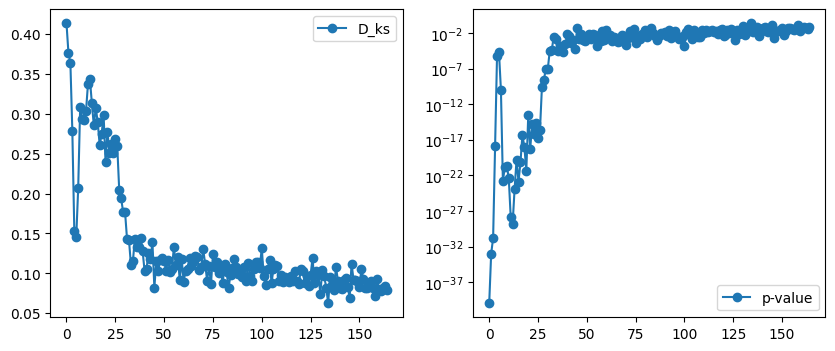

100%|██████████| 31/31 [00:10<00:00,  3.01it/s, G_loss=0.542, D_loss=0.69, MI=1.54] 


epoch: 166, D_loss: 0.6898811728723587, G_loss: 0.5415260753323955, MI = 1.5400869134933717
좌표값 평균 =  0.51390845 0.50064343
D_ks = 0.08057258064516129, p-value = 0.059424881596764276


100%|██████████| 31/31 [00:10<00:00,  2.98it/s, G_loss=0.576, D_loss=0.692, MI=1.2] 


epoch: 167, D_loss: 0.6917577232083967, G_loss: 0.5758164823055267, MI = 1.1952266039386872
좌표값 평균 =  0.50831527 0.5028773
D_ks = 0.09965322580645161, p-value = 0.00912131639928731


100%|██████████| 31/31 [00:10<00:00,  2.96it/s, G_loss=0.539, D_loss=0.69, MI=1.44] 


epoch: 168, D_loss: 0.6903980624291205, G_loss: 0.5387603448283288, MI = 1.4363489160614629
좌표값 평균 =  0.5098703 0.50700027
D_ks = 0.07433064516129029, p-value = 0.10039980539716763


100%|██████████| 31/31 [00:10<00:00,  3.01it/s, G_loss=0.543, D_loss=0.69, MI=1.47] 


epoch: 169, D_loss: 0.690030732462483, G_loss: 0.5428196374447115, MI = 1.4699199411176866
좌표값 평균 =  0.5023715 0.5002946
D_ks = 0.07766129032258065, p-value = 0.07652647024844643


100%|██████████| 31/31 [00:10<00:00,  2.95it/s, G_loss=0.546, D_loss=0.691, MI=1.49]


epoch: 170, D_loss: 0.6906981237473027, G_loss: 0.5463021407204289, MI = 1.4880874935657746
좌표값 평균 =  0.50624377 0.5088904
D_ks = 0.08250000000000002, p-value = 0.05007186794631877


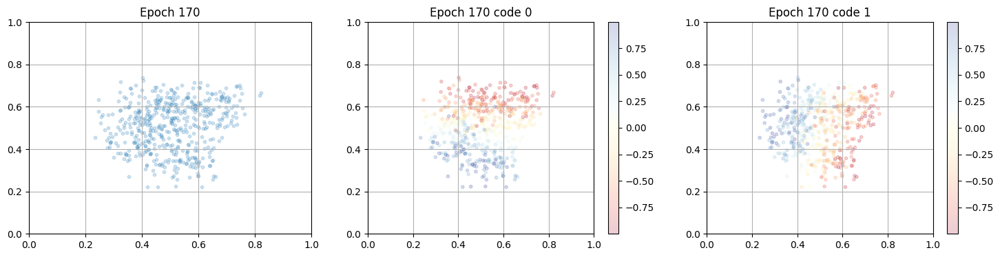

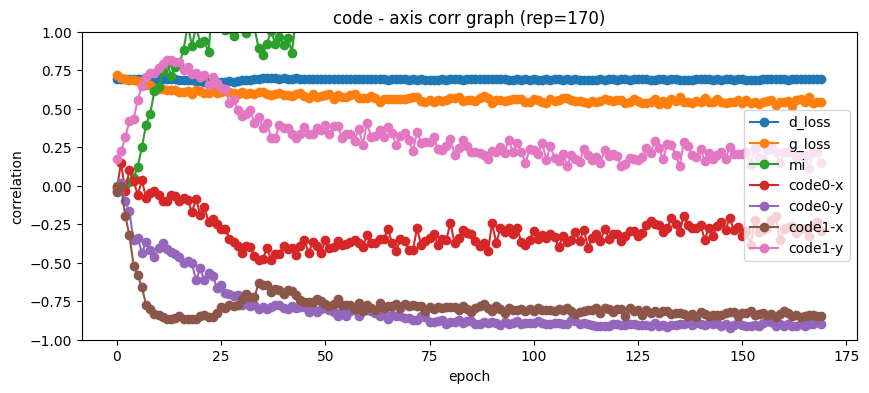

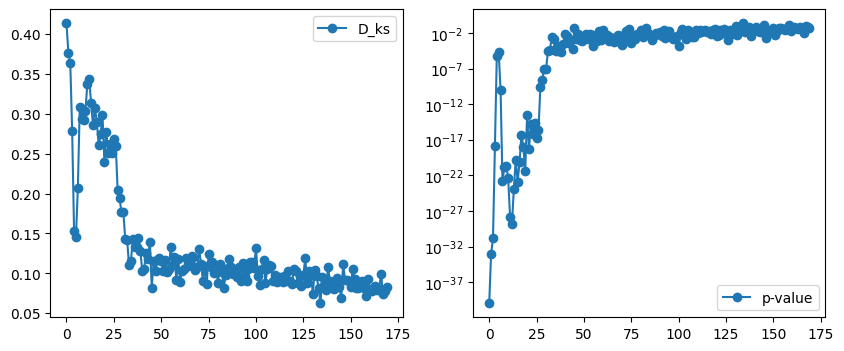

100%|██████████| 31/31 [00:10<00:00,  2.99it/s, G_loss=0.548, D_loss=0.692, MI=1.47]


epoch: 171, D_loss: 0.6924087885887392, G_loss: 0.5475164123119847, MI = 1.469102107709454
좌표값 평균 =  0.4901136 0.5000486
D_ks = 0.10097580645161289, p-value = 0.007971553276580676


100%|██████████| 31/31 [00:10<00:00,  3.00it/s, G_loss=0.554, D_loss=0.691, MI=1.55]


epoch: 172, D_loss: 0.6906150579452515, G_loss: 0.5544686403966719, MI = 1.5547456231809431
좌표값 평균 =  0.4970021 0.5017144
D_ks = 0.09712903225806455, p-value = 0.012120640633035125


100%|██████████| 31/31 [00:10<00:00,  2.99it/s, G_loss=0.532, D_loss=0.692, MI=1.65]


epoch: 173, D_loss: 0.6916638939611374, G_loss: 0.5320985980572239, MI = 1.649113065773441
좌표값 평균 =  0.50137764 0.5051574
D_ks = 0.08908064516129038, p-value = 0.0271469570818163


100%|██████████| 31/31 [00:10<00:00,  3.01it/s, G_loss=0.562, D_loss=0.691, MI=1.37]


epoch: 174, D_loss: 0.6910926276637662, G_loss: 0.5621624848534984, MI = 1.3700453946667333
좌표값 평균 =  0.5042401 0.50665665
D_ks = 0.08887903225806451, p-value = 0.027649576608412697


100%|██████████| 31/31 [00:10<00:00,  2.98it/s, G_loss=0.535, D_loss=0.692, MI=1.7] 


epoch: 175, D_loss: 0.6919777662523331, G_loss: 0.5347701734112155, MI = 1.6988163763476956
좌표값 평균 =  0.5062963 0.50957435
D_ks = 0.0882338709677419, p-value = 0.029638261625080674


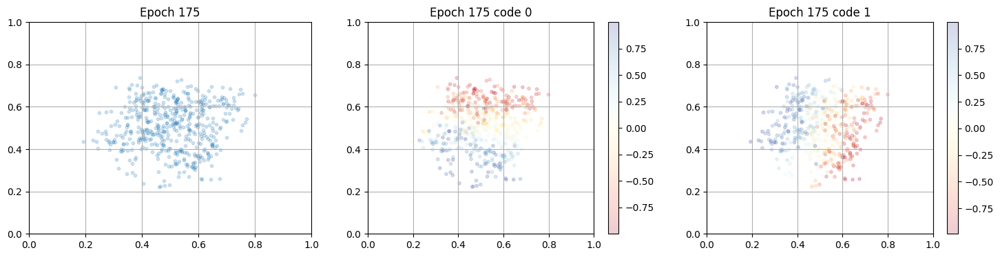

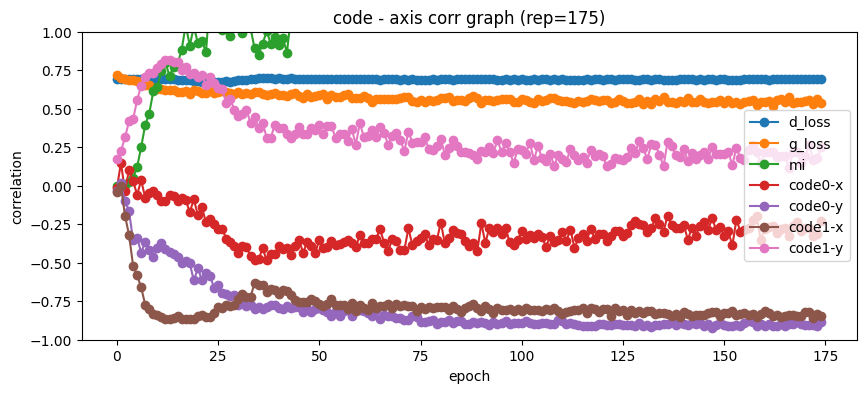

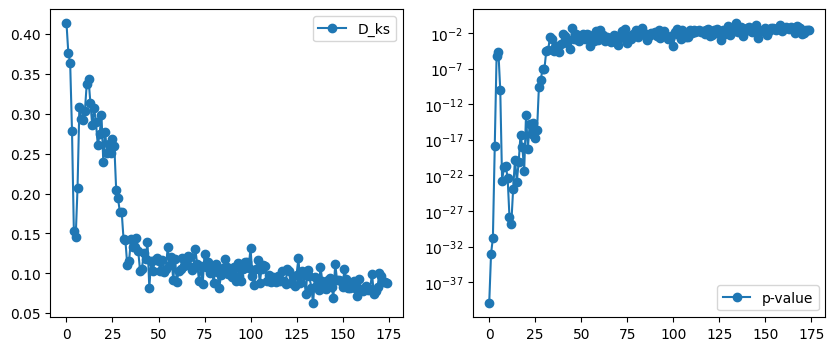

100%|██████████| 31/31 [00:10<00:00,  2.98it/s, G_loss=0.54, D_loss=0.691, MI=1.66] 


epoch: 176, D_loss: 0.691098282414098, G_loss: 0.5397661770543745, MI = 1.6592218260611258
좌표값 평균 =  0.5007002 0.50477374
D_ks = 0.09563709677419355, p-value = 0.014194987487733627


100%|██████████| 31/31 [00:10<00:00,  3.00it/s, G_loss=0.529, D_loss=0.69, MI=1.36] 


epoch: 177, D_loss: 0.6904881115882627, G_loss: 0.5289000666910603, MI = 1.363387978846027
좌표값 평균 =  0.51093024 0.49863034
D_ks = 0.07521774193548386, p-value = 0.09351064629938093


100%|██████████| 31/31 [00:10<00:00,  3.02it/s, G_loss=0.555, D_loss=0.691, MI=1.54]


epoch: 178, D_loss: 0.6905825061182822, G_loss: 0.5550344586372375, MI = 1.5445806537905047
좌표값 평균 =  0.5051969 0.50915253
D_ks = 0.07546774193548386, p-value = 0.09161713802212078


100%|██████████| 31/31 [00:10<00:00,  2.99it/s, G_loss=0.539, D_loss=0.692, MI=1.48]


epoch: 179, D_loss: 0.6917017621378745, G_loss: 0.5389677497648424, MI = 1.4799630757301085
좌표값 평균 =  0.5028532 0.50162476
D_ks = 0.07603225806451616, p-value = 0.08748411543673036


100%|██████████| 31/31 [00:10<00:00,  3.00it/s, G_loss=0.525, D_loss=0.69, MI=1.42] 


epoch: 180, D_loss: 0.6896323561668396, G_loss: 0.5247132864690596, MI = 1.42210048340982
좌표값 평균 =  0.5009982 0.5041433
D_ks = 0.08477419354838711, p-value = 0.04078907284349032


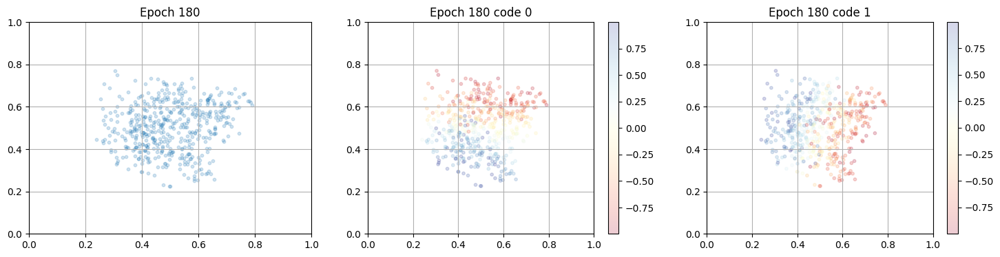

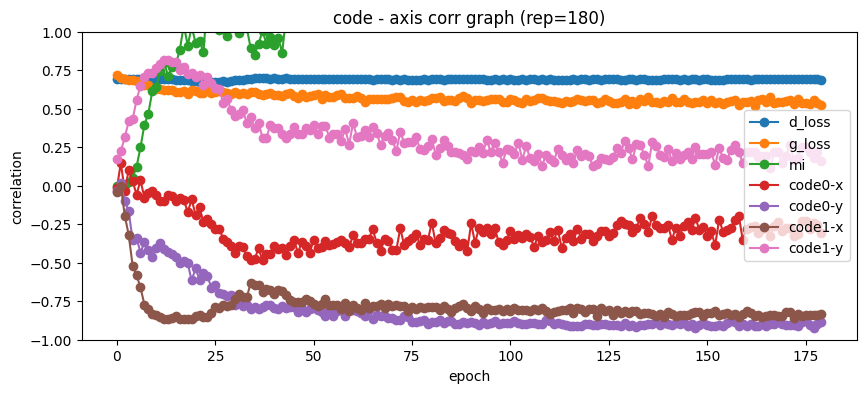

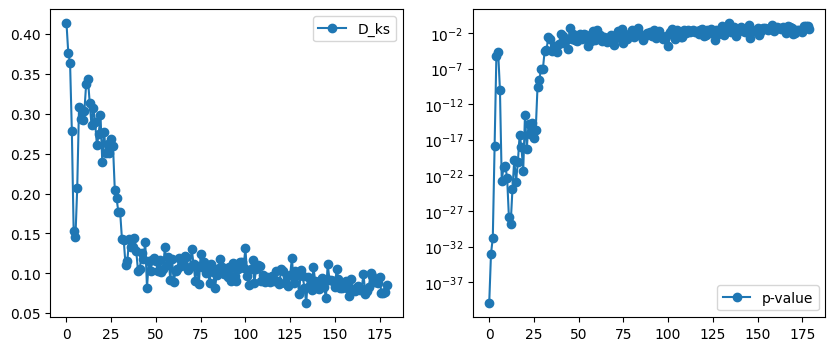

100%|██████████| 31/31 [00:10<00:00,  2.98it/s, G_loss=0.558, D_loss=0.693, MI=1.43]


epoch: 181, D_loss: 0.6928691191058005, G_loss: 0.5579871900619999, MI = 1.4317429113772608
좌표값 평균 =  0.5016627 0.50600845
D_ks = 0.08353225806451611, p-value = 0.04545683408318544


100%|██████████| 31/31 [00:10<00:00,  2.98it/s, G_loss=0.533, D_loss=0.69, MI=1.54] 


epoch: 182, D_loss: 0.6903157599510685, G_loss: 0.5328643571945929, MI = 1.5390324501260635
좌표값 평균 =  0.50362337 0.500649
D_ks = 0.09784677419354845, p-value = 0.011160532154289029


100%|██████████| 31/31 [00:10<00:00,  3.07it/s, G_loss=0.529, D_loss=0.692, MI=1.68]


epoch: 183, D_loss: 0.6923585207231583, G_loss: 0.5285148649446426, MI = 1.6846279444233063
좌표값 평균 =  0.4986259 0.4982479
D_ks = 0.09396774193548388, p-value = 0.016849025188773317


100%|██████████| 31/31 [00:10<00:00,  2.99it/s, G_loss=0.538, D_loss=0.691, MI=1.62]


epoch: 184, D_loss: 0.6914685714629388, G_loss: 0.5375721243120009, MI = 1.6248821866127752
좌표값 평균 =  0.5007998 0.5112094
D_ks = 0.08774193548387085, p-value = 0.03086512019606397


100%|██████████| 31/31 [00:10<00:00,  3.02it/s, G_loss=0.545, D_loss=0.688, MI=1.48]


epoch: 185, D_loss: 0.6879520050940975, G_loss: 0.5445495978478463, MI = 1.4822215101411265
좌표값 평균 =  0.49484062 0.50331676
D_ks = 0.09554032258064518, p-value = 0.014210544149547892


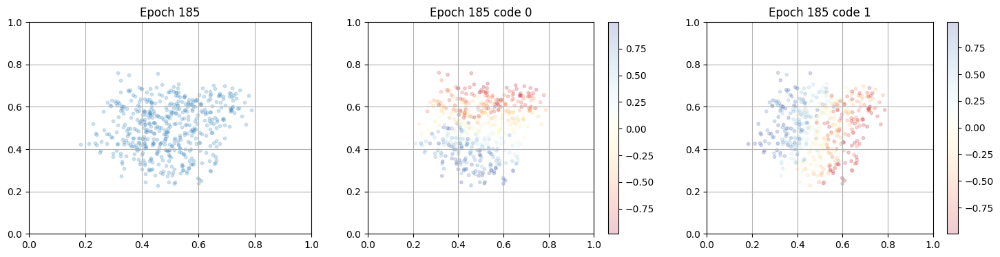

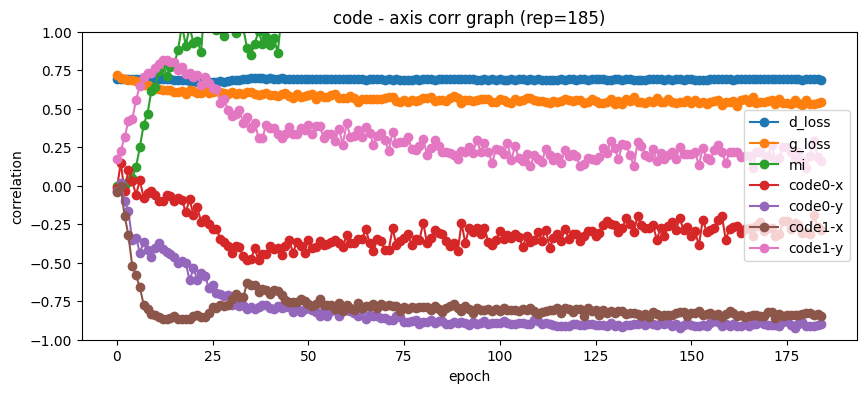

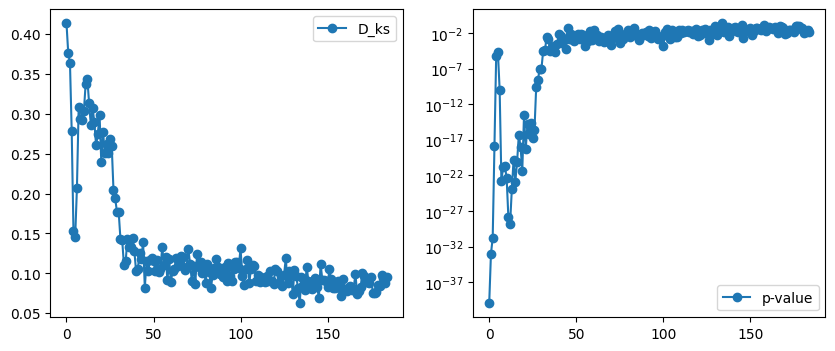

100%|██████████| 31/31 [00:10<00:00,  3.01it/s, G_loss=0.558, D_loss=0.694, MI=1.55]


epoch: 186, D_loss: 0.6936487997731855, G_loss: 0.5577762328809307, MI = 1.5502077264170493
좌표값 평균 =  0.5039365 0.50451434
D_ks = 0.09082258064516127, p-value = 0.02299606994952314


100%|██████████| 31/31 [00:10<00:00,  2.98it/s, G_loss=0.566, D_loss=0.692, MI=1.34]


epoch: 187, D_loss: 0.6922710038000538, G_loss: 0.5658264698520783, MI = 1.3372560864494694
좌표값 평균 =  0.50168914 0.51586884
D_ks = 0.09833870967741931, p-value = 0.010579230016037512


100%|██████████| 31/31 [00:10<00:00,  3.01it/s, G_loss=0.535, D_loss=0.689, MI=1.58]


epoch: 188, D_loss: 0.6886113785928295, G_loss: 0.535218442639997, MI = 1.5829327673681322
좌표값 평균 =  0.49762905 0.5103744
D_ks = 0.10044354838709678, p-value = 0.00848132773937274


100%|██████████| 31/31 [00:10<00:00,  2.99it/s, G_loss=0.559, D_loss=0.692, MI=1.27]


epoch: 189, D_loss: 0.6915466035566022, G_loss: 0.5586413587293317, MI = 1.2712348098716428
좌표값 평균 =  0.51190495 0.5037244
D_ks = 0.07966935483870966, p-value = 0.06439974259267758


100%|██████████| 31/31 [00:10<00:00,  2.99it/s, G_loss=0.52, D_loss=0.691, MI=1.53] 


epoch: 190, D_loss: 0.6913845577547627, G_loss: 0.5199550669039449, MI = 1.5328728114404986
좌표값 평균 =  0.49366158 0.5042473
D_ks = 0.09766935483870975, p-value = 0.011403989444786596


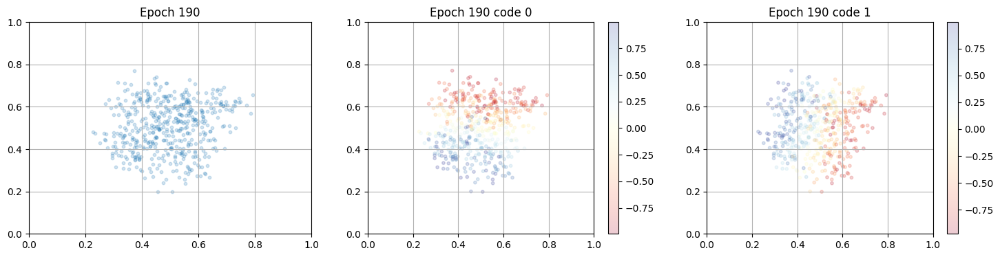

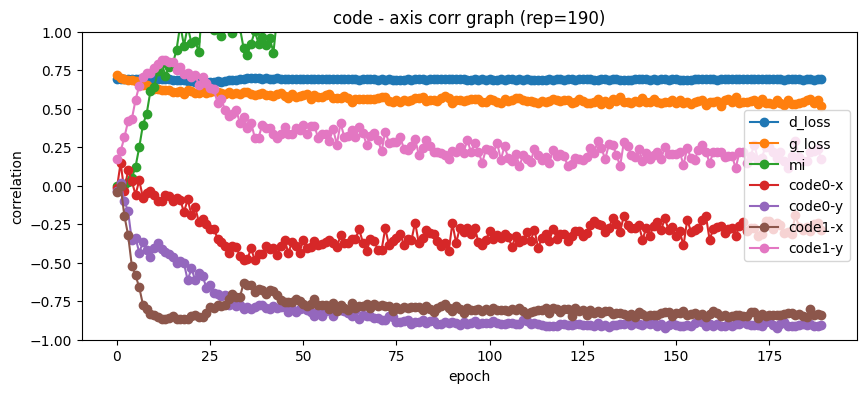

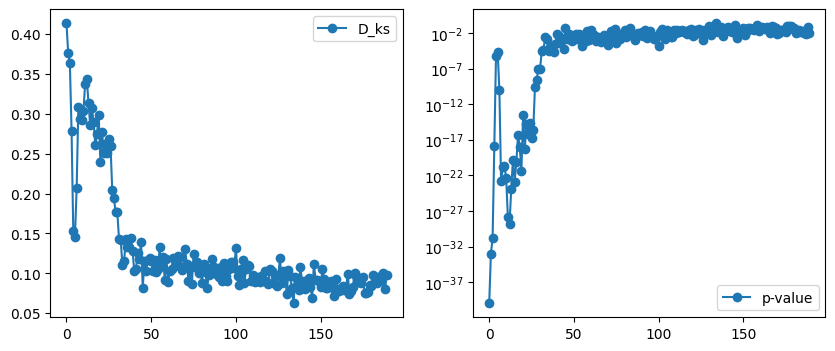

100%|██████████| 31/31 [00:10<00:00,  2.99it/s, G_loss=0.556, D_loss=0.689, MI=1.44]


epoch: 191, D_loss: 0.6890559946337054, G_loss: 0.5564929121924985, MI = 1.4418197303049025
좌표값 평균 =  0.508278 0.5073827
D_ks = 0.07566129032258065, p-value = 0.09029778276593109


100%|██████████| 31/31 [00:10<00:00,  2.96it/s, G_loss=0.556, D_loss=0.691, MI=1.47]


epoch: 192, D_loss: 0.6911808329243814, G_loss: 0.5558727258636106, MI = 1.467416089388632
좌표값 평균 =  0.50792843 0.5079093
D_ks = 0.07138709677419358, p-value = 0.12678547181690586


100%|██████████| 31/31 [00:10<00:00,  3.01it/s, G_loss=0.537, D_loss=0.689, MI=1.59]


epoch: 193, D_loss: 0.6893088394595731, G_loss: 0.5368579318446498, MI = 1.5890167720856205
좌표값 평균 =  0.5005888 0.494933
D_ks = 0.10312903225806455, p-value = 0.006315999955628671


100%|██████████| 31/31 [00:10<00:00,  3.01it/s, G_loss=0.554, D_loss=0.689, MI=1.61]


epoch: 194, D_loss: 0.6892614403078633, G_loss: 0.5543240164556811, MI = 1.6083551568369712
좌표값 평균 =  0.5067821 0.50519836
D_ks = 0.07199193548387098, p-value = 0.12102974869135248


100%|██████████| 31/31 [00:10<00:00,  3.02it/s, G_loss=0.549, D_loss=0.69, MI=1.51] 


epoch: 195, D_loss: 0.6902756075705251, G_loss: 0.5487623531972209, MI = 1.5120492846735063
좌표값 평균 =  0.506977 0.50166756
D_ks = 0.07677419354838713, p-value = 0.08192217765777833


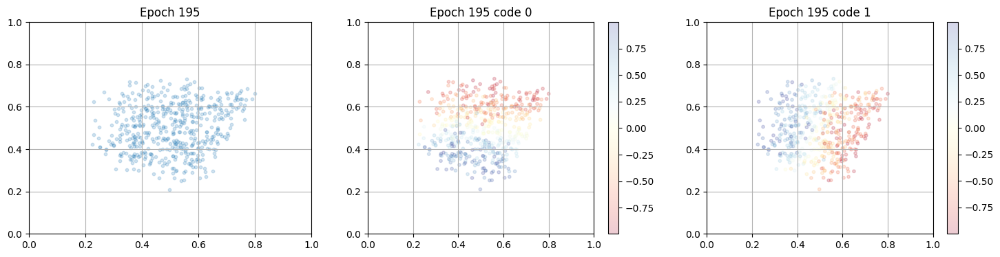

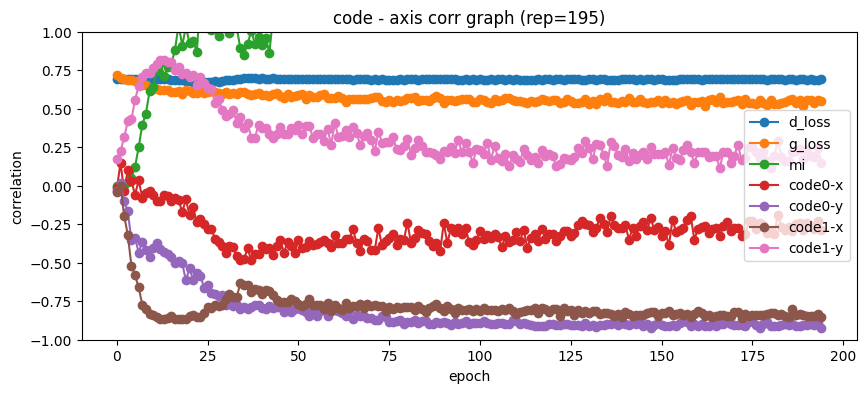

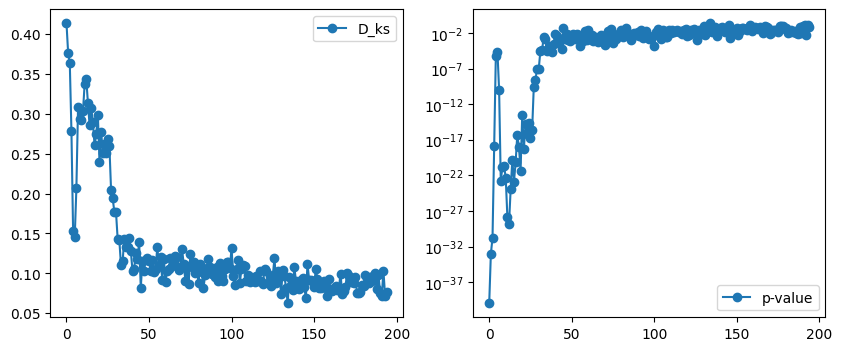

100%|██████████| 31/31 [00:10<00:00,  3.00it/s, G_loss=0.563, D_loss=0.691, MI=1.49]


epoch: 196, D_loss: 0.6906213625784843, G_loss: 0.5634260264135176, MI = 1.4866773659183132
좌표값 평균 =  0.5002707 0.5089241
D_ks = 0.0744274193548387, p-value = 0.09977616553828408


100%|██████████| 31/31 [00:10<00:00,  3.02it/s, G_loss=0.559, D_loss=0.689, MI=1.29]


epoch: 197, D_loss: 0.6891035129947047, G_loss: 0.5591610795067202, MI = 1.292536609836163
좌표값 평균 =  0.49913108 0.51727873
D_ks = 0.09374193548387097, p-value = 0.017158201148100082


100%|██████████| 31/31 [00:10<00:00,  3.00it/s, G_loss=0.522, D_loss=0.69, MI=1.36] 


epoch: 198, D_loss: 0.6901878080060405, G_loss: 0.5216365629626859, MI = 1.3561280095769512
좌표값 평균 =  0.5022503 0.5079386
D_ks = 0.08686290322580646, p-value = 0.03335026446712936


100%|██████████| 31/31 [00:10<00:00,  3.06it/s, G_loss=0.524, D_loss=0.691, MI=1.76]


epoch: 199, D_loss: 0.6907761270000089, G_loss: 0.524113864667954, MI = 1.7615792828221475
좌표값 평균 =  0.49656743 0.49858758
D_ks = 0.09636290322580651, p-value = 0.013112193895345188


100%|██████████| 31/31 [00:10<00:00,  3.03it/s, G_loss=0.549, D_loss=0.691, MI=1.78]


epoch: 200, D_loss: 0.6912957103021683, G_loss: 0.5489320976118888, MI = 1.7787345224811184
좌표값 평균 =  0.50458133 0.5118454
D_ks = 0.0918870967741936, p-value = 0.020582276129102586


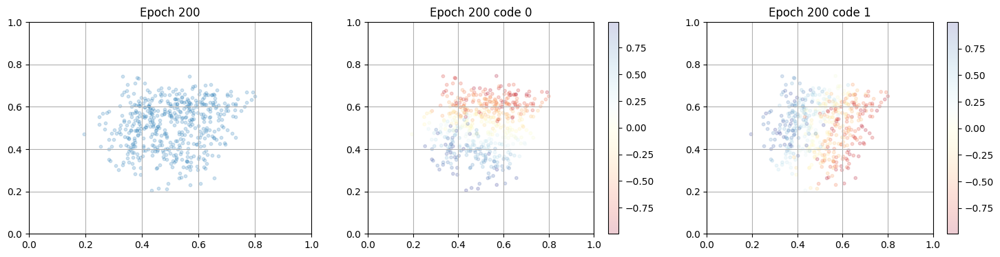

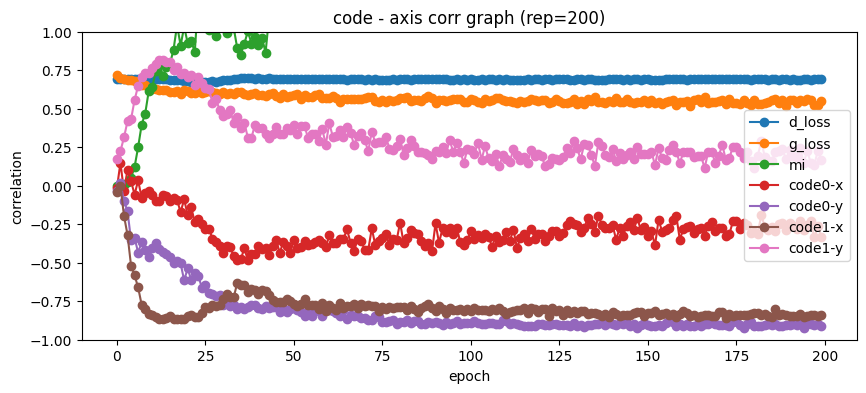

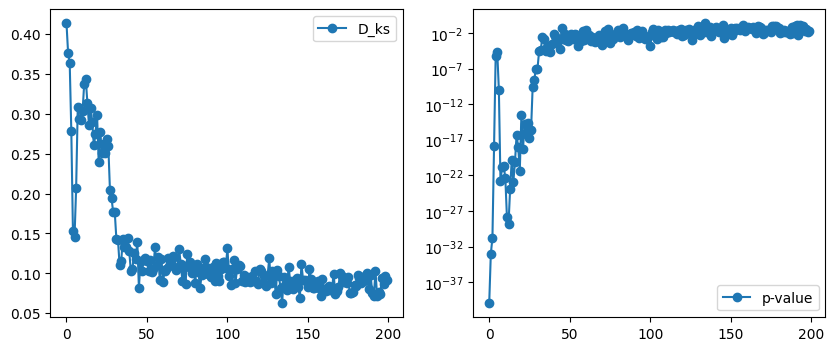

100%|██████████| 31/31 [00:10<00:00,  3.03it/s, G_loss=0.557, D_loss=0.692, MI=1.54]


epoch: 201, D_loss: 0.6915186201372454, G_loss: 0.5572219164140763, MI = 1.542925985590104
좌표값 평균 =  0.50229424 0.5019461
D_ks = 0.09405645161290324, p-value = 0.016593823495906733


100%|██████████| 31/31 [00:10<00:00,  3.00it/s, G_loss=0.543, D_loss=0.691, MI=1.59]


epoch: 202, D_loss: 0.6906723726180292, G_loss: 0.5426971508610633, MI = 1.5878798173319908
좌표값 평균 =  0.4891474 0.50309145
D_ks = 0.09866129032258067, p-value = 0.010242030459796922


100%|██████████| 31/31 [00:10<00:00,  3.01it/s, G_loss=0.548, D_loss=0.69, MI=1.65] 


epoch: 203, D_loss: 0.6895582945116104, G_loss: 0.5480725928660362, MI = 1.6468647093542161
좌표값 평균 =  0.49550024 0.501736
D_ks = 0.11564516129032262, p-value = 0.0014316169151088471


100%|██████████| 31/31 [00:10<00:00,  3.03it/s, G_loss=0.531, D_loss=0.692, MI=1.69]


epoch: 204, D_loss: 0.6919185788400711, G_loss: 0.5312826181611707, MI = 1.687960615081172
좌표값 평균 =  0.5019566 0.5016164
D_ks = 0.07206451612903228, p-value = 0.12032410139006318


100%|██████████| 31/31 [00:10<00:00,  2.87it/s, G_loss=0.541, D_loss=0.691, MI=1.54]


epoch: 205, D_loss: 0.6914997581512697, G_loss: 0.5407468503521334, MI = 1.5382411662609345
좌표값 평균 =  0.51062375 0.50566626
D_ks = 0.07674999999999996, p-value = 0.08234723459732463


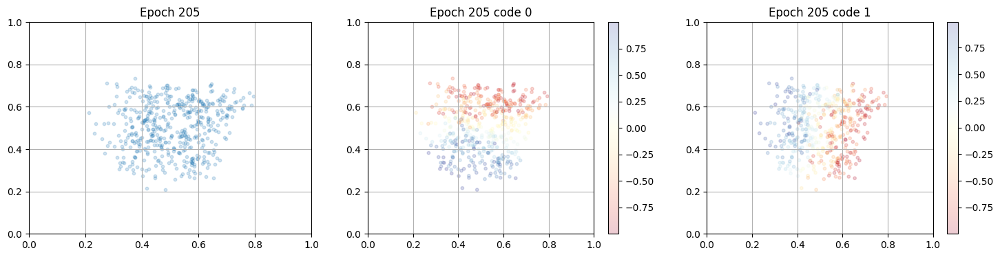

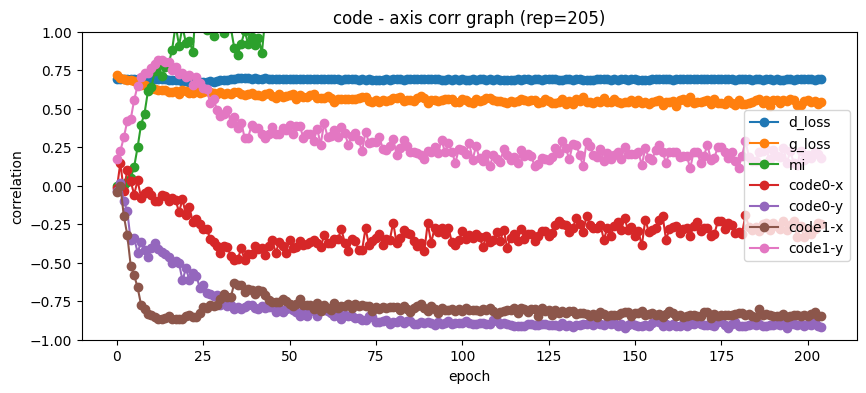

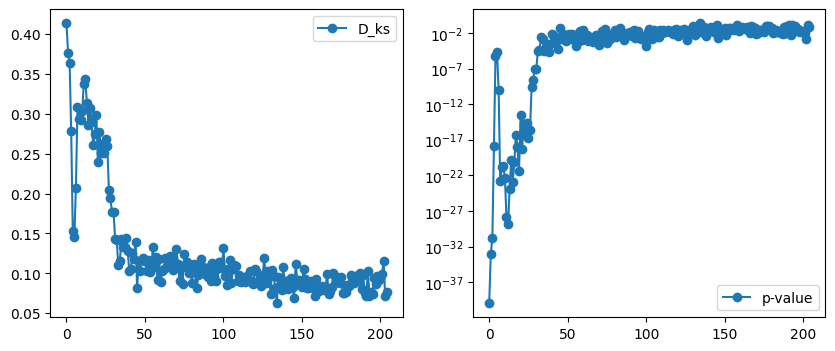

100%|██████████| 31/31 [00:10<00:00,  2.88it/s, G_loss=0.55, D_loss=0.692, MI=1.46] 


epoch: 206, D_loss: 0.6921504582128217, G_loss: 0.5504999026175468, MI = 1.458659432588085
좌표값 평균 =  0.49810177 0.50401765
D_ks = 0.07855645161290317, p-value = 0.07106067341828913


100%|██████████| 31/31 [00:10<00:00,  2.88it/s, G_loss=0.561, D_loss=0.692, MI=1.44]


epoch: 207, D_loss: 0.692149660279674, G_loss: 0.5610903713010973, MI = 1.4356534634867022
좌표값 평균 =  0.5084409 0.5023093
D_ks = 0.09265322580645158, p-value = 0.019109950994780325


100%|██████████| 31/31 [00:10<00:00,  2.85it/s, G_loss=0.54, D_loss=0.69, MI=1.41]  


epoch: 208, D_loss: 0.6897304404166437, G_loss: 0.5401583881147446, MI = 1.4090882943522545
좌표값 평균 =  0.5001213 0.51434284
D_ks = 0.09730645161290322, p-value = 0.011874846140427739


100%|██████████| 31/31 [00:10<00:00,  2.88it/s, G_loss=0.54, D_loss=0.692, MI=1.42] 


epoch: 209, D_loss: 0.6923670826419708, G_loss: 0.539741531495125, MI = 1.4241064190864563
좌표값 평균 =  0.50445217 0.5057308
D_ks = 0.08988709677419351, p-value = 0.02521603979494881


100%|██████████| 31/31 [00:10<00:00,  2.87it/s, G_loss=0.51, D_loss=0.691, MI=1.7]  


epoch: 210, D_loss: 0.6908335262729276, G_loss: 0.5096725984927146, MI = 1.7023104871473005
좌표값 평균 =  0.4982364 0.5092709
D_ks = 0.08160483870967743, p-value = 0.054291829539330275


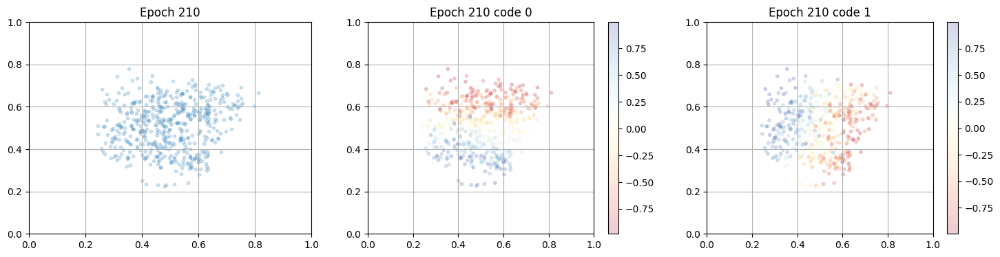

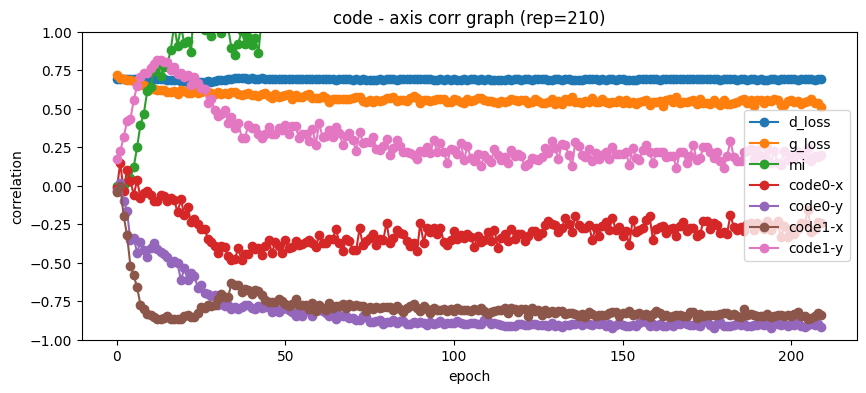

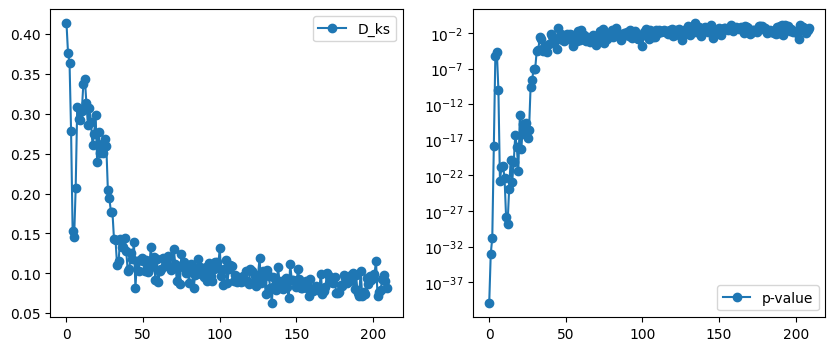

100%|██████████| 31/31 [00:10<00:00,  2.87it/s, G_loss=0.552, D_loss=0.69, MI=1.4]  


epoch: 211, D_loss: 0.6901490899824327, G_loss: 0.5519421148684717, MI = 1.4024753426351855
좌표값 평균 =  0.50507694 0.5027199
D_ks = 0.08042741935483869, p-value = 0.06025855753155572


100%|██████████| 31/31 [00:10<00:00,  2.89it/s, G_loss=0.555, D_loss=0.691, MI=1.38]


epoch: 212, D_loss: 0.6911058118266444, G_loss: 0.5553657422142644, MI = 1.377653641085471
좌표값 평균 =  0.49831253 0.5069899
D_ks = 0.09401612903225806, p-value = 0.01669602760626112


100%|██████████| 31/31 [00:10<00:00,  2.91it/s, G_loss=0.545, D_loss=0.692, MI=1.57]


epoch: 213, D_loss: 0.6917728204880992, G_loss: 0.5450364053249359, MI = 1.5724502609622093
좌표값 평균 =  0.50294566 0.506422
D_ks = 0.0858709677419355, p-value = 0.036808468312688844


100%|██████████| 31/31 [00:10<00:00,  2.90it/s, G_loss=0.53, D_loss=0.692, MI=1.53] 


epoch: 214, D_loss: 0.6918966962445167, G_loss: 0.5301472775397762, MI = 1.5278823087292333
좌표값 평균 =  0.49342653 0.4992548
D_ks = 0.11598387096774196, p-value = 0.0013778013380510638


100%|██████████| 31/31 [00:10<00:00,  2.87it/s, G_loss=0.543, D_loss=0.693, MI=1.49]


epoch: 215, D_loss: 0.6929727965785611, G_loss: 0.5425611445980687, MI = 1.48654144617819
좌표값 평균 =  0.4946401 0.49654898
D_ks = 0.12079032258064518, p-value = 0.0007455901263714454


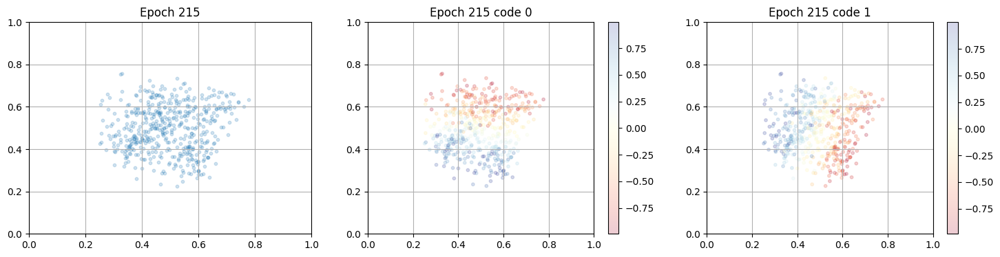

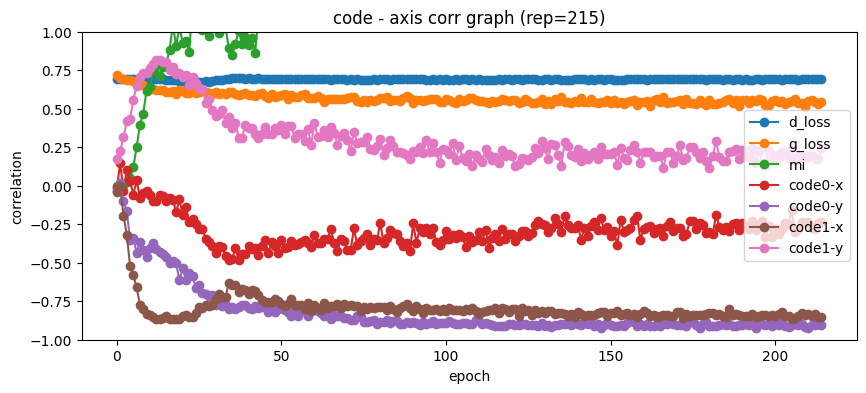

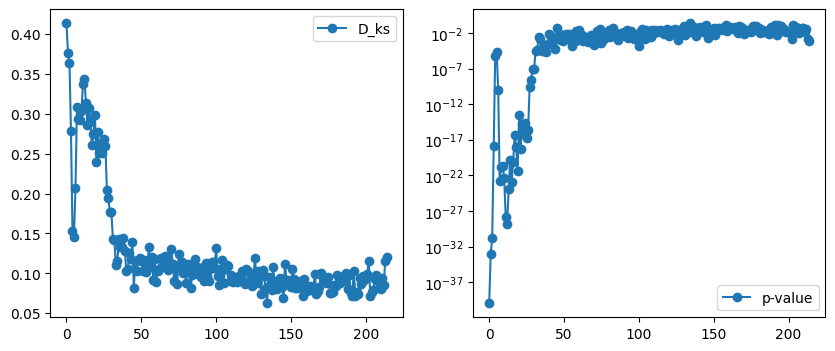

100%|██████████| 31/31 [00:10<00:00,  2.86it/s, G_loss=0.524, D_loss=0.692, MI=1.56]


epoch: 216, D_loss: 0.6924505772129181, G_loss: 0.5235770479325326, MI = 1.5624358452135516
좌표값 평균 =  0.5095857 0.5051547
D_ks = 0.07025, p-value = 0.13846369070791228


100%|██████████| 31/31 [00:10<00:00,  2.90it/s, G_loss=0.547, D_loss=0.691, MI=1.33]


epoch: 217, D_loss: 0.6909248598160282, G_loss: 0.5470342174653084, MI = 1.3263750431999084
좌표값 평균 =  0.5025539 0.5054878
D_ks = 0.07947580645161292, p-value = 0.06563463235006681


100%|██████████| 31/31 [00:10<00:00,  2.89it/s, G_loss=0.546, D_loss=0.691, MI=1.46]


epoch: 218, D_loss: 0.6913283986430014, G_loss: 0.5460102558135986, MI = 1.4626666254574252
좌표값 평균 =  0.49869138 0.50749516
D_ks = 0.08522580645161293, p-value = 0.03922201254630331


100%|██████████| 31/31 [00:10<00:00,  2.88it/s, G_loss=0.538, D_loss=0.692, MI=1.47]


epoch: 219, D_loss: 0.6916926945409467, G_loss: 0.5375232225464236, MI = 1.4661912081703063
좌표값 평균 =  0.51237273 0.50809264
D_ks = 0.08533870967741933, p-value = 0.038601171284544225


100%|██████████| 31/31 [00:10<00:00,  2.88it/s, G_loss=0.537, D_loss=0.69, MI=1.59] 


epoch: 220, D_loss: 0.6901850911878771, G_loss: 0.5371200067381705, MI = 1.590336625614474
좌표값 평균 =  0.5137871 0.5061
D_ks = 0.08491129032258066, p-value = 0.04042028132650051


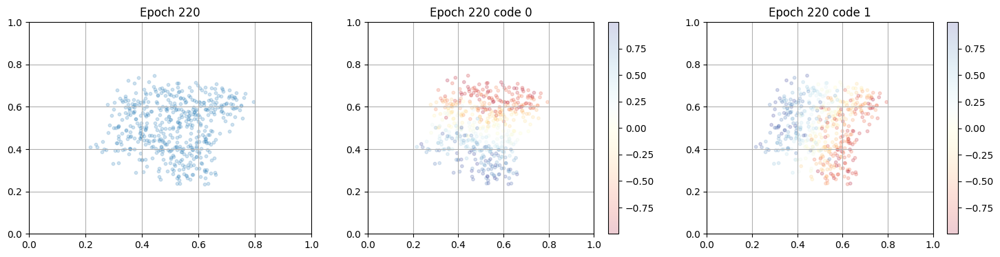

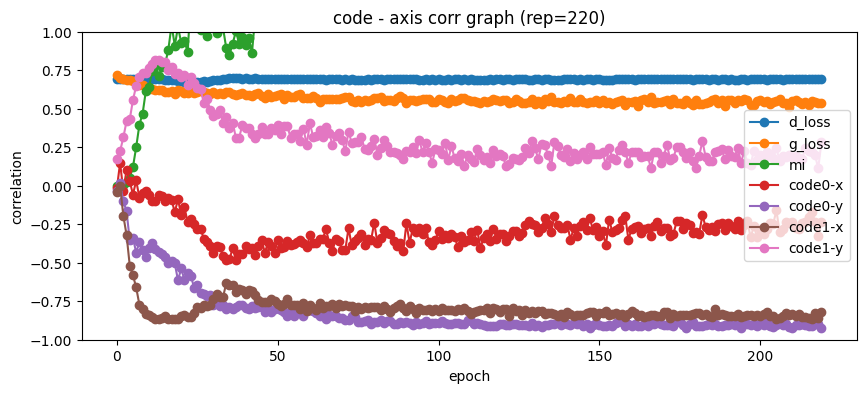

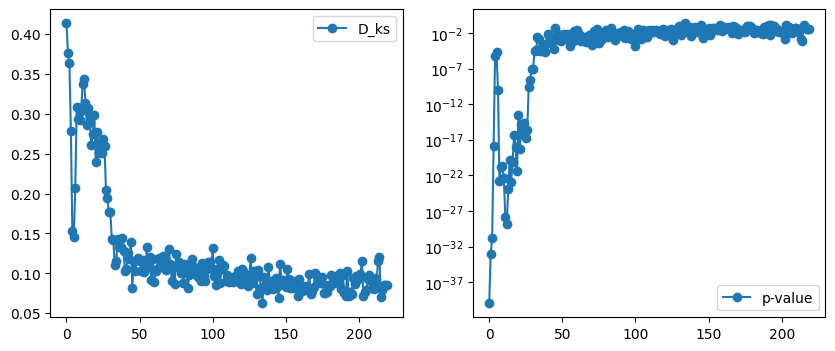

100%|██████████| 31/31 [00:10<00:00,  2.87it/s, G_loss=0.541, D_loss=0.691, MI=1.21]


epoch: 221, D_loss: 0.6908254027366638, G_loss: 0.5408644878095196, MI = 1.2140606026495657
좌표값 평균 =  0.50553924 0.5066035
D_ks = 0.06369354838709682, p-value = 0.22202789219310398


100%|██████████| 31/31 [00:10<00:00,  2.86it/s, G_loss=0.526, D_loss=0.691, MI=1.77]


epoch: 222, D_loss: 0.6914228739277009, G_loss: 0.525869881914508, MI = 1.7700160126532278
좌표값 평균 =  0.49583188 0.5025068
D_ks = 0.10568548387096774, p-value = 0.0047283518518531405


100%|██████████| 31/31 [00:10<00:00,  2.88it/s, G_loss=0.557, D_loss=0.692, MI=1.52]


epoch: 223, D_loss: 0.6916819291730081, G_loss: 0.5568777418905689, MI = 1.522961006049187
좌표값 평균 =  0.49111533 0.510074
D_ks = 0.10267741935483868, p-value = 0.006679843837843689


100%|██████████| 31/31 [00:10<00:00,  2.87it/s, G_loss=0.54, D_loss=0.689, MI=1.54] 


epoch: 224, D_loss: 0.6890503956425574, G_loss: 0.5396849724554247, MI = 1.5407004702475764
좌표값 평균 =  0.4955319 0.5068969
D_ks = 0.08520161290322582, p-value = 0.03931521251977658


100%|██████████| 31/31 [00:10<00:00,  2.91it/s, G_loss=0.544, D_loss=0.692, MI=1.27]


epoch: 225, D_loss: 0.6915345230410176, G_loss: 0.5440029242346364, MI = 1.2679203268020385
좌표값 평균 =  0.50623834 0.5117018
D_ks = 0.06647580645161297, p-value = 0.18300757095488956


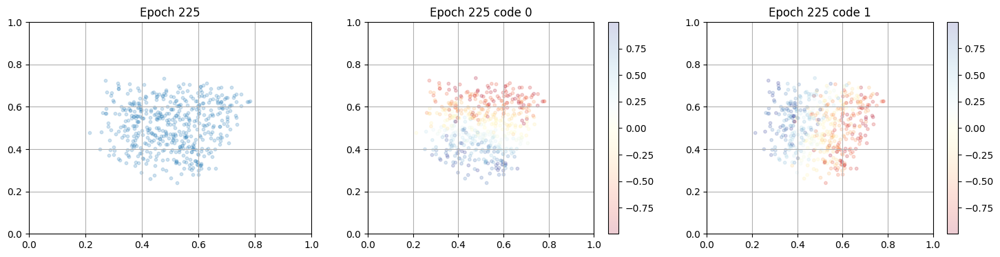

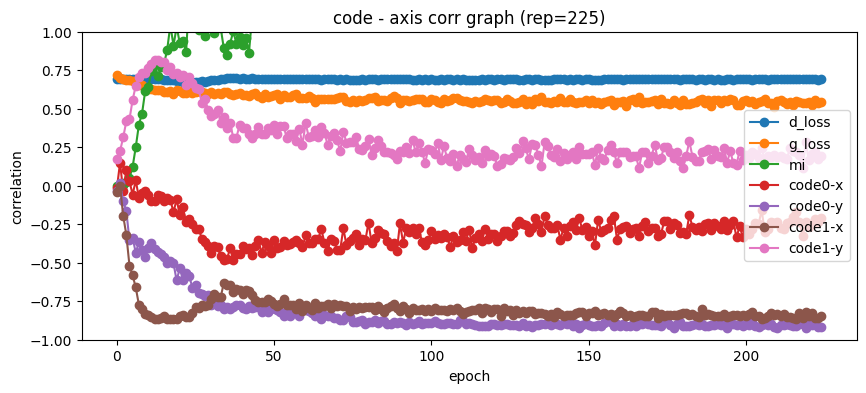

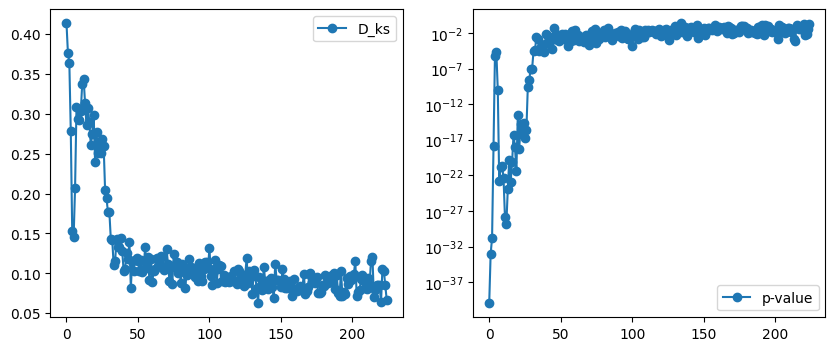

100%|██████████| 31/31 [00:10<00:00,  2.90it/s, G_loss=0.522, D_loss=0.69, MI=1.53] 


epoch: 226, D_loss: 0.6900301364160353, G_loss: 0.5223461918292507, MI = 1.5271140154330962
좌표값 평균 =  0.50081235 0.50589633
D_ks = 0.06831451612903228, p-value = 0.16017531825554546


100%|██████████| 31/31 [00:10<00:00,  2.92it/s, G_loss=0.541, D_loss=0.691, MI=1.58]


epoch: 227, D_loss: 0.6909609283170393, G_loss: 0.5408511863600823, MI = 1.576521372602832
좌표값 평균 =  0.49464938 0.50270057
D_ks = 0.11266935483870974, p-value = 0.0020804368884424908


100%|██████████| 31/31 [00:10<00:00,  2.84it/s, G_loss=0.554, D_loss=0.691, MI=1.33]


epoch: 228, D_loss: 0.6905558205419972, G_loss: 0.5536642862904456, MI = 1.3272016351261446
좌표값 평균 =  0.4985392 0.502134
D_ks = 0.09611290322580651, p-value = 0.013441970500240825


100%|██████████| 31/31 [00:10<00:00,  2.90it/s, G_loss=0.525, D_loss=0.691, MI=1.6] 


epoch: 229, D_loss: 0.6910048588629691, G_loss: 0.5250444412231445, MI = 1.5963884428624184
좌표값 평균 =  0.49828684 0.5016103
D_ks = 0.10018548387096776, p-value = 0.00871051623897389


100%|██████████| 31/31 [00:10<00:00,  2.88it/s, G_loss=0.564, D_loss=0.69, MI=1.48] 


epoch: 230, D_loss: 0.6898730147269464, G_loss: 0.5640018140116045, MI = 1.4777097077138963
좌표값 평균 =  0.50449437 0.5114975
D_ks = 0.06423387096774194, p-value = 0.21449912260143866


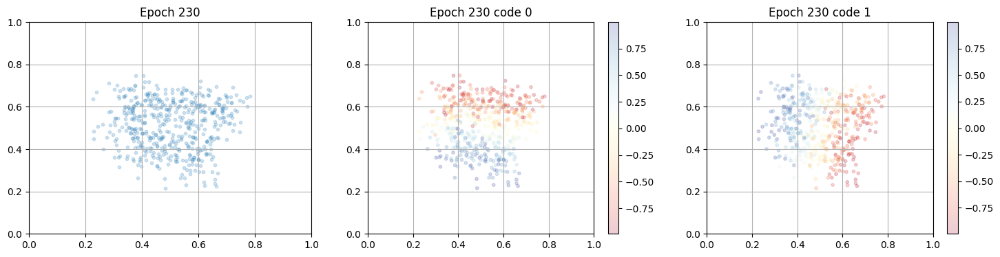

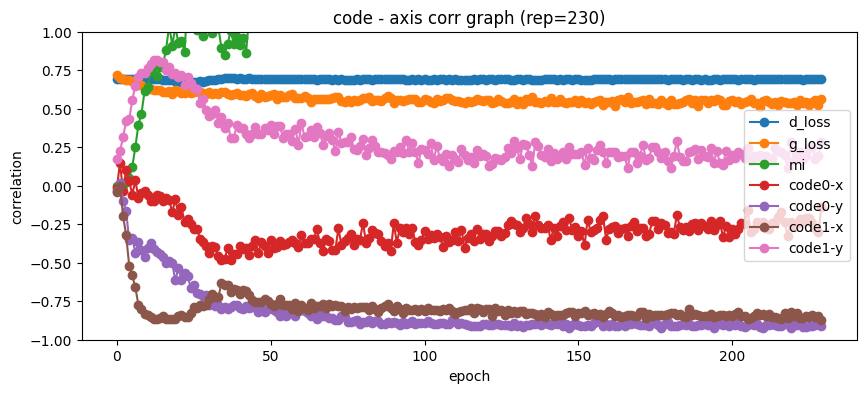

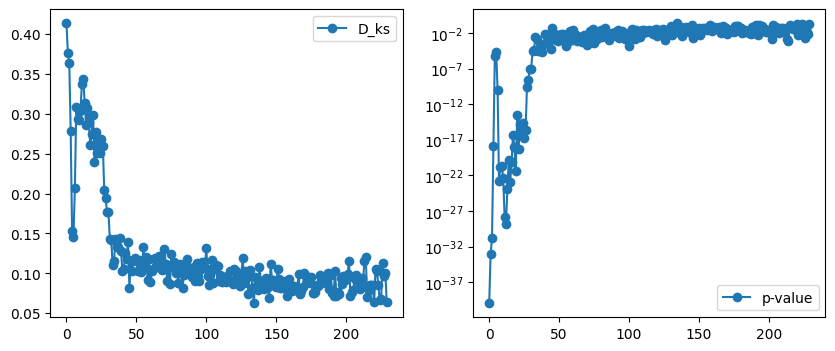

100%|██████████| 31/31 [00:10<00:00,  2.89it/s, G_loss=0.538, D_loss=0.688, MI=1.75]


epoch: 231, D_loss: 0.6883903684154633, G_loss: 0.537625600253382, MI = 1.7546633107046927
좌표값 평균 =  0.5015564 0.5166017
D_ks = 0.09358870967741936, p-value = 0.017488646411556827


100%|██████████| 31/31 [00:10<00:00,  2.88it/s, G_loss=0.545, D_loss=0.692, MI=1.49]


epoch: 232, D_loss: 0.692303676759043, G_loss: 0.5447352490117473, MI = 1.494974491096312
좌표값 평균 =  0.50657743 0.5117028
D_ks = 0.08105645161290326, p-value = 0.056909254247874574


100%|██████████| 31/31 [00:10<00:00,  2.90it/s, G_loss=0.546, D_loss=0.691, MI=1.51]


epoch: 233, D_loss: 0.6914402996340105, G_loss: 0.546280118726915, MI = 1.5057930158030601
좌표값 평균 =  0.50011766 0.5151768
D_ks = 0.0936532258064516, p-value = 0.017378713078090496


100%|██████████| 31/31 [00:10<00:00,  2.86it/s, G_loss=0.554, D_loss=0.692, MI=1.56]


epoch: 234, D_loss: 0.6921727580408896, G_loss: 0.5542032266816785, MI = 1.5553243184281933
좌표값 평균 =  0.5018017 0.5083325
D_ks = 0.08648387096774193, p-value = 0.03499336537028425


100%|██████████| 31/31 [00:10<00:00,  2.89it/s, G_loss=0.532, D_loss=0.693, MI=1.45]


epoch: 235, D_loss: 0.69251993010121, G_loss: 0.5322930014902546, MI = 1.4518108906284455
좌표값 평균 =  0.51103985 0.5028455
D_ks = 0.07959677419354835, p-value = 0.06484246238278336


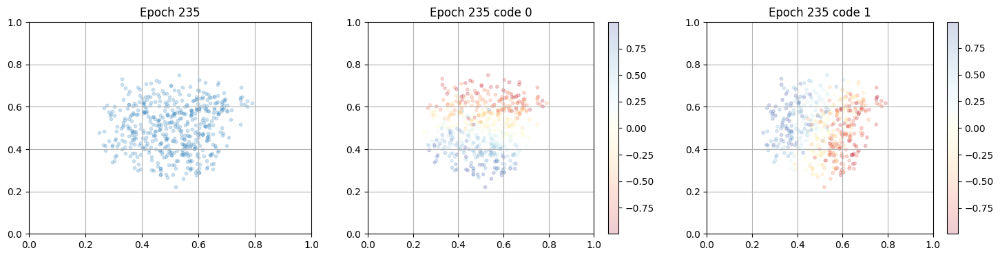

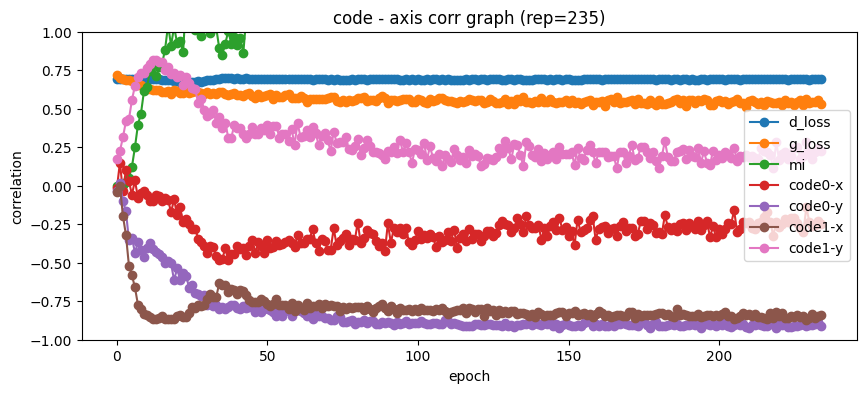

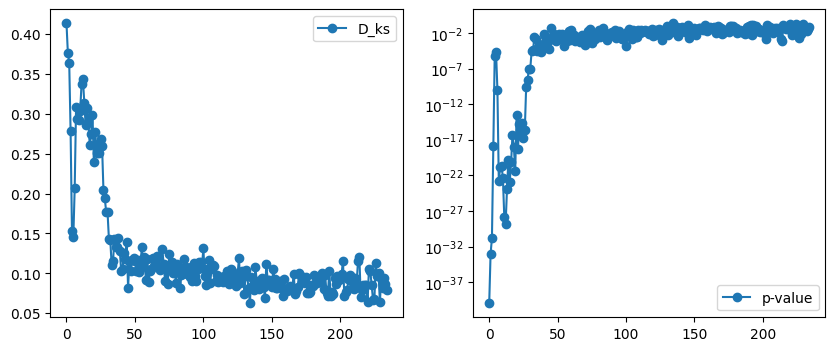

100%|██████████| 31/31 [00:10<00:00,  2.89it/s, G_loss=0.557, D_loss=0.691, MI=1.64]


epoch: 236, D_loss: 0.6912821242886205, G_loss: 0.5566330350214436, MI = 1.636084827684587
좌표값 평균 =  0.4982416 0.5109312
D_ks = 0.08682258064516127, p-value = 0.03390647471777788


100%|██████████| 31/31 [00:10<00:00,  2.88it/s, G_loss=0.553, D_loss=0.689, MI=1.8] 


epoch: 237, D_loss: 0.6891630830303315, G_loss: 0.5528663598722027, MI = 1.8048945290427054
좌표값 평균 =  0.4982947 0.51299345
D_ks = 0.09077419354838709, p-value = 0.023007202905392002


100%|██████████| 31/31 [00:10<00:00,  2.87it/s, G_loss=0.531, D_loss=0.691, MI=1.39]


epoch: 238, D_loss: 0.6909659735618099, G_loss: 0.5310643969043609, MI = 1.387531316088092
좌표값 평균 =  0.5026958 0.5005025
D_ks = 0.07025000000000003, p-value = 0.13826545477400148


100%|██████████| 31/31 [00:10<00:00,  2.84it/s, G_loss=0.559, D_loss=0.691, MI=1.47]


epoch: 239, D_loss: 0.6906444218850905, G_loss: 0.5586669493106103, MI = 1.4709544249119297
좌표값 평균 =  0.495308 0.50299567
D_ks = 0.1050967741935484, p-value = 0.005065063751034129


100%|██████████| 31/31 [00:10<00:00,  2.83it/s, G_loss=0.551, D_loss=0.692, MI=1.49]


epoch: 240, D_loss: 0.6915353017468606, G_loss: 0.5509963708539163, MI = 1.4865236090075584
좌표값 평균 =  0.49493143 0.5121038
D_ks = 0.09120161290322583, p-value = 0.02197615254690333


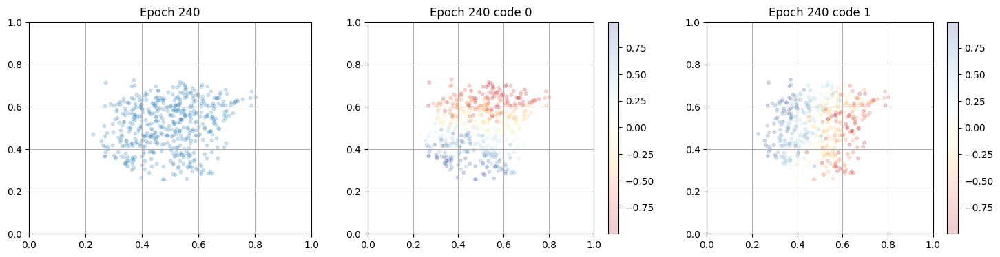

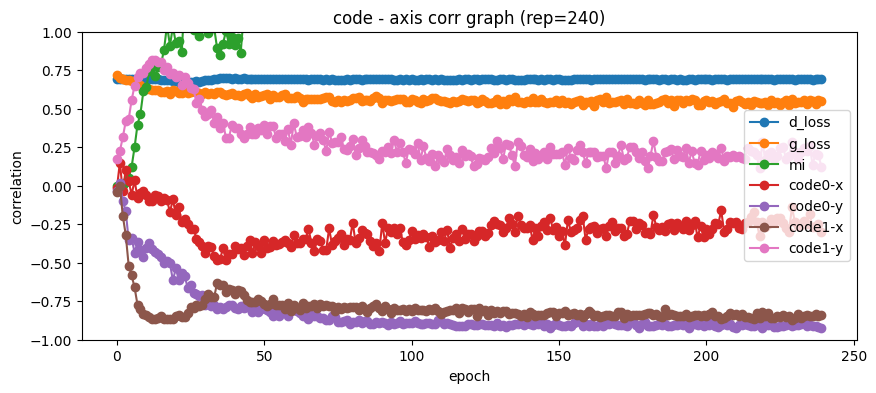

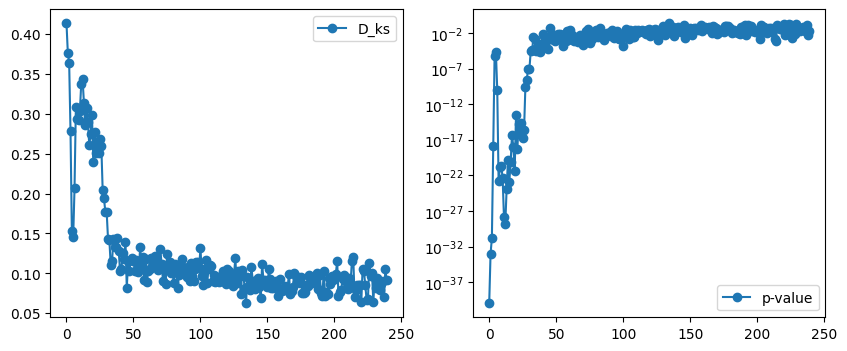

100%|██████████| 31/31 [00:10<00:00,  2.86it/s, G_loss=0.558, D_loss=0.691, MI=1.42]


epoch: 241, D_loss: 0.6908691506231984, G_loss: 0.5580037005486027, MI = 1.4178828270204606
좌표값 평균 =  0.5039712 0.5089217
D_ks = 0.08029838709677414, p-value = 0.06116365988399439


100%|██████████| 31/31 [00:10<00:00,  2.91it/s, G_loss=0.555, D_loss=0.689, MI=1.64]


epoch: 242, D_loss: 0.6890334640779803, G_loss: 0.555155482022993, MI = 1.642143149529734
좌표값 평균 =  0.5058342 0.51449907
D_ks = 0.08849999999999997, p-value = 0.028775091802775103


100%|██████████| 31/31 [00:10<00:00,  2.88it/s, G_loss=0.558, D_loss=0.69, MI=1.27] 


epoch: 243, D_loss: 0.689887410210025, G_loss: 0.5580658297384938, MI = 1.2701995315090302
좌표값 평균 =  0.49675897 0.50295395
D_ks = 0.07632258064516131, p-value = 0.085665061475843


100%|██████████| 31/31 [00:10<00:00,  2.86it/s, G_loss=0.555, D_loss=0.692, MI=1.53]


epoch: 244, D_loss: 0.6922389557284694, G_loss: 0.5547272255343776, MI = 1.5349921641811248
좌표값 평균 =  0.5032683 0.5128134
D_ks = 0.07771774193548392, p-value = 0.07606133957725661


100%|██████████| 31/31 [00:10<00:00,  2.89it/s, G_loss=0.544, D_loss=0.687, MI=1.66]


epoch: 245, D_loss: 0.687067001096664, G_loss: 0.5439526169530807, MI = 1.6586902365088463
좌표값 평균 =  0.5020308 0.51280934
D_ks = 0.09148387096774199, p-value = 0.021527494739455172


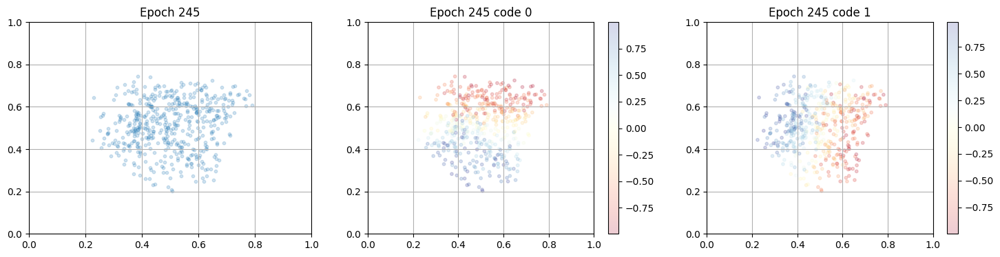

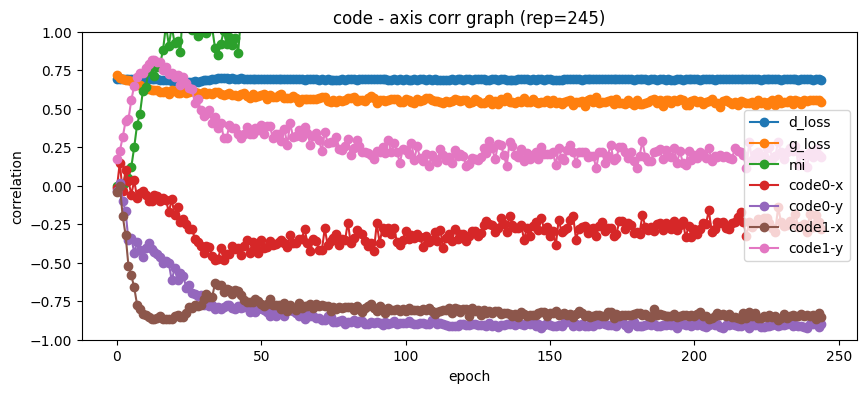

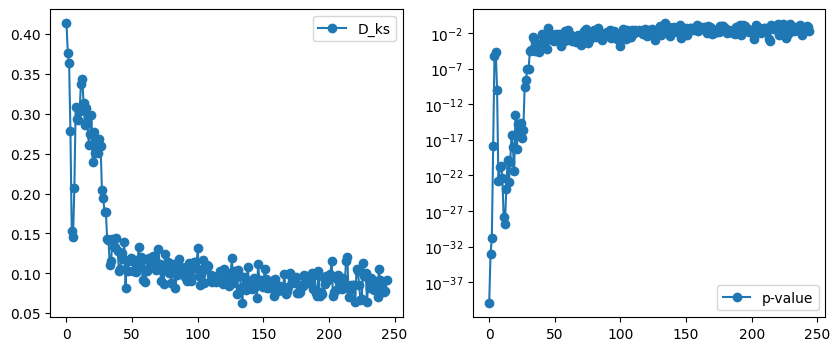

100%|██████████| 31/31 [00:10<00:00,  2.93it/s, G_loss=0.533, D_loss=0.688, MI=1.49]


epoch: 246, D_loss: 0.6881157198259907, G_loss: 0.5331562151831966, MI = 1.4871958359595268
좌표값 평균 =  0.51245224 0.50947756
D_ks = 0.08766935483870969, p-value = 0.031197753289181642


100%|██████████| 31/31 [00:10<00:00,  2.94it/s, G_loss=0.546, D_loss=0.69, MI=1.31] 


epoch: 247, D_loss: 0.6898924919866747, G_loss: 0.546090187564973, MI = 1.3063971904977676
좌표값 평균 =  0.5065171 0.51510084
D_ks = 0.08082258064516123, p-value = 0.0584339918362788


100%|██████████| 31/31 [00:10<00:00,  2.95it/s, G_loss=0.516, D_loss=0.692, MI=1.67]


epoch: 248, D_loss: 0.6921893127502934, G_loss: 0.5162795339861224, MI = 1.6699117633604235
좌표값 평균 =  0.5095286 0.5050155
D_ks = 0.07976612903225802, p-value = 0.06404302477371152


100%|██████████| 31/31 [00:10<00:00,  2.97it/s, G_loss=0.542, D_loss=0.691, MI=1.68]


epoch: 249, D_loss: 0.6909425739319094, G_loss: 0.5419596683594489, MI = 1.677296353924659
좌표값 평균 =  0.51335186 0.51698494
D_ks = 0.10215322580645167, p-value = 0.007048308643221223


100%|██████████| 31/31 [00:10<00:00,  3.00it/s, G_loss=0.547, D_loss=0.689, MI=1.64]


epoch: 250, D_loss: 0.689115132054975, G_loss: 0.5465888832845995, MI = 1.641177350474942
좌표값 평균 =  0.505848 0.51422334
D_ks = 0.09175000000000014, p-value = 0.021032583624730705


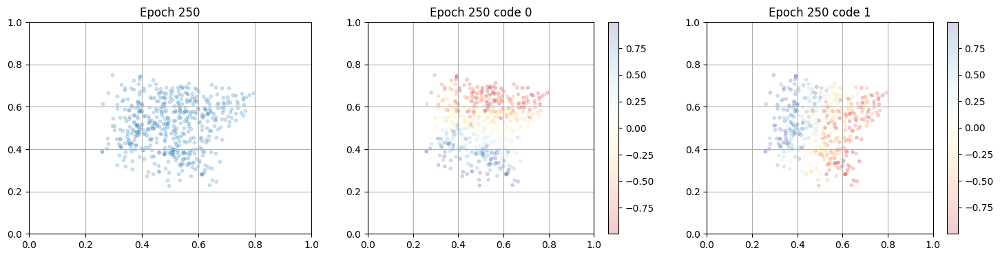

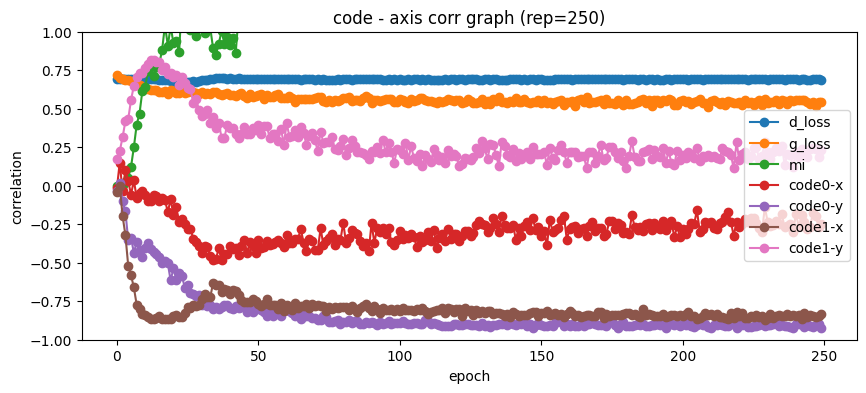

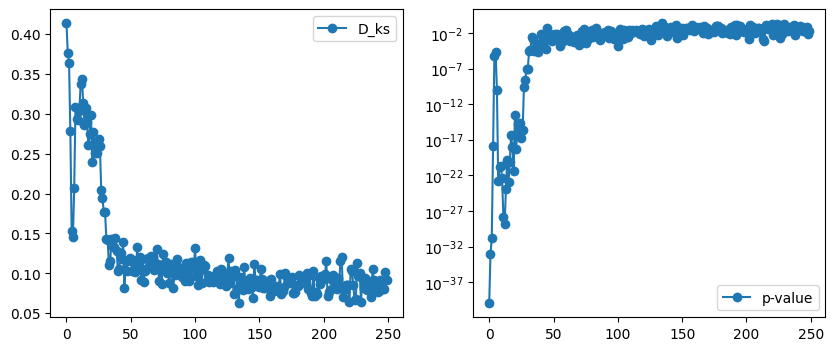

100%|██████████| 31/31 [00:10<00:00,  2.93it/s, G_loss=0.543, D_loss=0.691, MI=1.5] 


epoch: 251, D_loss: 0.6908882683323275, G_loss: 0.5425696305690273, MI = 1.5024632845194108
좌표값 평균 =  0.49455482 0.49842834
D_ks = 0.09966935483870967, p-value = 0.009278459658925275


100%|██████████| 31/31 [00:10<00:00,  2.97it/s, G_loss=0.52, D_loss=0.689, MI=1.39] 


epoch: 252, D_loss: 0.6889730057408733, G_loss: 0.5199004488606607, MI = 1.3929284974451988
좌표값 평균 =  0.5055558 0.5118032
D_ks = 0.09627419354838701, p-value = 0.01321524948563434


100%|██████████| 31/31 [00:10<00:00,  2.97it/s, G_loss=0.538, D_loss=0.69, MI=1.26] 


epoch: 253, D_loss: 0.6897291944872949, G_loss: 0.5383486084399685, MI = 1.2641174177969656
좌표값 평균 =  0.5027393 0.5131638
D_ks = 0.09336290322580648, p-value = 0.017811253042556343


100%|██████████| 31/31 [00:10<00:00,  2.94it/s, G_loss=0.558, D_loss=0.688, MI=1.58]


epoch: 254, D_loss: 0.6883785359321102, G_loss: 0.5583751864971653, MI = 1.582959738469893
좌표값 평균 =  0.5047906 0.5074528
D_ks = 0.07086290322580649, p-value = 0.13228621895281342


100%|██████████| 31/31 [00:10<00:00,  2.94it/s, G_loss=0.541, D_loss=0.691, MI=1.57]


epoch: 255, D_loss: 0.6907786861542733, G_loss: 0.54138399420246, MI = 1.568749475863672
좌표값 평균 =  0.50800973 0.50449514
D_ks = 0.07329032258064513, p-value = 0.10939591859310263


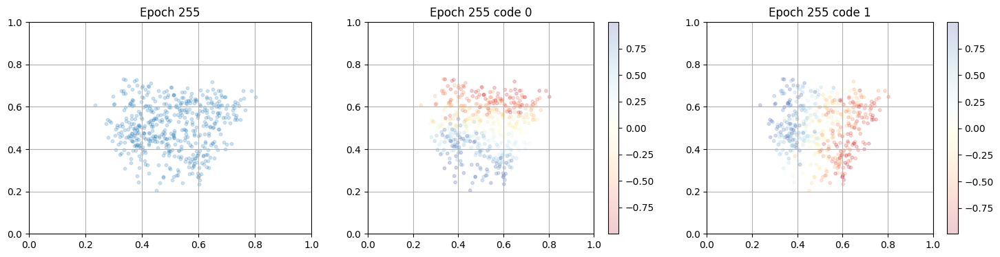

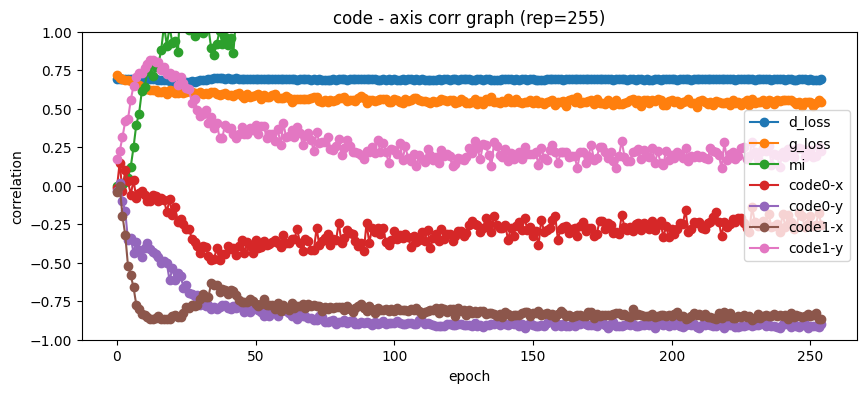

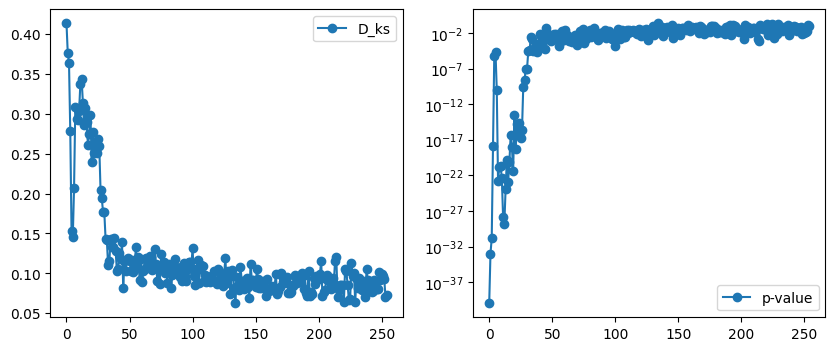

100%|██████████| 31/31 [00:10<00:00,  2.94it/s, G_loss=0.542, D_loss=0.69, MI=1.38] 


epoch: 256, D_loss: 0.68999396985577, G_loss: 0.5424396213023893, MI = 1.3795192640635274
좌표값 평균 =  0.50007784 0.5076476
D_ks = 0.10133870967741937, p-value = 0.007666642307022009


100%|██████████| 31/31 [00:10<00:00,  2.97it/s, G_loss=0.542, D_loss=0.689, MI=1.46]


epoch: 257, D_loss: 0.6889395982988419, G_loss: 0.5416482879269507, MI = 1.4639606052829373
좌표값 평균 =  0.49748784 0.5075119
D_ks = 0.08746774193548387, p-value = 0.031892783172979514


100%|██████████| 31/31 [00:10<00:00,  2.94it/s, G_loss=0.534, D_loss=0.688, MI=1.63]


epoch: 258, D_loss: 0.6879160827206027, G_loss: 0.533779485571769, MI = 1.6324839880389552
좌표값 평균 =  0.4993053 0.50732493
D_ks = 0.06761290322580646, p-value = 0.16836990726406426


100%|██████████| 31/31 [00:10<00:00,  3.03it/s, G_loss=0.536, D_loss=0.691, MI=1.64]


epoch: 259, D_loss: 0.6906119777310279, G_loss: 0.5359574517896099, MI = 1.635307458139235
좌표값 평균 =  0.5105934 0.49621108
D_ks = 0.09148387096774194, p-value = 0.021598815947479717


100%|██████████| 31/31 [00:10<00:00,  3.02it/s, G_loss=0.558, D_loss=0.689, MI=1.62]


epoch: 260, D_loss: 0.6894339630680699, G_loss: 0.5575692172973387, MI = 1.6202634452812132
좌표값 평균 =  0.504994 0.5152299
D_ks = 0.07918548387096777, p-value = 0.0671439357802724


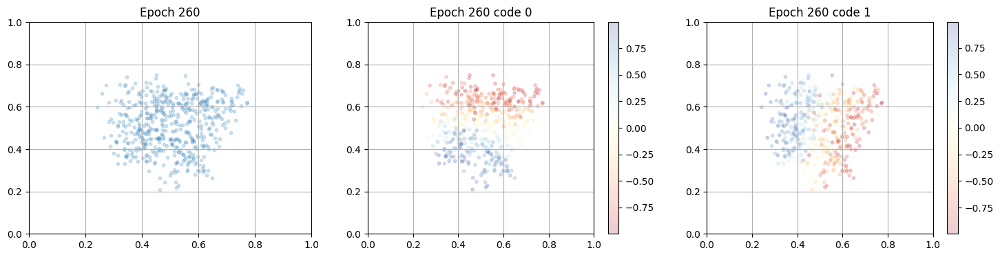

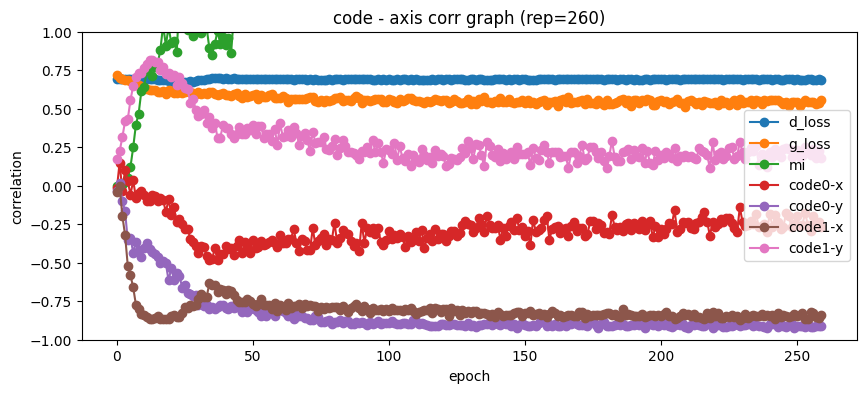

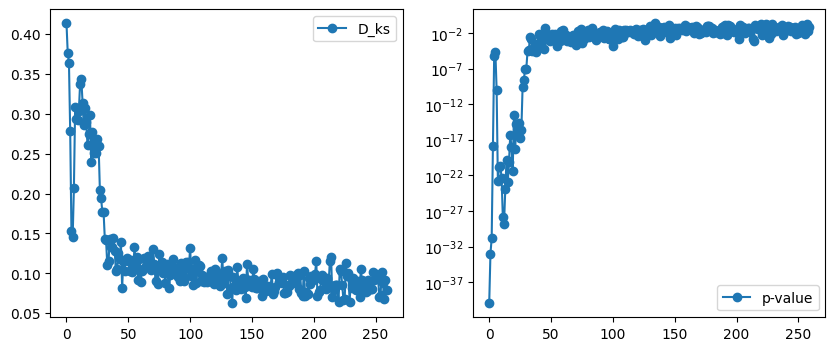

100%|██████████| 31/31 [00:10<00:00,  3.01it/s, G_loss=0.559, D_loss=0.691, MI=1.5] 


epoch: 261, D_loss: 0.6908996393603664, G_loss: 0.5593222687321324, MI = 1.5046686510885916
좌표값 평균 =  0.50498474 0.5113513
D_ks = 0.06150806451612906, p-value = 0.2576077456758322


100%|██████████| 31/31 [00:10<00:00,  3.07it/s, G_loss=0.546, D_loss=0.692, MI=1.68]


epoch: 262, D_loss: 0.6920809380469783, G_loss: 0.5455512077577652, MI = 1.6807131228908416
좌표값 평균 =  0.50186336 0.5094526
D_ks = 0.08958870967741936, p-value = 0.025838995761991168


100%|██████████| 31/31 [00:10<00:00,  3.00it/s, G_loss=0.535, D_loss=0.69, MI=1.29] 


epoch: 263, D_loss: 0.6899750175014618, G_loss: 0.5353493171353494, MI = 1.2884973912469802
좌표값 평균 =  0.5046907 0.51456577
D_ks = 0.09186290322580656, p-value = 0.0208401730263611


100%|██████████| 31/31 [00:10<00:00,  3.01it/s, G_loss=0.54, D_loss=0.691, MI=1.65] 


epoch: 264, D_loss: 0.691333330446674, G_loss: 0.5395362732871887, MI = 1.6495191642353613
좌표값 평균 =  0.5001368 0.5023541
D_ks = 0.08020161290322578, p-value = 0.06162632608323406


100%|██████████| 31/31 [00:10<00:00,  3.05it/s, G_loss=0.539, D_loss=0.688, MI=1.73]


epoch: 265, D_loss: 0.6883827313300102, G_loss: 0.5388845503330231, MI = 1.7284077838543923
좌표값 평균 =  0.49725872 0.5022313
D_ks = 0.07245161290322577, p-value = 0.1168978010977396


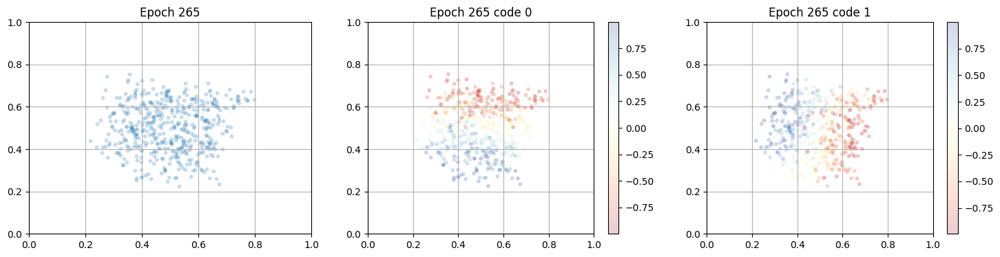

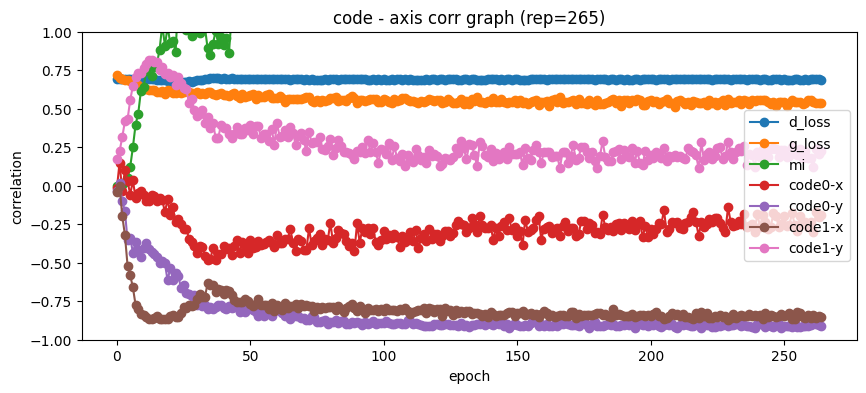

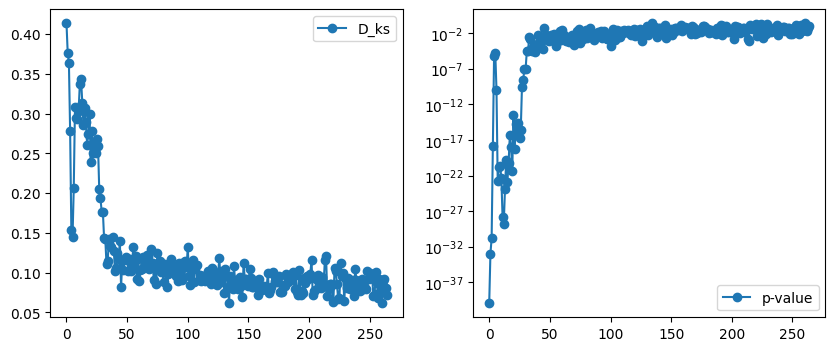

100%|██████████| 31/31 [00:10<00:00,  3.05it/s, G_loss=0.564, D_loss=0.691, MI=1.56]


epoch: 266, D_loss: 0.6906880313350309, G_loss: 0.564327831229856, MI = 1.561276448349799
좌표값 평균 =  0.4992909 0.5026213
D_ks = 0.11651612903225803, p-value = 0.0012862973029760252


100%|██████████| 31/31 [00:10<00:00,  3.06it/s, G_loss=0.525, D_loss=0.69, MI=1.89] 


epoch: 267, D_loss: 0.6899901801540006, G_loss: 0.5245155403690953, MI = 1.8879178320207903
좌표값 평균 =  0.4955895 0.5012303
D_ks = 0.10576612903225807, p-value = 0.004702684539442225


100%|██████████| 31/31 [00:10<00:00,  3.01it/s, G_loss=0.54, D_loss=0.691, MI=1.64] 


epoch: 268, D_loss: 0.6909459887012359, G_loss: 0.5399748192679498, MI = 1.6445117708175414
좌표값 평균 =  0.5006407 0.5103131
D_ks = 0.0773709677419355, p-value = 0.07845570255223232


100%|██████████| 31/31 [00:10<00:00,  3.05it/s, G_loss=0.534, D_loss=0.69, MI=1.51] 


epoch: 269, D_loss: 0.6898292437676461, G_loss: 0.5335101023797066, MI = 1.5111208548468928
좌표값 평균 =  0.49759993 0.50343615
D_ks = 0.07543548387096774, p-value = 0.09200611931710832


100%|██████████| 31/31 [00:10<00:00,  3.05it/s, G_loss=0.542, D_loss=0.69, MI=1.53] 


epoch: 270, D_loss: 0.6896501068145998, G_loss: 0.5421910997359983, MI = 1.5280190917753405
좌표값 평균 =  0.49618626 0.51133627
D_ks = 0.0867258064516129, p-value = 0.03421401873675205


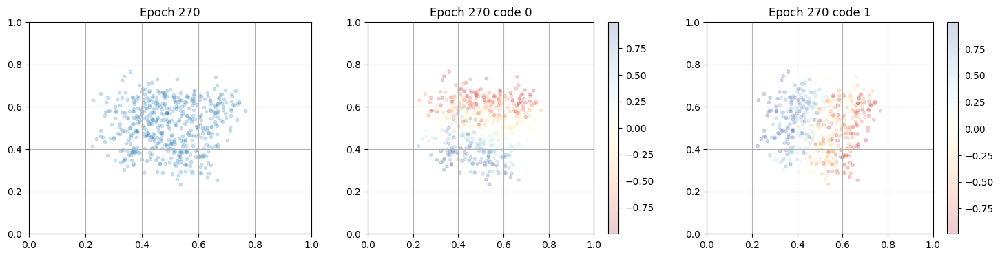

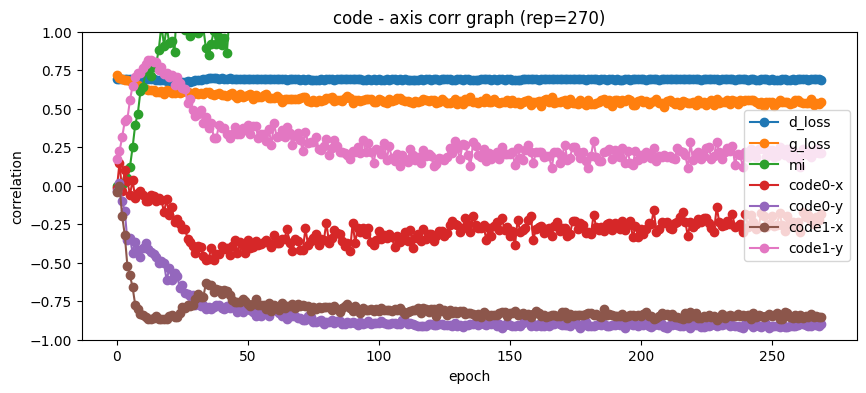

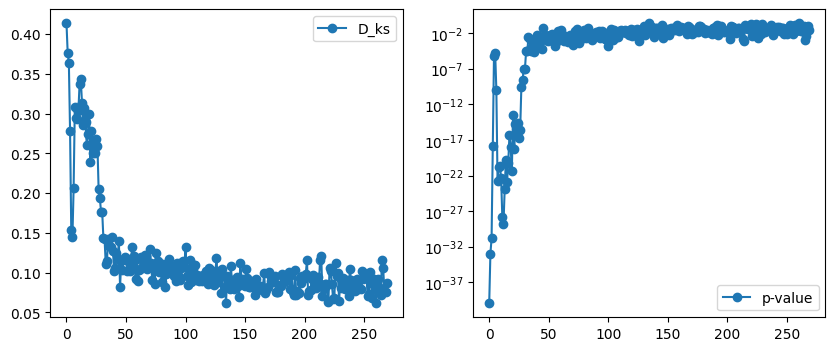

100%|██████████| 31/31 [00:10<00:00,  2.99it/s, G_loss=0.542, D_loss=0.689, MI=1.35]


epoch: 271, D_loss: 0.6892066059574005, G_loss: 0.542435021169724, MI = 1.3507464331003927
좌표값 평균 =  0.4984542 0.50635314
D_ks = 0.08556451612903232, p-value = 0.03797761838946952


100%|██████████| 31/31 [00:10<00:00,  3.07it/s, G_loss=0.535, D_loss=0.69, MI=1.6]  


epoch: 272, D_loss: 0.689549611460778, G_loss: 0.534947657777417, MI = 1.6032225951071708
좌표값 평균 =  0.49770156 0.50865597
D_ks = 0.07859677419354835, p-value = 0.0704689063955825


100%|██████████| 31/31 [00:10<00:00,  2.92it/s, G_loss=0.54, D_loss=0.689, MI=1.44] 


epoch: 273, D_loss: 0.6892576698333986, G_loss: 0.539750297223368, MI = 1.4400120617881897
좌표값 평균 =  0.50324255 0.50262403
D_ks = 0.07390322580645167, p-value = 0.10377116045949004


100%|██████████| 31/31 [00:10<00:00,  2.92it/s, G_loss=0.548, D_loss=0.692, MI=1.67]


epoch: 274, D_loss: 0.6919828960972447, G_loss: 0.548102484595391, MI = 1.6707344189766915
좌표값 평균 =  0.49346724 0.5027825
D_ks = 0.10808870967741932, p-value = 0.0035955440890612727


100%|██████████| 31/31 [00:10<00:00,  2.92it/s, G_loss=0.552, D_loss=0.688, MI=1.6] 


epoch: 275, D_loss: 0.6882665003499677, G_loss: 0.5516431418157393, MI = 1.597837725954671
좌표값 평균 =  0.50107867 0.5078358
D_ks = 0.08515322580645163, p-value = 0.03960453115532295


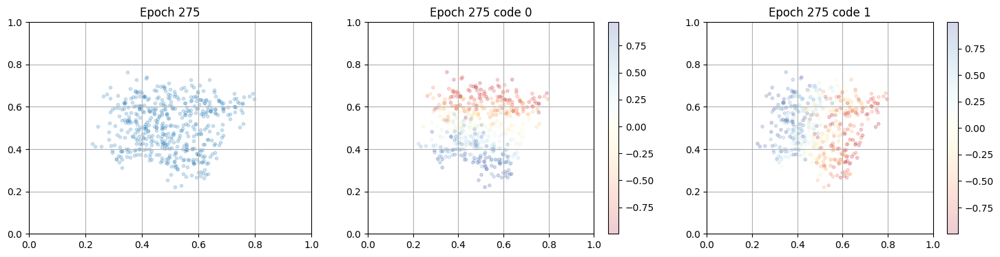

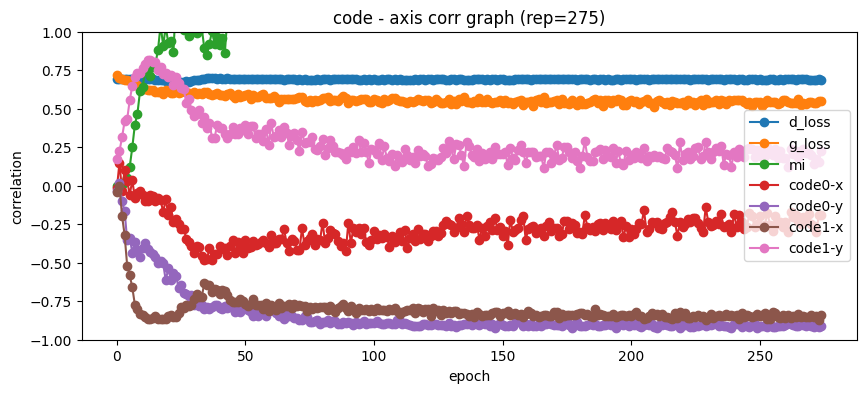

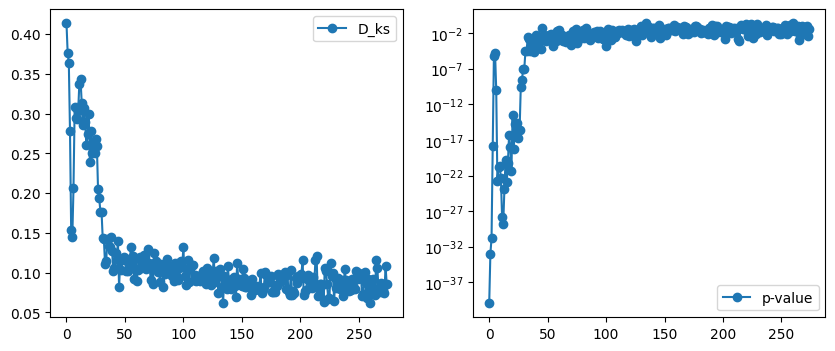

100%|██████████| 31/31 [00:10<00:00,  3.07it/s, G_loss=0.543, D_loss=0.689, MI=1.58]


epoch: 276, D_loss: 0.6889132607367731, G_loss: 0.5427013827908423, MI = 1.5819460768853464
좌표값 평균 =  0.49398428 0.49672112
D_ks = 0.09118548387096775, p-value = 0.022289856965181785


100%|██████████| 31/31 [00:10<00:00,  2.99it/s, G_loss=0.536, D_loss=0.69, MI=1.58] 


epoch: 277, D_loss: 0.6903455449688819, G_loss: 0.5363565202682249, MI = 1.5784340231649336
좌표값 평균 =  0.50663316 0.5028555
D_ks = 0.06150806451612906, p-value = 0.2579058812007138


100%|██████████| 31/31 [00:10<00:00,  3.02it/s, G_loss=0.525, D_loss=0.688, MI=1.5] 


epoch: 278, D_loss: 0.6883391257255308, G_loss: 0.525048743332586, MI = 1.4996035445121028
좌표값 평균 =  0.49957028 0.5123692
D_ks = 0.07605645161290328, p-value = 0.08730265796595744


100%|██████████| 31/31 [00:10<00:00,  3.02it/s, G_loss=0.535, D_loss=0.691, MI=1.41]


epoch: 279, D_loss: 0.6907286317117752, G_loss: 0.534674427201671, MI = 1.4141900693216631
좌표값 평균 =  0.5050962 0.5078687
D_ks = 0.06670161290322588, p-value = 0.1800444272044969


100%|██████████| 31/31 [00:10<00:00,  2.99it/s, G_loss=0.541, D_loss=0.69, MI=1.53] 


epoch: 280, D_loss: 0.6900992874176272, G_loss: 0.541046372344417, MI = 1.5264436544910553
좌표값 평균 =  0.49626788 0.51094705
D_ks = 0.10673387096774195, p-value = 0.004221178011328112


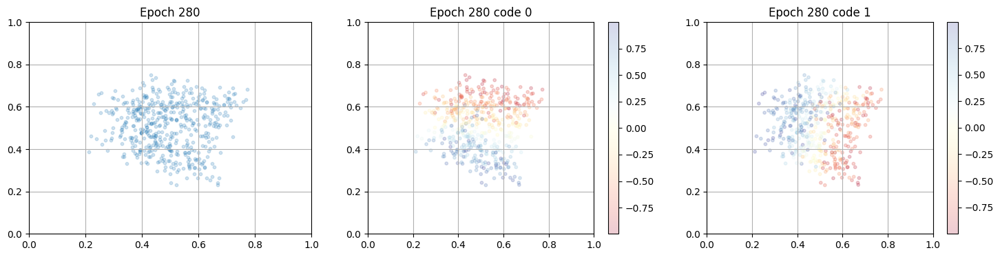

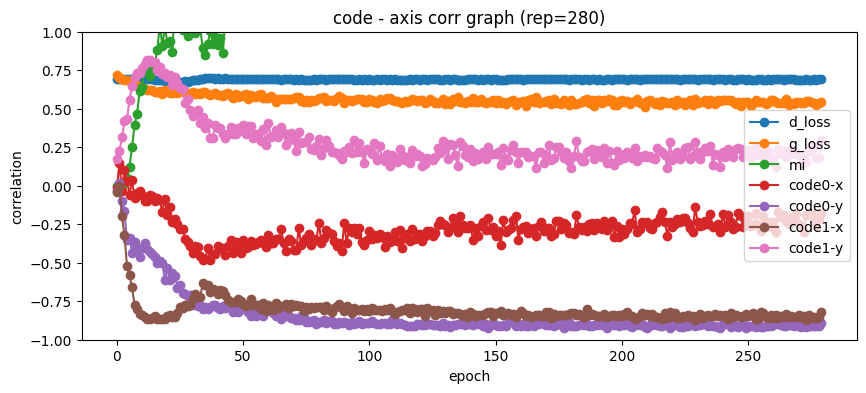

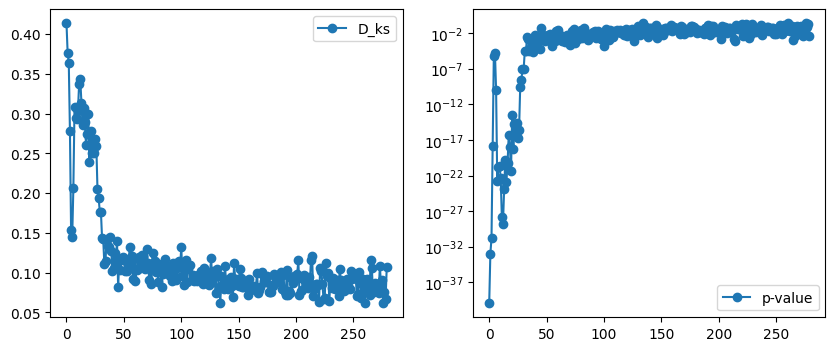

100%|██████████| 31/31 [00:10<00:00,  3.02it/s, G_loss=0.541, D_loss=0.69, MI=1.47] 


epoch: 281, D_loss: 0.6903215435243422, G_loss: 0.5409262074578193, MI = 1.4683966867385372
좌표값 평균 =  0.49646926 0.50450754
D_ks = 0.09322580645161285, p-value = 0.01807388958660651


100%|██████████| 31/31 [00:10<00:00,  3.03it/s, G_loss=0.527, D_loss=0.688, MI=1.71]


epoch: 282, D_loss: 0.6879652623207339, G_loss: 0.5272926082534175, MI = 1.7095719210563167
좌표값 평균 =  0.5058008 0.5077638
D_ks = 0.08178225806451614, p-value = 0.053724374546616945


100%|██████████| 31/31 [00:10<00:00,  2.96it/s, G_loss=0.532, D_loss=0.689, MI=1.38]


epoch: 283, D_loss: 0.6894659515350096, G_loss: 0.5320214138877007, MI = 1.3825629478500736
좌표값 평균 =  0.50056356 0.5092244
D_ks = 0.07437903225806447, p-value = 0.10031850909252693


100%|██████████| 31/31 [00:10<00:00,  3.02it/s, G_loss=0.536, D_loss=0.689, MI=1.54]


epoch: 284, D_loss: 0.689161152608933, G_loss: 0.5360637614803929, MI = 1.5397214577082665
좌표값 평균 =  0.50371313 0.50771374
D_ks = 0.06576612903225812, p-value = 0.19250056918131886


100%|██████████| 31/31 [00:10<00:00,  3.05it/s, G_loss=0.542, D_loss=0.691, MI=1.48]


epoch: 285, D_loss: 0.690998258129243, G_loss: 0.5416904303335375, MI = 1.4827681270337874
좌표값 평균 =  0.50490457 0.4996488
D_ks = 0.07427419354838707, p-value = 0.10083269572311374


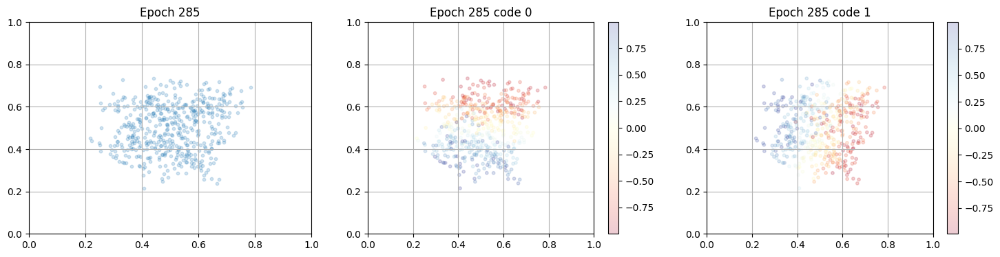

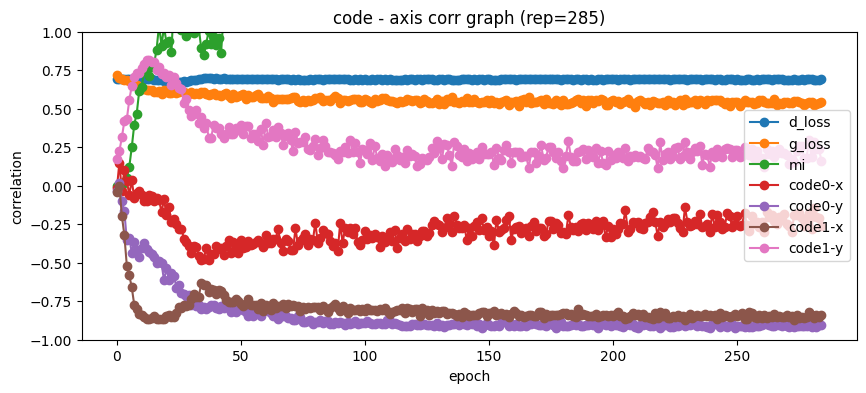

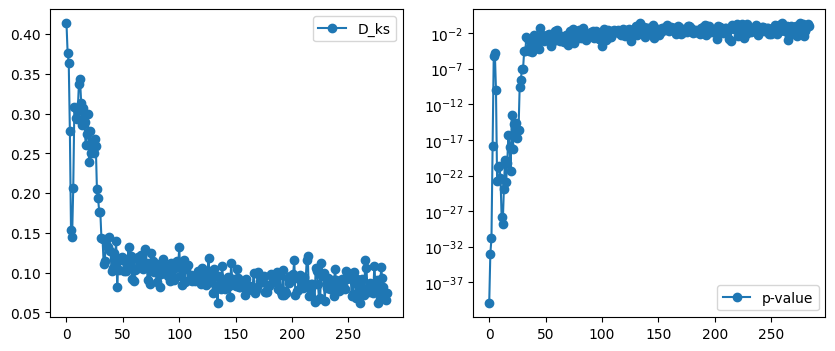

100%|██████████| 31/31 [00:10<00:00,  3.03it/s, G_loss=0.539, D_loss=0.69, MI=1.59] 


epoch: 286, D_loss: 0.6901677789226655, G_loss: 0.5392404160191936, MI = 1.5939434728314799
좌표값 평균 =  0.50281125 0.50364244
D_ks = 0.08551612903225805, p-value = 0.038200816906025586


100%|██████████| 31/31 [00:10<00:00,  3.00it/s, G_loss=0.515, D_loss=0.689, MI=1.66]


epoch: 287, D_loss: 0.6885907746130421, G_loss: 0.5146672062335476, MI = 1.6617357384773992
좌표값 평균 =  0.4898351 0.5049222
D_ks = 0.10262903225806452, p-value = 0.006679019152531652


100%|██████████| 31/31 [00:10<00:00,  3.02it/s, G_loss=0.548, D_loss=0.688, MI=1.4] 


epoch: 288, D_loss: 0.6879338987411991, G_loss: 0.5484416850151554, MI = 1.400067025615323
좌표값 평균 =  0.49509355 0.50836277
D_ks = 0.08587096774193549, p-value = 0.03696986333602191


100%|██████████| 31/31 [00:10<00:00,  3.04it/s, G_loss=0.547, D_loss=0.693, MI=1.74]


epoch: 289, D_loss: 0.6928013659292652, G_loss: 0.5465807741688143, MI = 1.7402379926173919
좌표값 평균 =  0.4996039 0.5006216
D_ks = 0.06733870967741934, p-value = 0.17194144876440787


100%|██████████| 31/31 [00:10<00:00,  3.02it/s, G_loss=0.54, D_loss=0.69, MI=1.4]   


epoch: 290, D_loss: 0.6896295797440314, G_loss: 0.5403737570008924, MI = 1.4007519445111674
좌표값 평균 =  0.49282888 0.50576556
D_ks = 0.09869354838709676, p-value = 0.010215606018731234


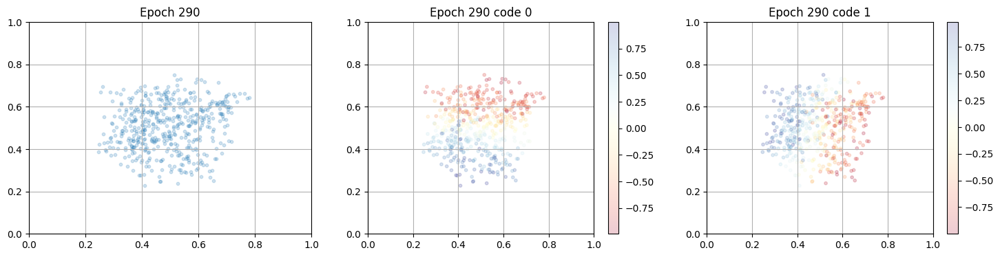

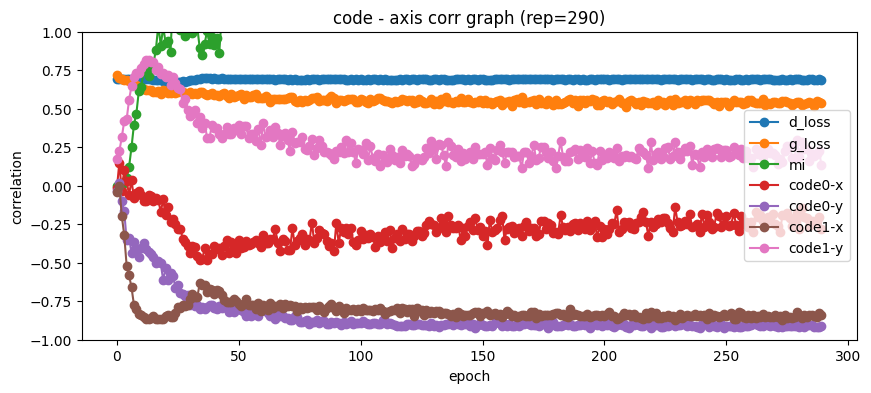

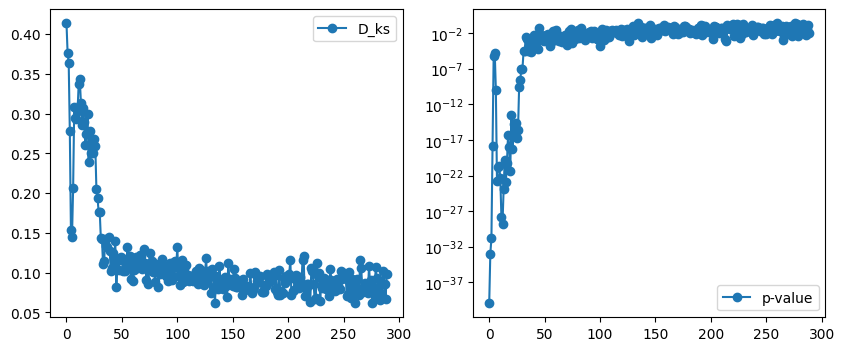

100%|██████████| 31/31 [00:10<00:00,  3.05it/s, G_loss=0.535, D_loss=0.693, MI=1.65]


epoch: 291, D_loss: 0.6929033475537454, G_loss: 0.5345649209714705, MI = 1.6521228071182006
좌표값 평균 =  0.5041931 0.4999826
D_ks = 0.07186290322580646, p-value = 0.12226132824460349


100%|██████████| 31/31 [00:10<00:00,  3.06it/s, G_loss=0.554, D_loss=0.689, MI=1.66]


epoch: 292, D_loss: 0.6890194012272742, G_loss: 0.5536972284317017, MI = 1.661552784904357
좌표값 평균 =  0.51263165 0.5075989
D_ks = 0.06727419354838715, p-value = 0.17271725364035945


100%|██████████| 31/31 [00:10<00:00,  3.07it/s, G_loss=0.532, D_loss=0.689, MI=1.5] 


epoch: 293, D_loss: 0.6885604358488514, G_loss: 0.5318640009049447, MI = 1.4999436603919152
좌표값 평균 =  0.5010358 0.51531434
D_ks = 0.0976209677419354, p-value = 0.0115204231198698


100%|██████████| 31/31 [00:10<00:00,  3.05it/s, G_loss=0.554, D_loss=0.689, MI=1.37]


epoch: 294, D_loss: 0.6889822675335792, G_loss: 0.5542746695779985, MI = 1.3725524198624395
좌표값 평균 =  0.4989246 0.5031079
D_ks = 0.06353225806451618, p-value = 0.22502920562409054


100%|██████████| 31/31 [00:10<00:00,  3.06it/s, G_loss=0.57, D_loss=0.689, MI=1.62] 


epoch: 295, D_loss: 0.6891223384488013, G_loss: 0.569926974273497, MI = 1.6194553158936962
좌표값 평균 =  0.4998559 0.50544584
D_ks = 0.07279032258064516, p-value = 0.11323673844608702


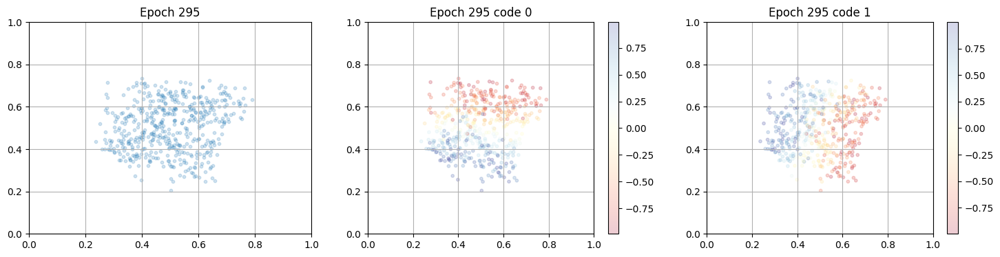

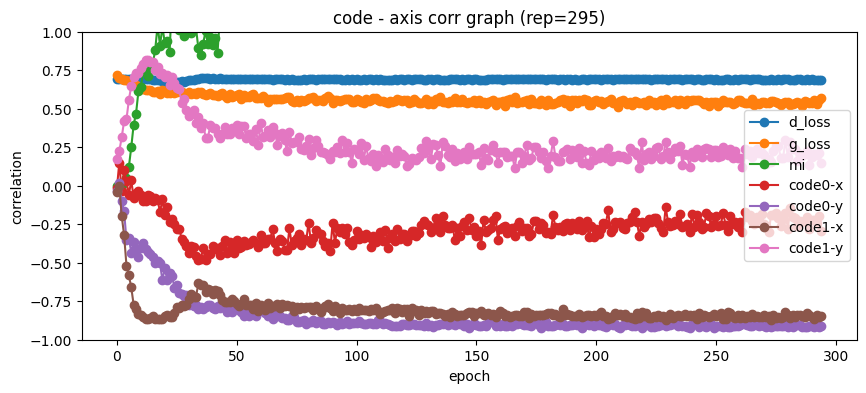

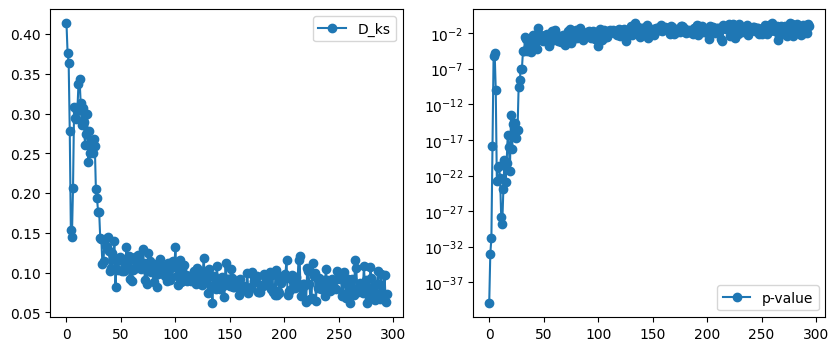

100%|██████████| 31/31 [00:10<00:00,  3.01it/s, G_loss=0.553, D_loss=0.69, MI=1.54] 


epoch: 296, D_loss: 0.6898928842236919, G_loss: 0.5530703567689464, MI = 1.542719594893917
좌표값 평균 =  0.50980765 0.497588
D_ks = 0.08194354838709675, p-value = 0.05248906806375773


100%|██████████| 31/31 [00:10<00:00,  3.03it/s, G_loss=0.522, D_loss=0.692, MI=1.57]


epoch: 297, D_loss: 0.691619671160175, G_loss: 0.5216630360772533, MI = 1.5721831860080842
좌표값 평균 =  0.504818 0.5114288
D_ks = 0.10033870967741934, p-value = 0.008619636160569034


100%|██████████| 31/31 [00:10<00:00,  3.05it/s, G_loss=0.529, D_loss=0.689, MI=1.55]


epoch: 298, D_loss: 0.6891559977685252, G_loss: 0.5289321734059241, MI = 1.5484305033760686
좌표값 평균 =  0.50467813 0.50378656
D_ks = 0.09146774193548388, p-value = 0.021541863837172933


100%|██████████| 31/31 [00:10<00:00,  3.03it/s, G_loss=0.522, D_loss=0.691, MI=1.46]


epoch: 299, D_loss: 0.6911602193309415, G_loss: 0.5218619809996697, MI = 1.4598115644147318
좌표값 평균 =  0.4937254 0.49910995
D_ks = 0.10223387096774192, p-value = 0.007013853340740037


100%|██████████| 31/31 [00:10<00:00,  3.02it/s, G_loss=0.514, D_loss=0.691, MI=1.69]


epoch: 300, D_loss: 0.6910033129876659, G_loss: 0.514379435008572, MI = 1.693515262296123
좌표값 평균 =  0.49976158 0.49372396
D_ks = 0.10383870967741934, p-value = 0.005809424738523222


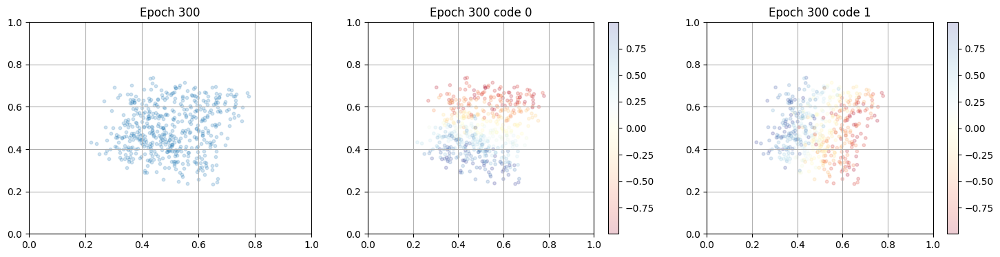

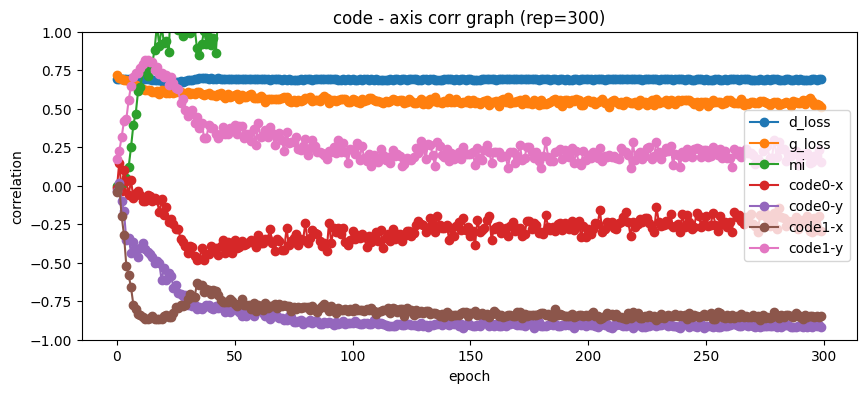

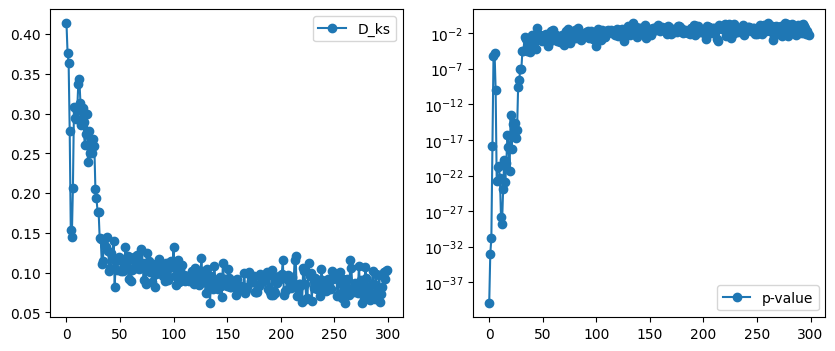

In [35]:
import ndtest
import openpyxl
epoch = 300

recorder_keywords = ['d_loss', 'g_loss', 'mi', 'D_ks', 'p-value']
for i in range(code_qubits):
    recorder_keywords.append(f'code{i}-x')
    recorder_keywords.append(f'code{i}-y')

recorder = {k: [] for k in recorder_keywords}
final_rep = 0

for rep in range(1, epoch+1):
    np.random.shuffle(x)
    iter_num = int(len(x)*0.25//BATCH_SIZE) # 매번 50% 추출해서 학습. 셔플하니까 자투리 생기는건 무시.
    
    G_loss_sum = 0.0
    D_loss_sum = 0.0
    mi_sum = 0.0
    pbar = tqdm(range(iter_num))
    log_gen_outputs = []
    log_gen_codes = []
    
    for i in pbar:
        batch = torch.FloatTensor(x[BATCH_SIZE * i : BATCH_SIZE * i + BATCH_SIZE])
        
        # train generator
        generator_seed = torch.rand((BATCH_SIZE, n_qubits)) * 2 - 1
        generator_output, generator_loss = generator_train_step(generator_params, generator_seed, use_mine=use_mine, _qmine=use_qmine)
        G_opt.zero_grad()
        generator_loss.requires_grad_(True)
        generator_loss.backward()
        G_opt.step()

        # train discriminator
        fake_input = generator_output.detach().to(torch.float32)
        disc_loss = disc_cost_fn(batch, fake_input, smoothing=False)
        D_opt.zero_grad()
        disc_loss.requires_grad_(True)
        disc_loss.backward()
        D_opt.step()

        # train mine
        code_input = generator_seed[:, -code_qubits:] 
        pred_xy = mine(code_input, fake_input)
        code_input_shuffle = code_input[torch.randperm(BATCH_SIZE)]
        pred_x_y = mine(code_input_shuffle, fake_input)
        mi = -torch.mean(pred_xy) + torch.log(torch.mean(torch.exp(pred_x_y)))
        M_opt.zero_grad()
        mi.requires_grad_(True)
        mi.backward()
        M_opt.step()

        D_loss_sum += disc_loss.item()
        G_loss_sum += generator_loss.item()
        mi_sum -= mi.item() # (-1)곱해져 있어서 빼야함.

        pbar.set_postfix({'G_loss': G_loss_sum/(i+1), 'D_loss': D_loss_sum/(i+1), 'MI': mi_sum/(i+1)})
        log_gen_outputs.append(fake_input.numpy())
        log_gen_codes.append(code_input.numpy())

    G_scheduler.step()
    D_scheduler.step()
    M_scheduler.step()

    recorder['d_loss'].append(D_loss_sum/iter_num)
    recorder['g_loss'].append(G_loss_sum/iter_num)
    recorder['mi'].append(mi_sum/iter_num)
    
    log_gen_outputs = np.concatenate(log_gen_outputs, axis=0)
    log_gen_codes = np.concatenate(log_gen_codes, axis=0)
    print("epoch: {}, D_loss: {}, G_loss: {}, MI = {}".format(rep, D_loss_sum/iter_num, G_loss_sum/iter_num, mi_sum/iter_num))
    print("좌표값 평균 = ", np.mean(log_gen_outputs[:,0]), np.mean(log_gen_outputs[:,1]))

    df = pd.DataFrame({'x': log_gen_outputs[:, 0], 'y': log_gen_outputs[:, 1]})
    for i in range(code_qubits):
        df[f'code{i}']=log_gen_codes[:, i]
    corr_mat = df.corr().to_numpy()
    for i in range(code_qubits):
        recorder[f'code{i}-x'].append(corr_mat[0, i+2])
        recorder[f'code{i}-y'].append(corr_mat[1, i+2])
    
    p_value, D_ks = ndtest.ks2d2s(log_gen_outputs[:, 0], log_gen_outputs[:, 1], x[:, 0], x[:, 1], extra=True)
    recorder['D_ks'].append(D_ks)
    recorder['p-value'].append(p_value)
    print("D_ks = {}, p-value = {}".format(D_ks, p_value))

    visualize_output(log_gen_outputs, log_gen_codes, title, rep, recorder)
    with open(f'result/{title}/Opts_{rep}.pkl', 'wb') as file:
        pickle.dump((G_opt, D_opt, M_opt), file)
    with open(f'result/{title}/schedulers_{rep}.pkl', 'wb') as file:
        pickle.dump((G_scheduler, D_scheduler, M_scheduler), file)
    with open(f'result/{title}/generator_{rep}.pkl', 'wb') as file:
        pickle.dump(generator_params, file)


    df = pd.DataFrame(recorder)
    output_filename = f'result/{title}/recorder.xlsx'
    df.to_excel(output_filename, index=False)

    final_rep = rep

# Target distribution 저장

In [ ]:
plt.figure(figsize=(5,5))
plt.scatter(x[:,0], x[:,1], s=2.0)
plt.title('Target distribution')
plt.xlim((0, 1))
plt.ylim((0, 1))
plt.savefig(f'result/{title}/target.png', dpi=300)
plt.show()